In [1]:
# depending on where you run this, this may have to be %matplotlib notebook
%matplotlib inline

import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk 
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions 

%matplotlib inline

In [2]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'  

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_second = 86400

In [3]:
# define the plotting parameters

figsize = (8,4)

In [4]:
# import the data

# choose a TIC ID to analyze
ticid =  353894978

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_etv_primary.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary.csv"


# import data using Lightkurve
sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')
display(sr)
search_result = sr.download_all().stitch()

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 14,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
1,TESS Sector 15,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
2,TESS Sector 16,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
3,TESS Sector 17,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
4,TESS Sector 18,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
5,TESS Sector 19,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
6,TESS Sector 20,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
7,TESS Sector 21,2020,SPOC,120,353894978,0.0,"G022099 , G022208"
8,TESS Sector 22,2020,SPOC,120,353894978,0.0,"G022099 , G022208"


554372

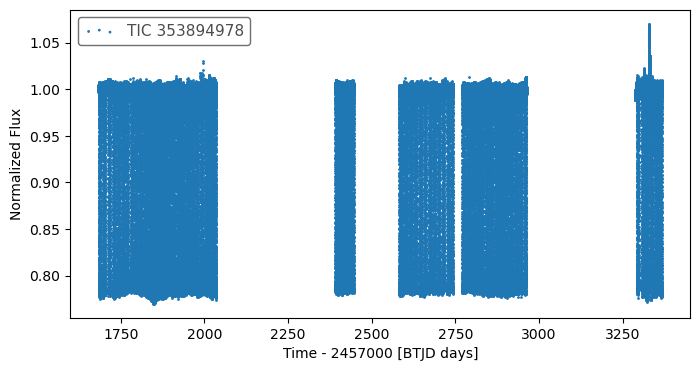

In [5]:
# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)

# t0 = 2337.376
# period_triple = 0.774

mask = time < 0  # (time > 2893.16-1) & (time < 2893.16+1) 

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data 

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})


### Define epoch, period, duration

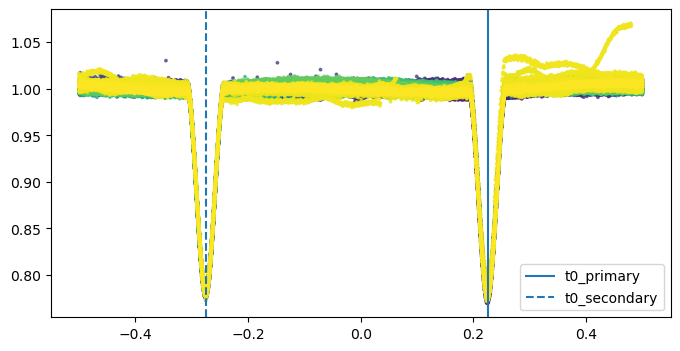

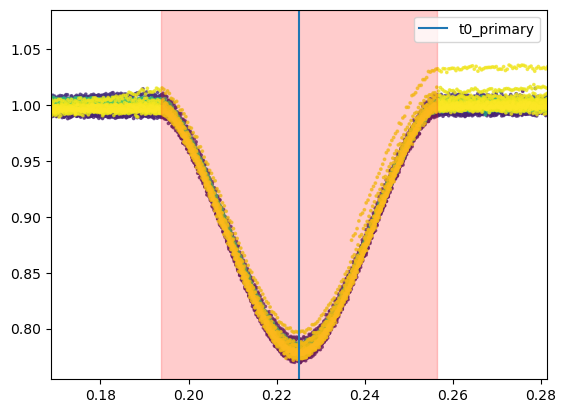

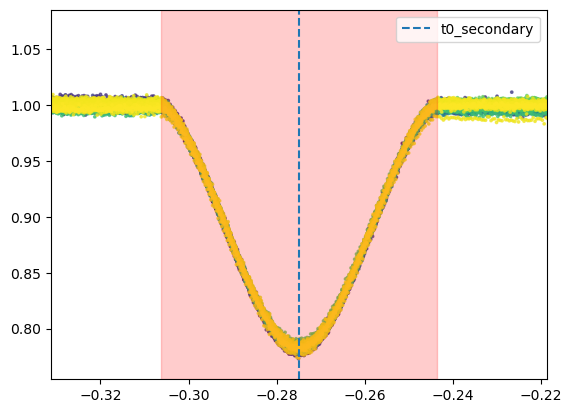

In [16]:
# define the orbital period and the t0 

# primary , or primary and secondary caught in 1 TCE,
# assuming primary / secondary caught in 1 TCE for now
# epoch=1683.9733, duration_hr=5.0161, period=1.670912, label="s0014-s0060:TCE1", 
#  MCMC, including ingress/egress (1.2X eclipse duration): 3.341825763874847
#  MCMC, excluding ingress/egress (0.8X eclipse duration): 3.341824636945139, t0=1685.644210677748, std_p: 2.1623633575339118e-06 ; std_t0: 2.1998472571143603e-05

# period = 1.670912 * 2  # TCE1
# period = 3.341826  # MCMC, 1.2X duration
period = 3.341825  # MCMC, 0.8X duration

# t0_primary = 1683.9733 + period / 2 # TCE1
# t0_secondary = 1683.9733

t0_primary = 1685.644  #MCMC
t0_secondary = t0_primary + period / 2


duration_hr_primary = 5.0161  # used for the window to cut the lighcurve around eclipses in later cells
duration_hr_secondary = 5.0161


# Move t0 to the first dip in the data (some of the subsequent codes, espically fit_each_eclipse(), assumes that)
t0_primary = t0_primary - int((t0_primary - data['time'][0]) / period) * period
if t0_secondary is not None:
    t0_secondary = t0_secondary - int((t0_secondary - data['time'][0]) / period) * period

t0_for_plotting = 0  # keep 0 for plotting purposes
if t0_secondary is not None:
    t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.45  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
t1_p, t4_p = etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.5 * duration_hr_primary / 24/ period, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.5 * duration_hr_primary / 24/ period
plt.xlim(t1_p - 0.025, t4_p + 0.025);
plt.axvspan(t1_p, t4_p, color="red", alpha=0.2);plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

if t0_secondary is not None:
    plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
    t1_s, t4_s = etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.5 * duration_hr_secondary / 24/ period, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.5 * duration_hr_secondary / 24/ period
    plt.xlim(t1_s - 0.025, t4_s + 0.025);
    plt.axvspan(t1_s, t4_s, color="red", alpha=0.2);plt.legend();
    plt.legend();
    # plt.ylim(0.975, 1.005);
    plt.show()

### Detrend (optional)

- detrended flux is in `flux_detrended`, and won't be used in subsequent work by default

In [ ]:
# show data to visualize what's changed in each step below
data  

In [ ]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

In [ ]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

In [ ]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
fig, ax = plt.subplots(figsize = figsize)
plt.scatter(data.phase, data.flux_detrended, s = 1)
plt.show()

### Now that the data is ready we can start 

In [17]:
# define the midpoints of the primary and secondary eclipses and the window width

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
# midpoint_p -= 0.004  # the offset is added back to t0_primary (& secondary above
print('Primary:  ', t0_primary, midpoint_p)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
# window_width_p = 1.2 * duration_hr_primary / 24 / period   # it seems to be difficult to bit model the flat bottom and the curves outside, focus on the overall shape for now
window_width_p = 0.8 * duration_hr_primary / 24 / period   # it seems to be difficult to bit model the flat bottom and the curves outside, focus on the overall shape for now
print("window_width_p (phase):", window_width_p)

data_primary = data[(data['phase'] > midpoint_p - window_width_p / 2) & (data['phase'] < midpoint_p + window_width_p / 2) ]
ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)


if t0_secondary is not None:
    midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]
    print('Secondary:', t0_secondary, midpoint_s)

    # the coshgauss model seems problematic, try to use a larger width to give it more shape to fit
    # window_width_s = 1.2 * duration_hr_secondary / 24 / period
    window_width_s =  0.8 * duration_hr_secondary / 24 / period
    print("window_width_s (phase):", window_width_s)

    data_secondary = data[(data['phase'] > midpoint_s - window_width_s / 2) & (data['phase'] < midpoint_s + window_width_s / 2) ]
    ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V)
# t0 in normalixed phase
start_vals = [1.0, -0.216, midpoint_p, 0.014, 1.1]
start_vals_s = [1.0, -0.216, midpoint_s, 0.014, 1.1]

# -- -- -- -- -- -- -- -- --
# etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
etv_functions.plot_initial_guess_interactive(data_primary, ph_binned, flux_binned, err_binned, "midpoint_p", *start_vals)
if t0_secondary is not None:
    # etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)
    etv_functions.plot_initial_guess_interactive(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, "midpoint_s", *start_vals_s)

print("Start params for  fitting period with MCMC on df_primary:")
print(f"[{start_vals[0]}, {start_vals[1]}, t0_primary, {start_vals[3]}, {start_vals[4]}, {period}],");

Primary:   1685.644 0.2249999999999811
window_width_p (phase): 0.050033539557976056
Secondary: 1683.9730875 -0.2750000000000147
window_width_s (phase): 0.050033539557976056


Output(layout=Layout(padding='1em 0px'))

Output(layout=Layout(padding='1em'))

Output(layout=Layout(padding='1em 0px'))

Output(layout=Layout(padding='1em'))

Start params for  fitting period with MCMC on df_primary:
[1.0, -0.216, t0_primary, 0.014, 1.1, 3.341825],


emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████████| 20/20 [00:12<00:00,  1.61it/s]


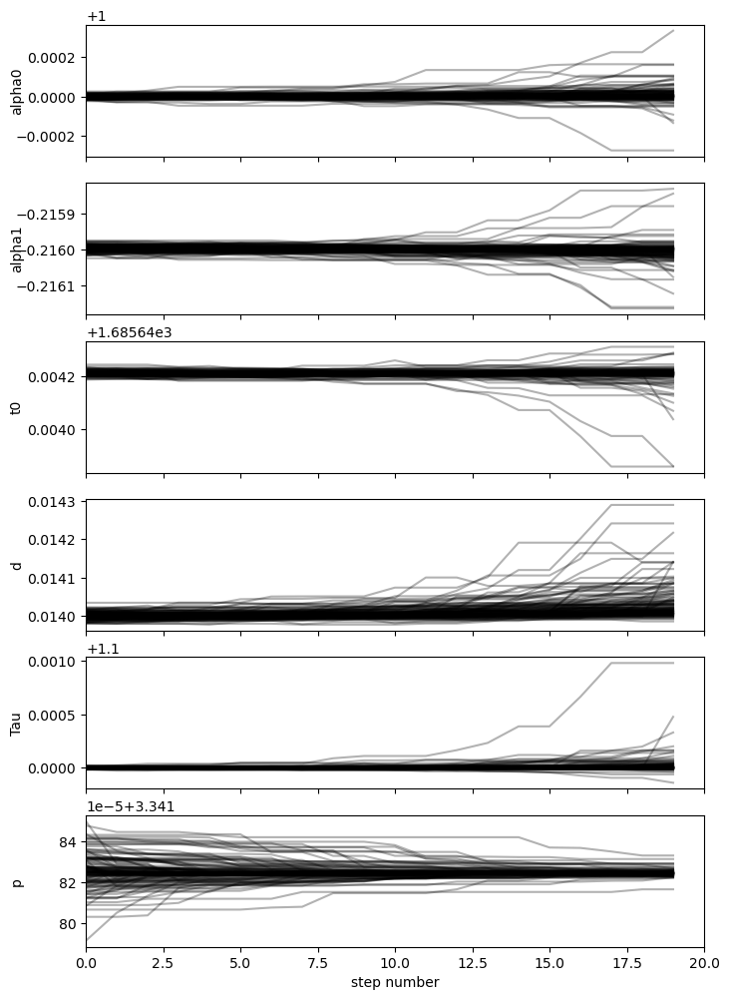

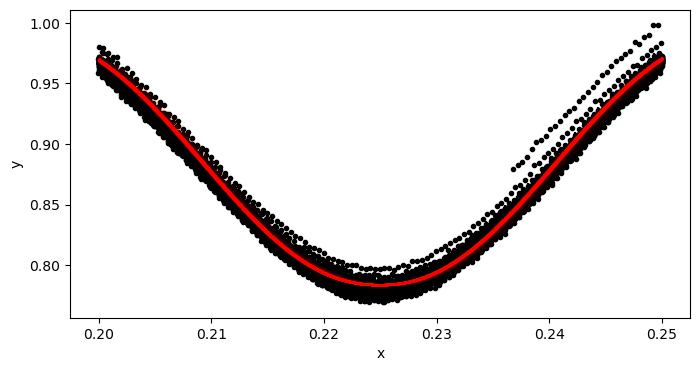

mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p = 1.0000011557081305, -0.2160008150888106, 1685.644210677748, 0.014008367607760544, 1.1000025307666919, 3.341824636945139
std_p: 2.1623633575339118e-06


In [14]:
# use MCMC to refine the period

use_mcmc_to_fit_period = True


if use_mcmc_to_fit_period:
    import etv_functions_with_period as etvp

    # enable info logging
    etv_functions.enable_info_log_for_jupyter()
        
    # MCMC result
    # mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p = 1.0000011557081305, -0.2160008150888106, 1685.644210677748, 0.014008367607760544, 1.1000025307666919, 3.341824636945139
    # std_p: 2.1623633575339118e-06 ; std_t0: 2.1998472571143603e-05
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p, fit_params_p_stats = etvp.run_mcmc_initial_fit_p(
        data_primary[:],
        [1.0, -0.216, t0_primary, 0.014, 1.1, 3.341826],
        nruns=20, discard=1, 
        # nruns=1000, discard=600, 
        pool=-2,
        plot_chains=True,
        plot=True,
        also_return_stats=True,
    )
    print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, mean_p]]))
    print("std_p:", fit_params_p_stats["std_p"], "; std_t0:", fit_params_p_stats['std_t0'])

    

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 1000/1000 [02:27<00:00,  6.76it/s]


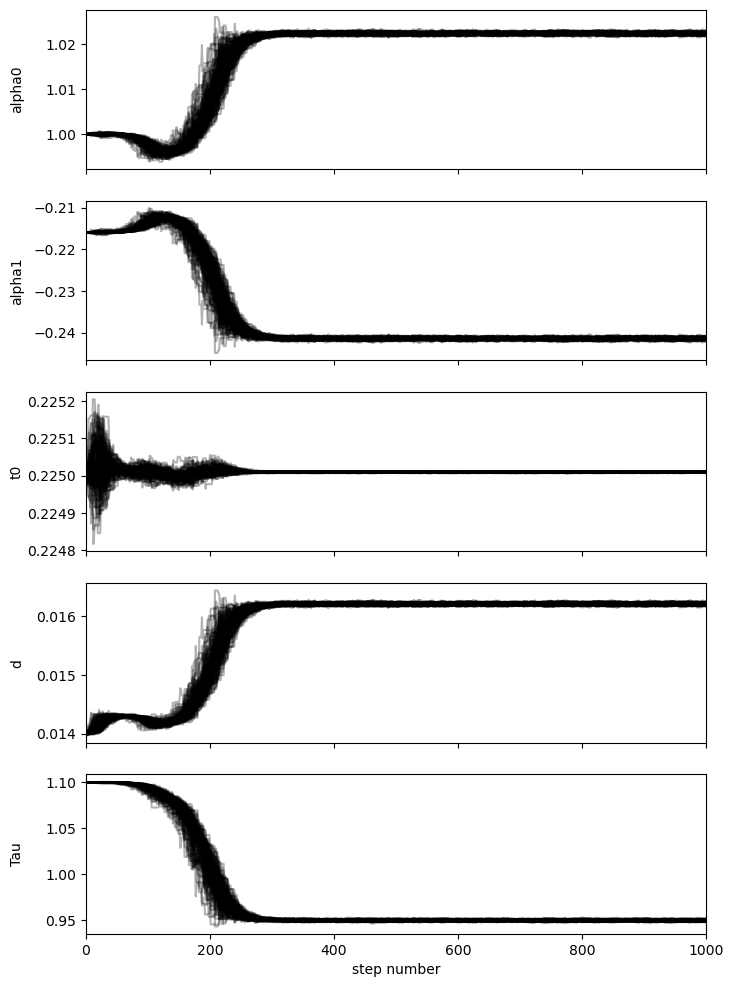

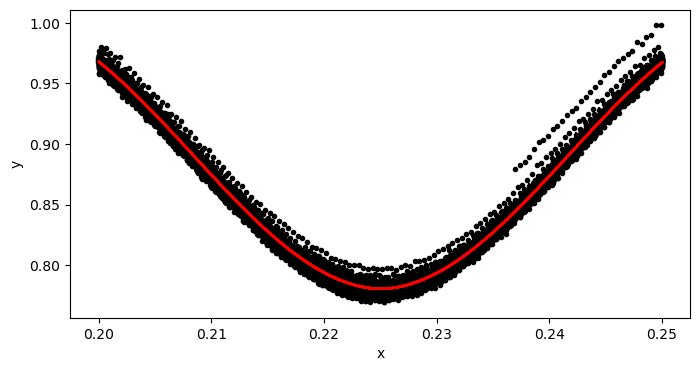

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 1000/1000 [02:23<00:00,  6.95it/s]


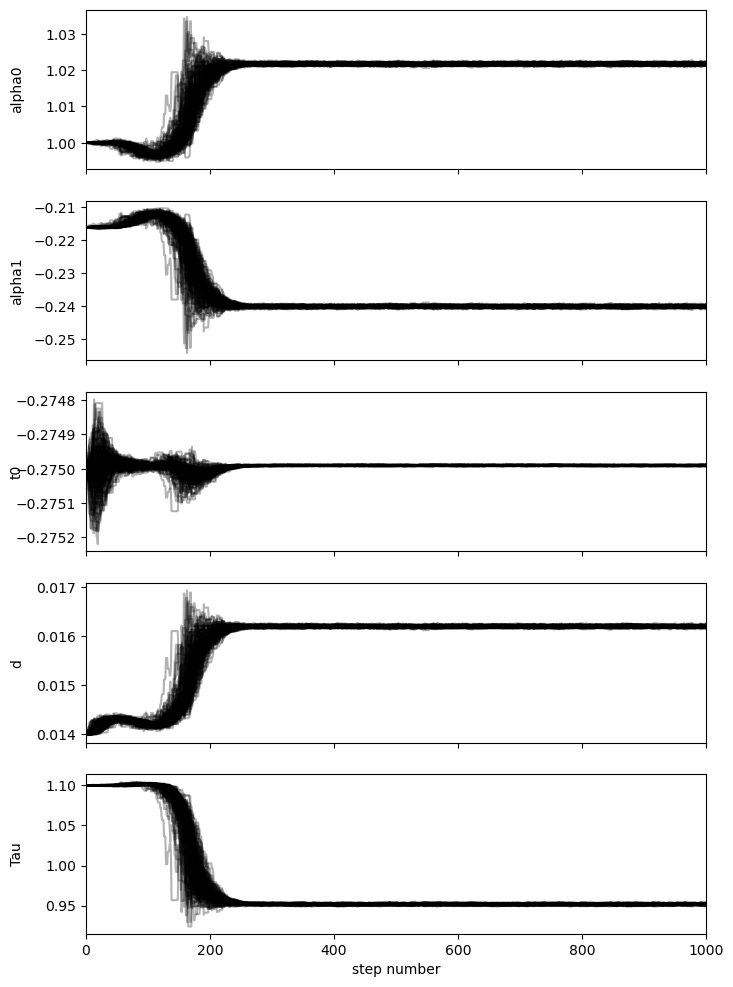

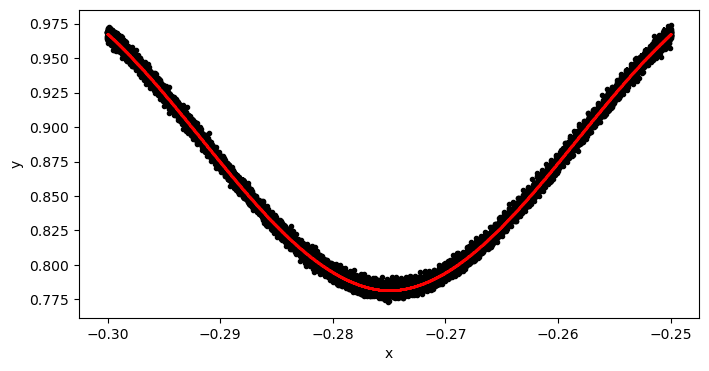

In [18]:
# run the initial model fit using MCMC for the primary and secondary eclipses
run_init_fit = True

if run_init_fit:
    etv_functions.enable_info_log_for_jupyter()
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns=1000, discard=600, pool=-2, plot_chains = True, plot = True)
    if t0_secondary is not None:
        mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns=1000, discard=600, pool=-2, plot_chains = True, plot = True)
    !$NOTIFY_CMD "Initial fit done"

In [12]:
if not run_init_fit:  # case init fit has been previously saved and to be reussed
    print("Use pre-defined inital model params:")
    # The model params based on clipped lC of 1.2X eclipse duration
    # mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0002761396156714, -0.2164428588578063, 0.40801899650994067, 0.014176322579186232, 1.1084884890946447
    # mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 0.9995737754750964, -0.2153080194871514, -0.09198993944674563, 0.01415653589611892, 1.1117414776801726
    #
    # The model params based on clipped lC of 0.8X eclipse duration
    # mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0224077130567308, -0.24142476423510215, 0.225009275182493, 0.01620951864441566, 0.949716491436926
    # mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.021728301416876, -0.24011235656991858, -0.27499023467672057, 0.016205240639999573, 0.9516256681596509    

    etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *[mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau])
    etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *[mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s])

In [19]:
print("Initial model params:")  # For information, and they can be copied to the cell above for future reuse

print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau]]))
if t0_secondary is not None:
    print("mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = " + ", ".join([str(v) for v in [mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s]]))

Initial model params:
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0224077130567308, -0.24142476423510215, 0.225009275182493, 0.01620951864441566, 0.949716491436926
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.021728301416876, -0.24011235656991858, -0.27499023467672057, 0.016205240639999573, 0.9516256681596509


503

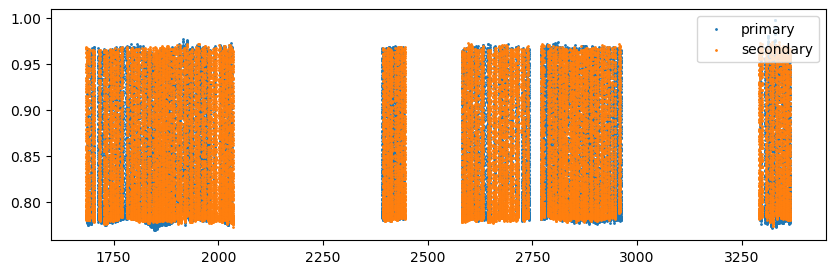

In [20]:
fig = plt.subplots(figsize=(10, 3), sharex=True)
plt.scatter(data_primary.time,data_primary.flux , s = 1, label = 'primary')
plt.scatter(data_secondary.time,data_secondary.flux , s = 1, label = 'secondary')
plt.legend()

# calculate the number of transits there are within the data 
n_transits = int((max(data_primary.time) - min(data_primary.time)) / period)
n_transits

1685.644 3.341825 1685.644


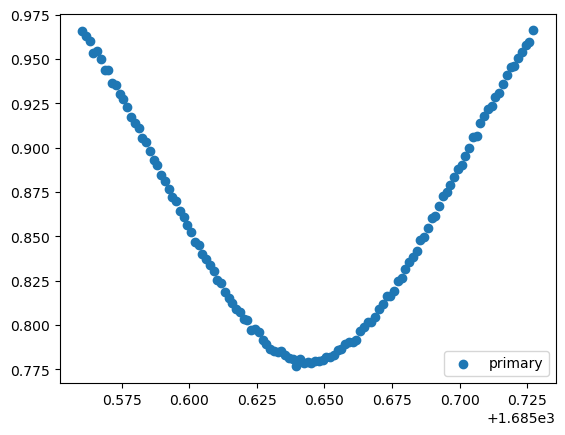

1685.644 3.341825 1688.985825


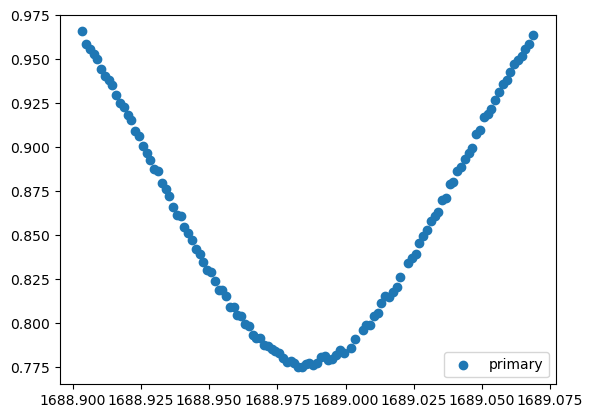

1685.644 3.341825 1692.32765


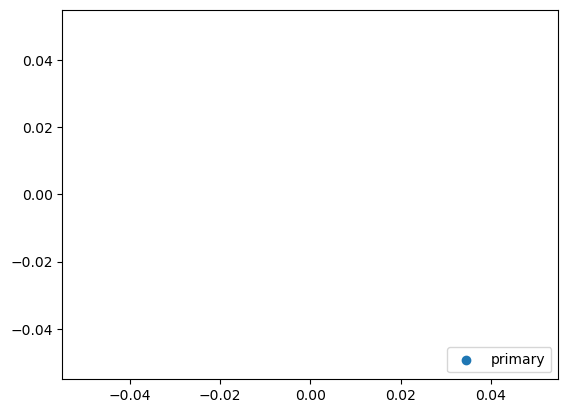

1683.9730875 3.341825 1683.9730875


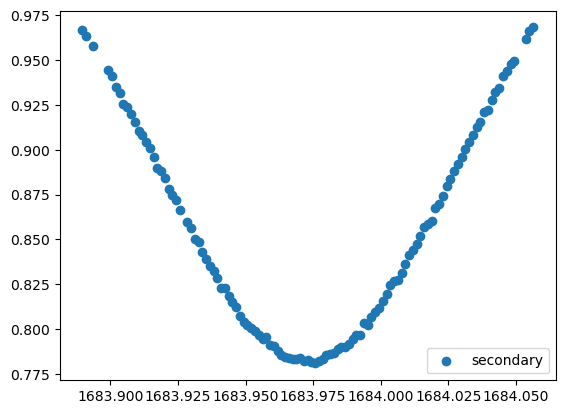

1683.9730875 3.341825 1687.3149125


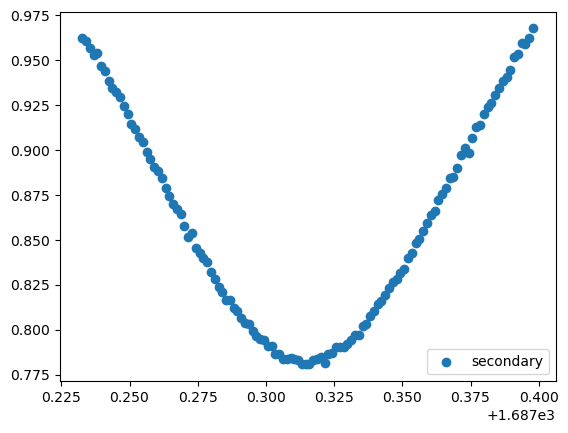

1683.9730875 3.341825 1690.6567375


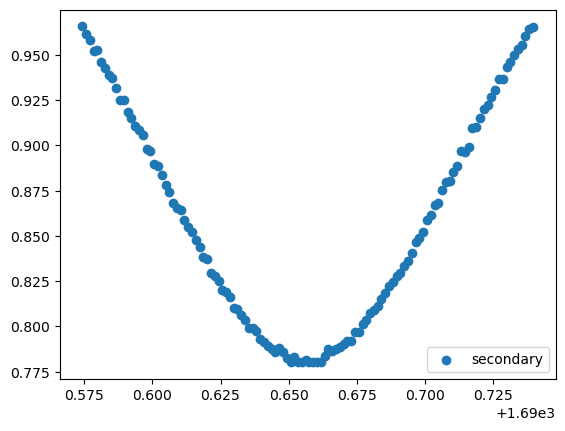

In [21]:
tr_index = range(0,n_transits)

for i in tr_index[0:3]:
    transit_time = t0_primary+(period*i)
    x = np.array(data_primary.time)
    y = np.array(data_primary.flux)
    yerr = np.array(data_primary.err)

    print (t0_primary, period, transit_time)

    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period)))

    x = np.array(x[mask])
    y = np.array(y[mask])
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="primary")
    plt.legend(loc="lower right")
    plt.show()


if t0_secondary is not None:
    for i in tr_index[0:3]:
        transit_time = t0_secondary+(period*i)
        x = np.array(data_secondary.time)
        y = np.array(data_secondary.flux)
        yerr = np.array(data_secondary.err)

        print (t0_secondary, period, transit_time)

        mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period)))

        x = np.array(x[mask])
        y = np.array(y[mask])
        yerr = np.array(yerr[mask])
        fig, ax = plt.subplots()
        plt.scatter(x,y, label="secondary")
        plt.legend(loc="lower right")
        plt.show()

Fitting individual primary eclipses...
Existing manifest file found, will skip previously processed LCs and append to end of manifest file
Number 0 has already been completed -- skip
Number 1 has already been completed -- skip
Number 3 has already been completed -- skip
Number 4 has already been completed -- skip
Number 5 has already been completed -- skip
Number 8 has already been completed -- skip
1715.720425 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.76it/s]


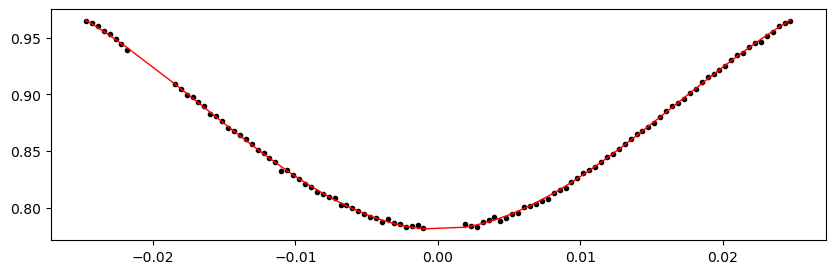

1719.06225 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.19it/s]


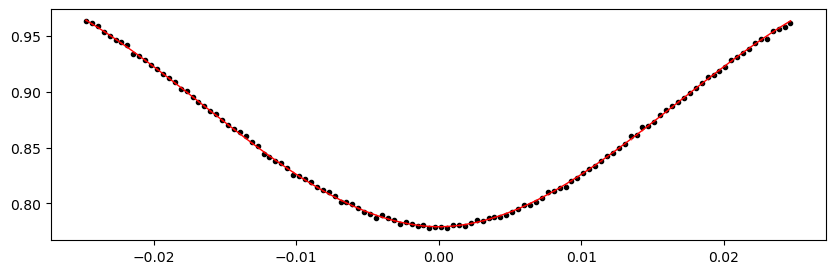

1725.7459 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.19it/s]


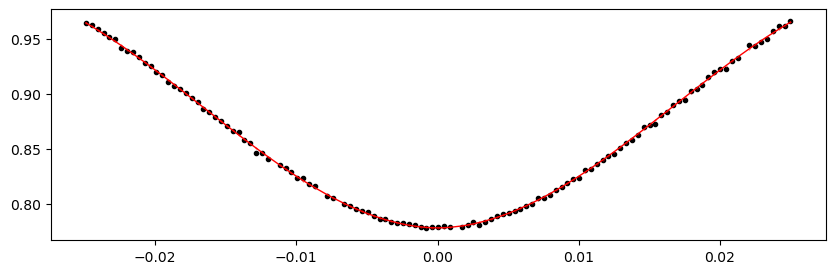

1729.087725 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.05it/s]


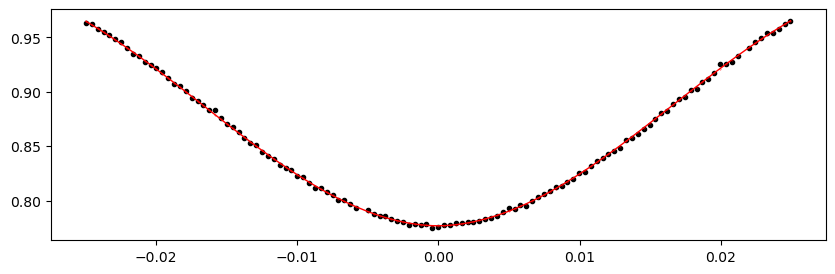

1732.42955 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.57it/s]


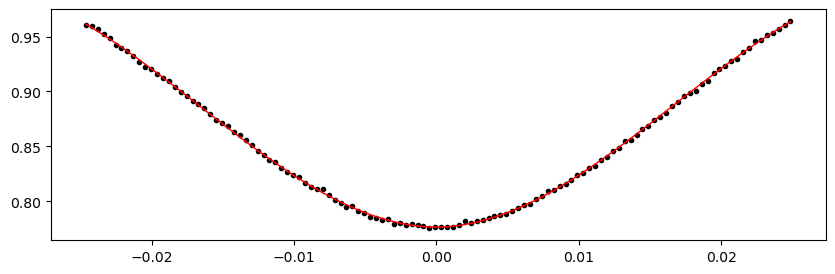

1739.1132 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.40it/s]


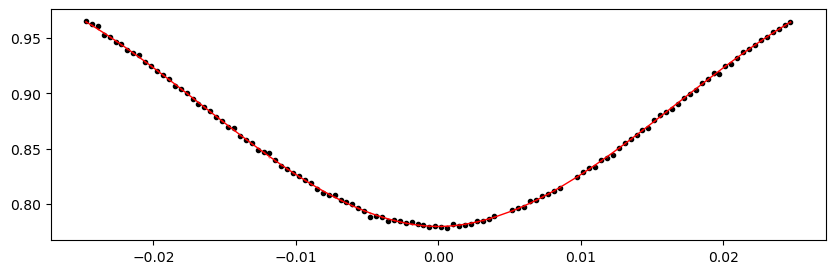

1742.455025 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.12it/s]


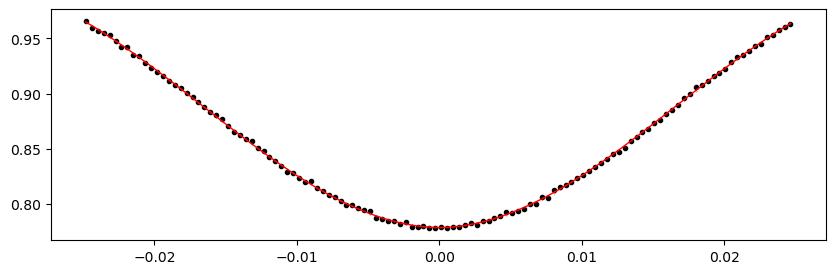

1745.79685 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.49it/s]


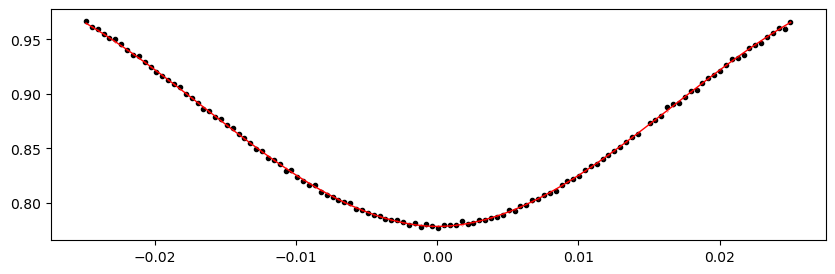

Time 1749.138675 does not have enough data points: 1
1752.4805000000001 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.92it/s]


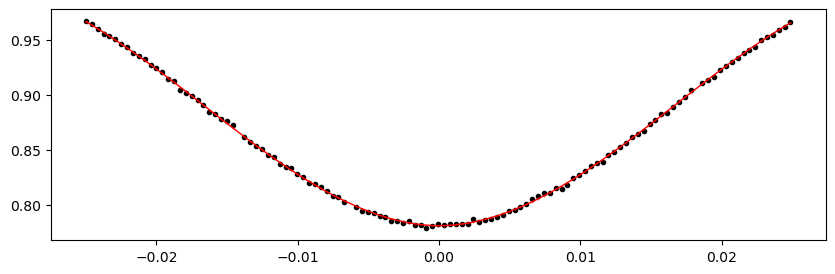

1755.822325 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.06it/s]


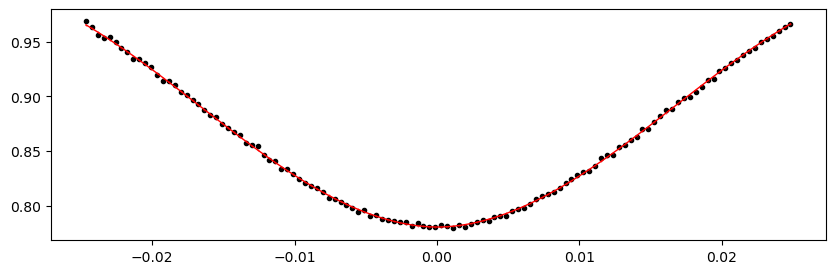

1759.16415 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.56it/s]


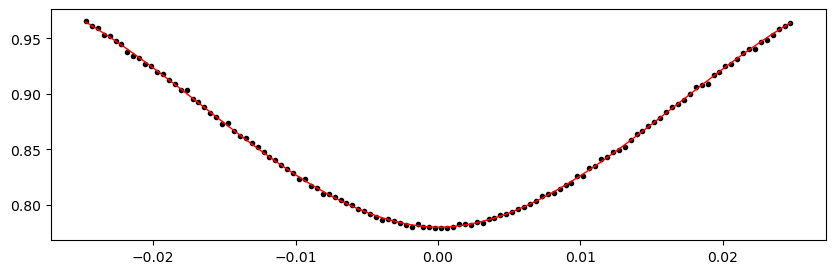

1762.505975 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.99it/s]


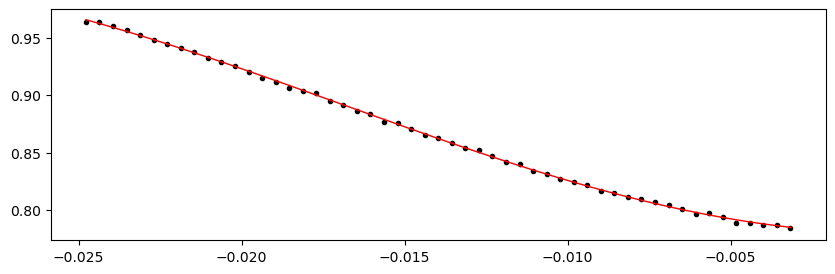

1765.8478 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.34it/s]


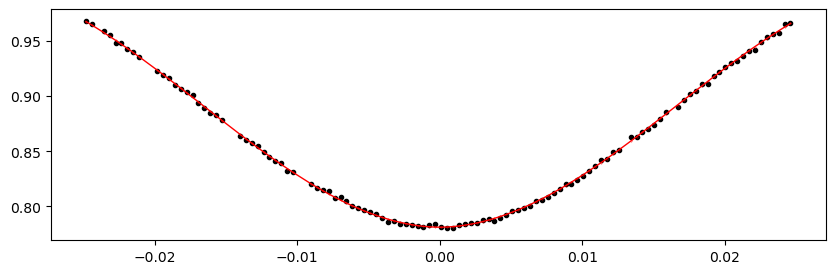

1769.189625 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.01it/s]


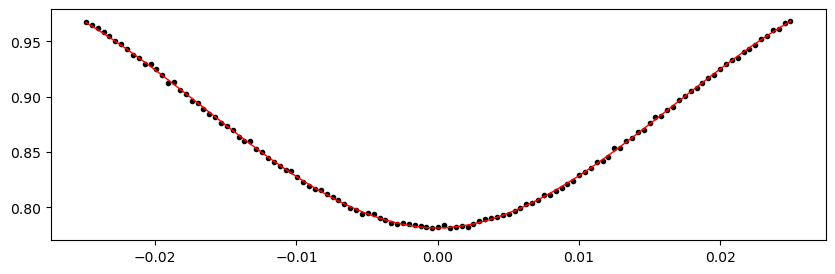

1772.53145 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.88it/s]


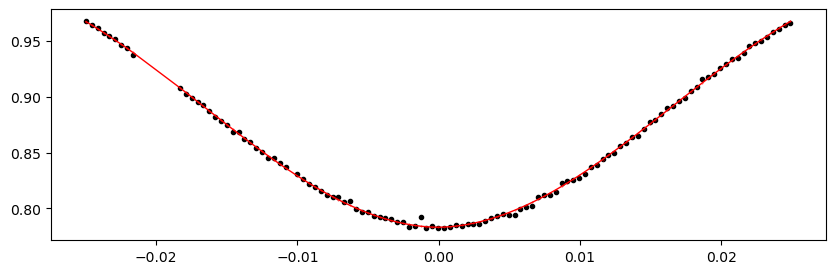

1779.2151 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.28it/s]


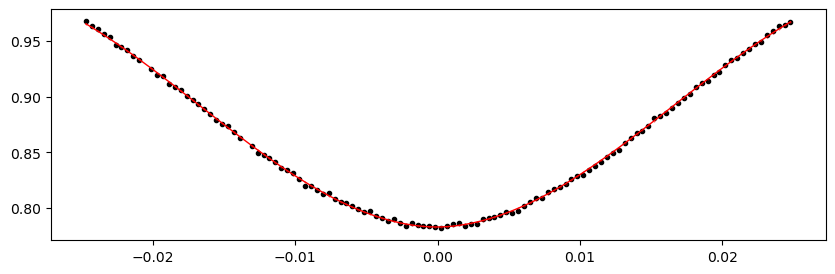

1782.556925 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.83it/s]


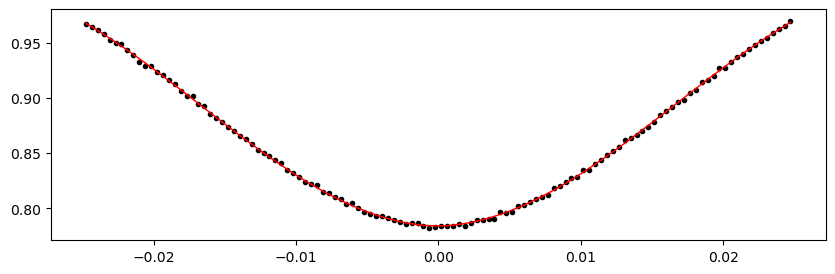

1785.89875 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.74it/s]


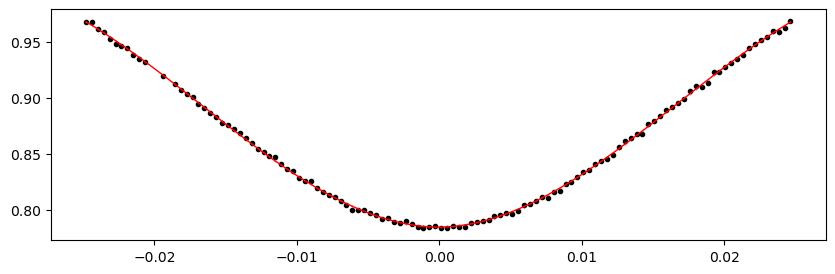

1792.5824 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.56it/s]


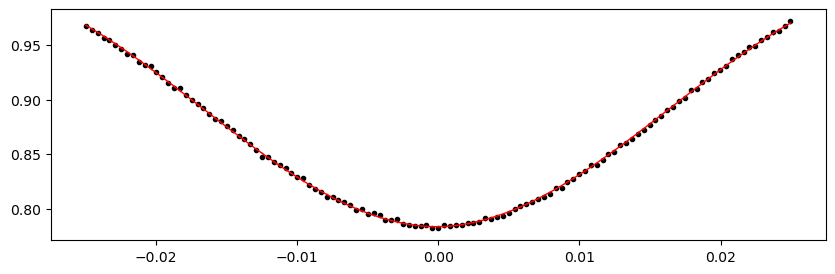

1795.924225 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.32it/s]


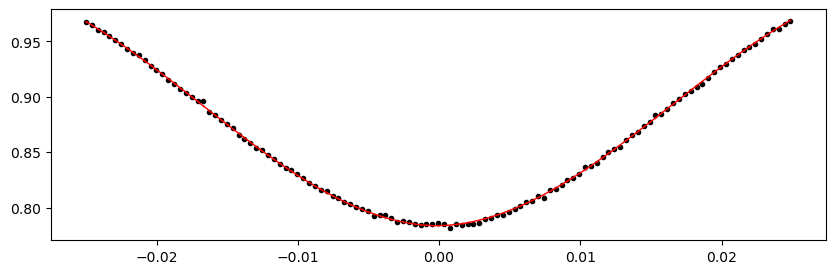

1799.26605 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.44it/s]


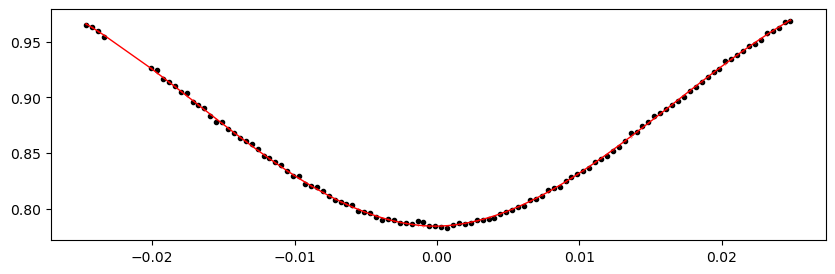

1805.9497000000001 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.19it/s]


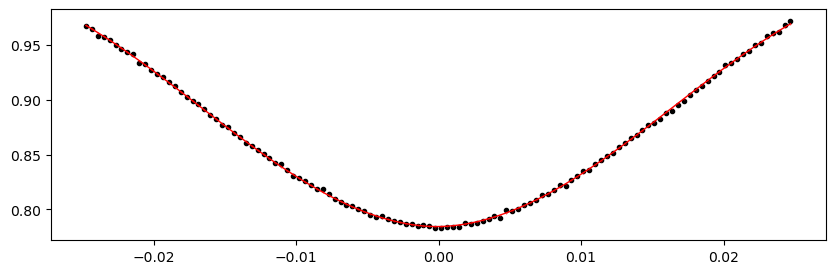

1809.291525 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.05it/s]


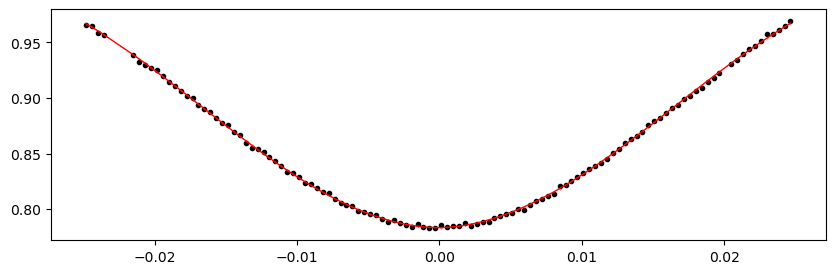

1812.63335 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.55it/s]


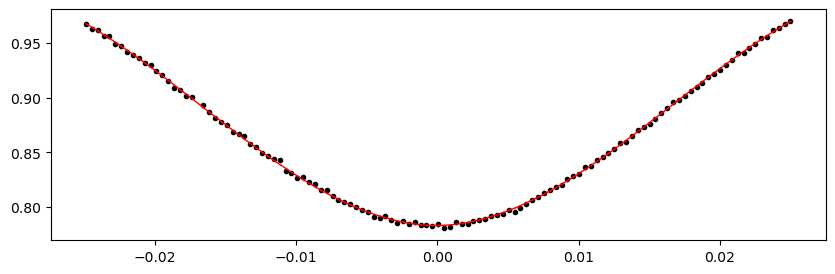

1819.317 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.65it/s]


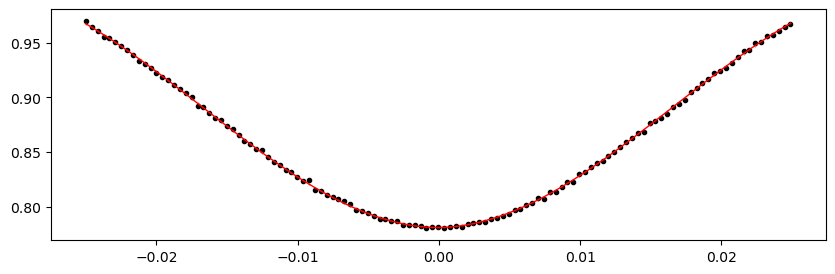

1822.658825 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.40it/s]


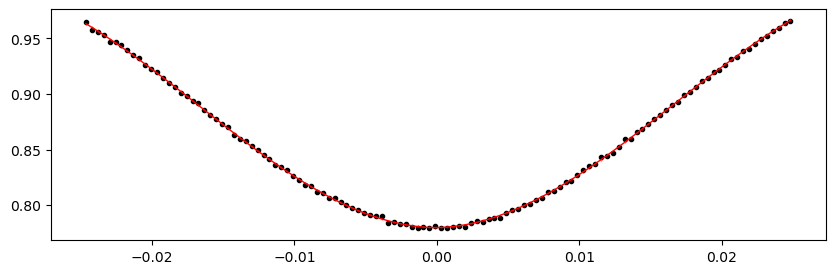

1826.00065 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.31it/s]


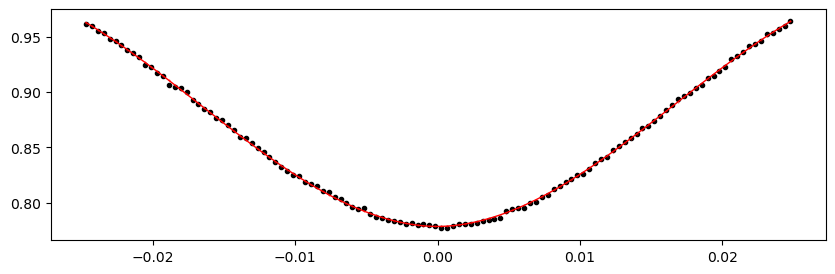

1829.342475 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.43it/s]


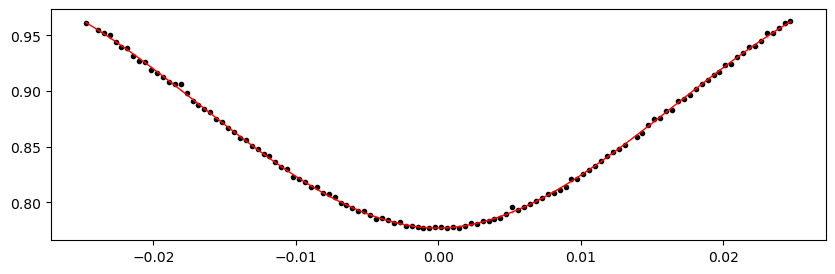

1832.6843 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.72it/s]


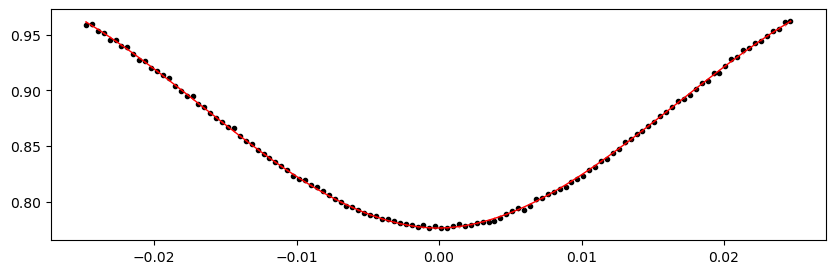

1836.026125 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.11it/s]


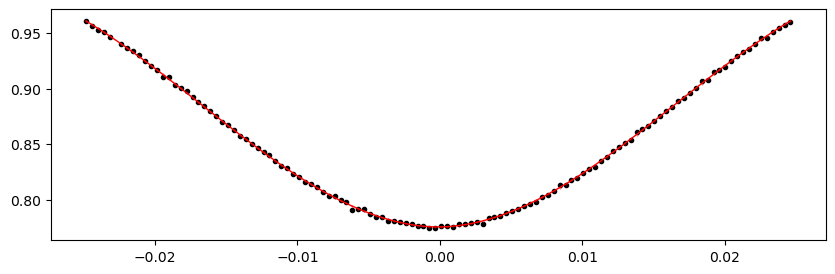

1839.36795 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.84it/s]


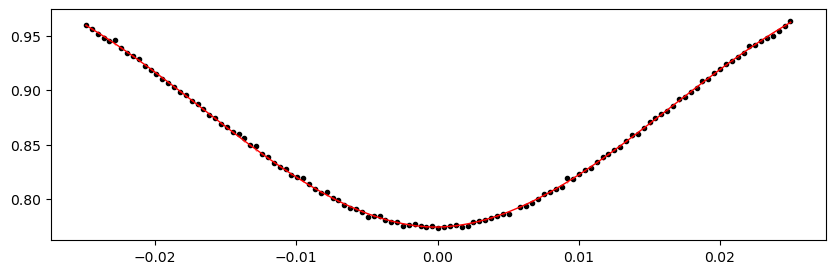

1842.709775 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.25it/s]


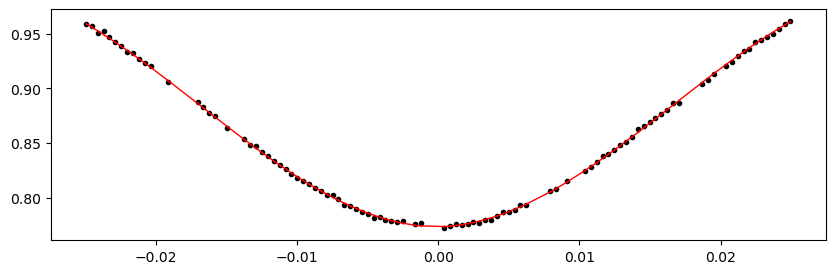

1846.0516 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.04it/s]


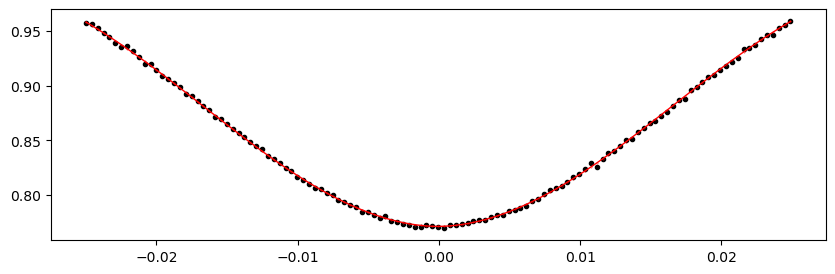

1849.393425 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.39it/s]


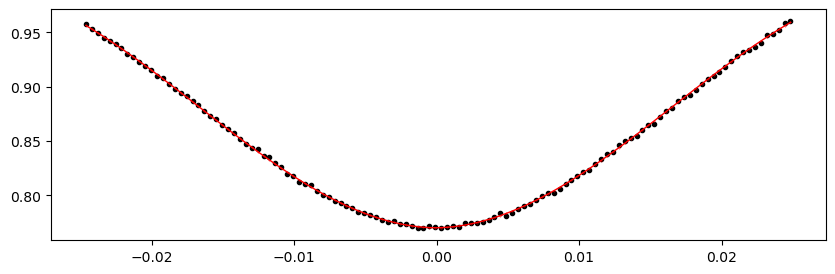

1852.73525 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.26it/s]


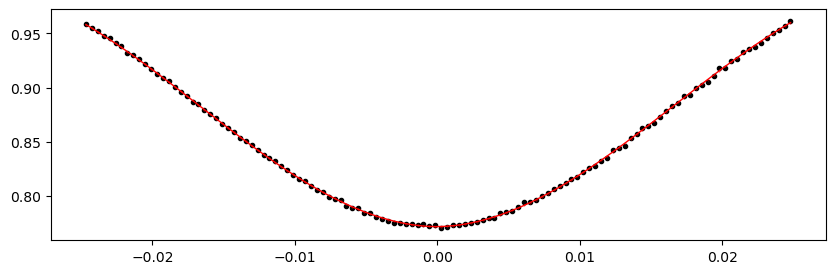

1859.4189000000001 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.84it/s]


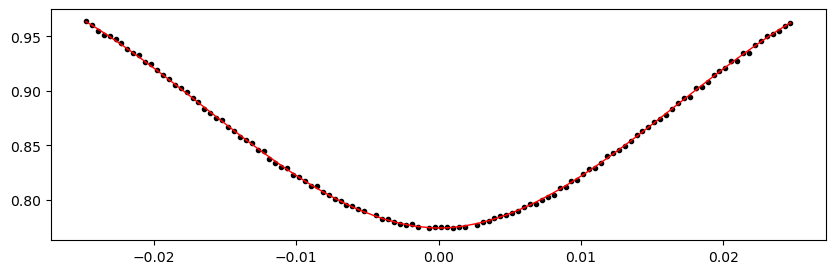

1862.760725 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.50it/s]


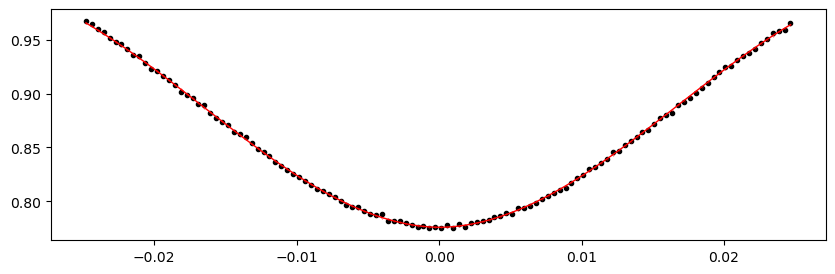

1866.10255 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.73it/s]


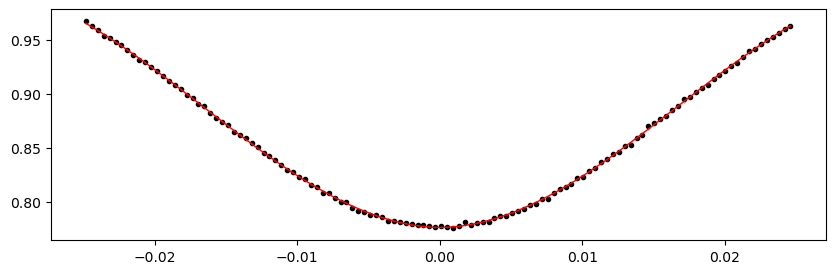

1872.7862 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.70it/s]


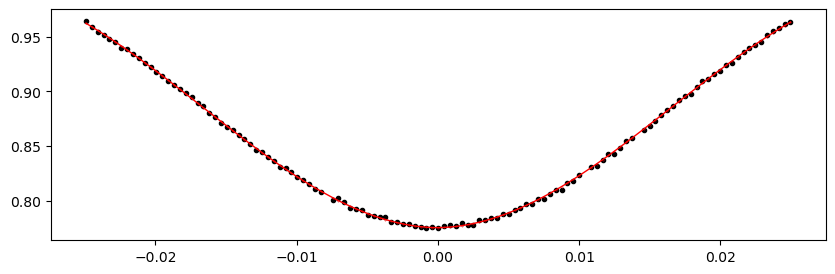

1876.128025 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.15it/s]


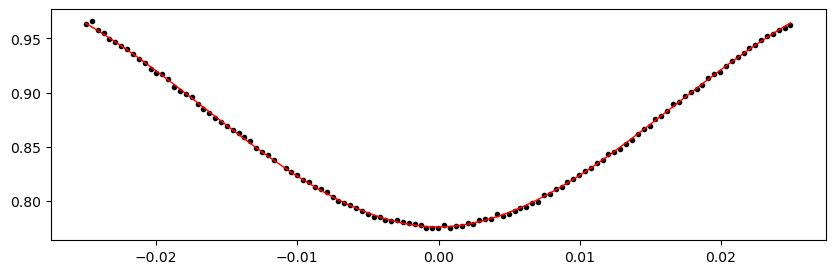

1879.46985 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.46it/s]


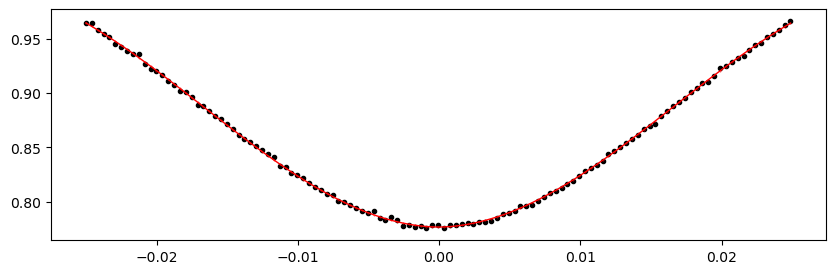

1882.811675 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.48it/s]


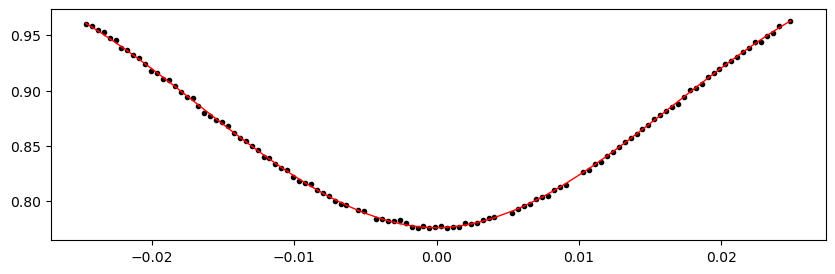

1886.1535 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.86it/s]


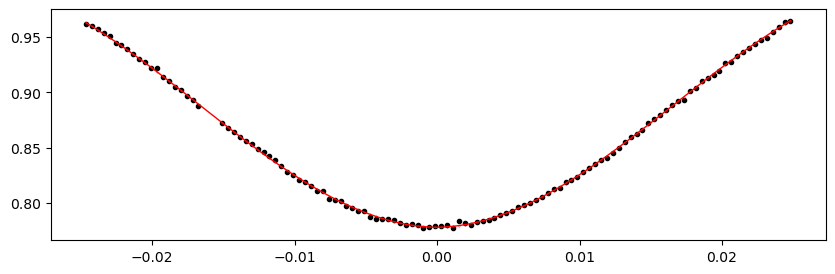

1889.495325 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.39it/s]


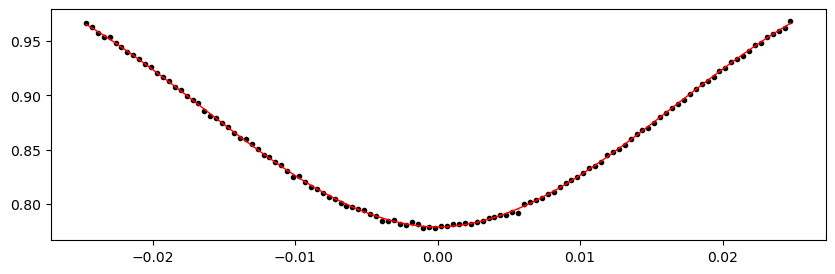

1892.83715 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.78it/s]


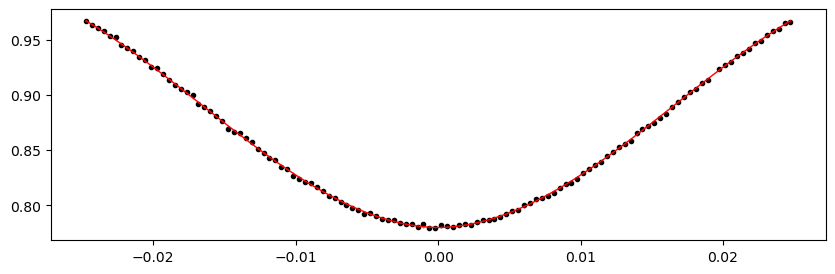

1896.178975 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.18it/s]


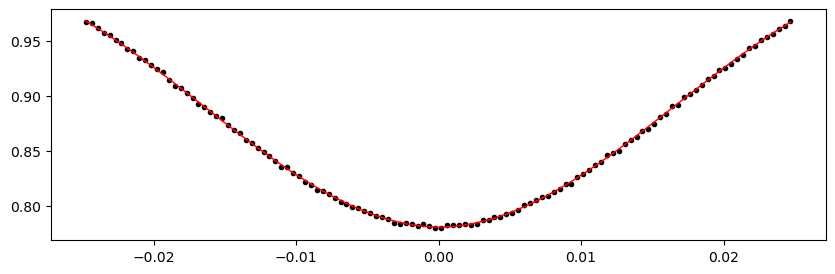

1902.862625 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.37it/s]


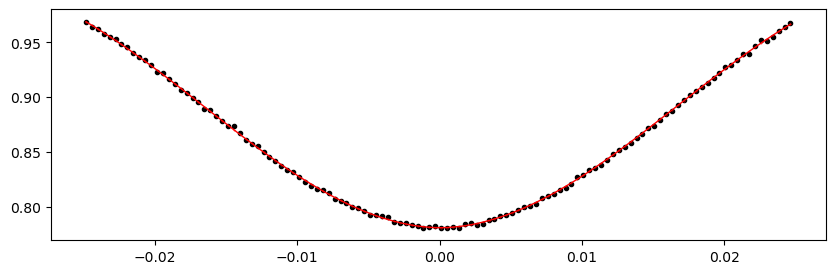

1906.20445 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.06it/s]


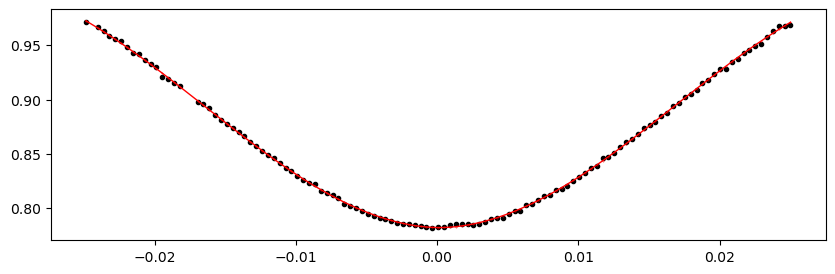

1909.546275 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.13it/s]


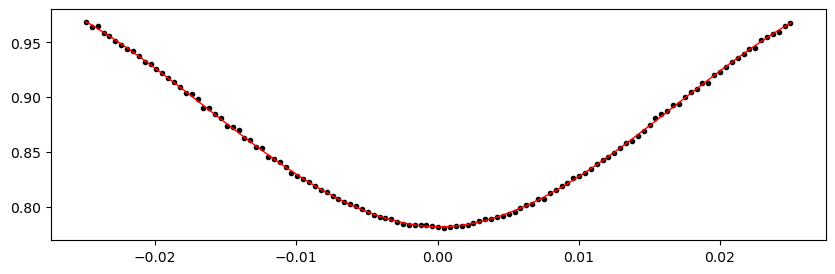

1916.229925 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.67it/s]


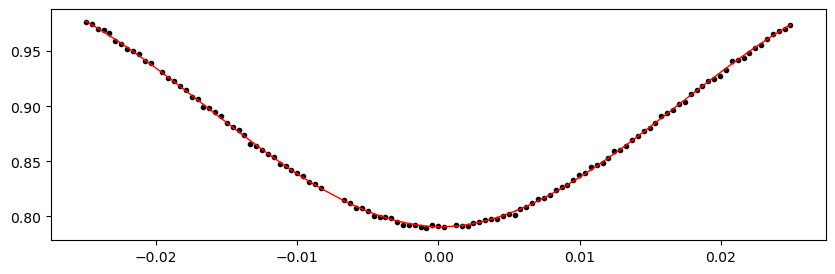

1919.57175 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.38it/s]


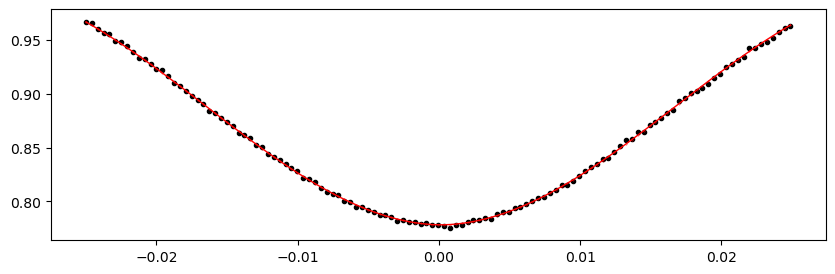

1922.913575 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.61it/s]


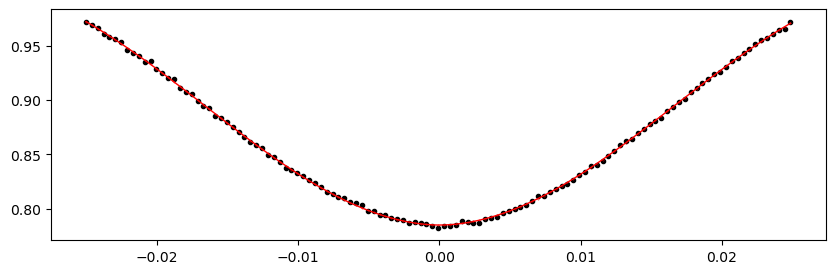

1926.2554 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.39it/s]


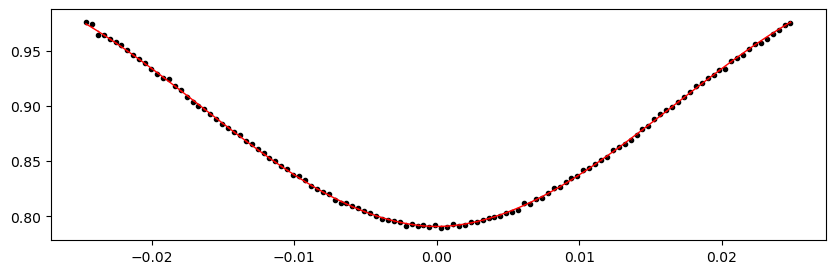

1929.597225 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.88it/s]


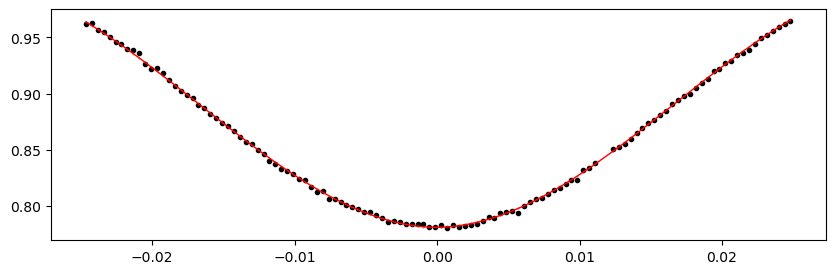

1932.93905 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.46it/s]


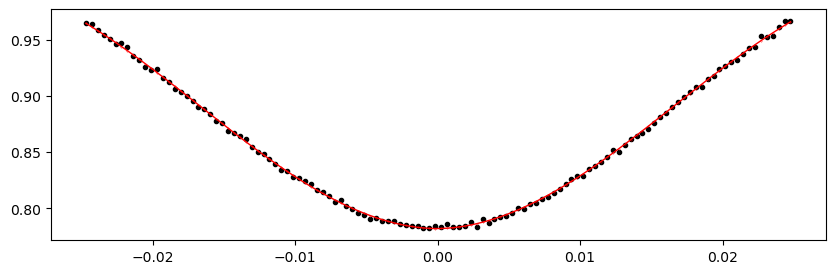

1936.280875 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.69it/s]


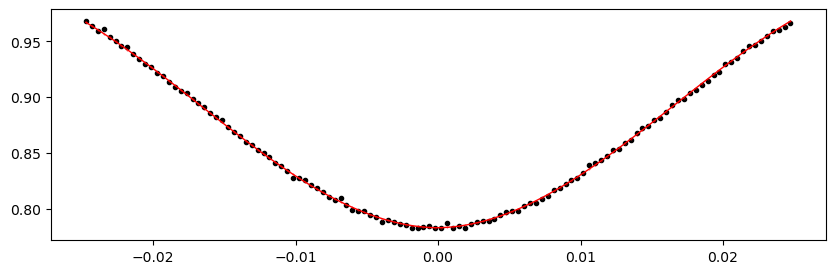

1939.6227 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.72it/s]


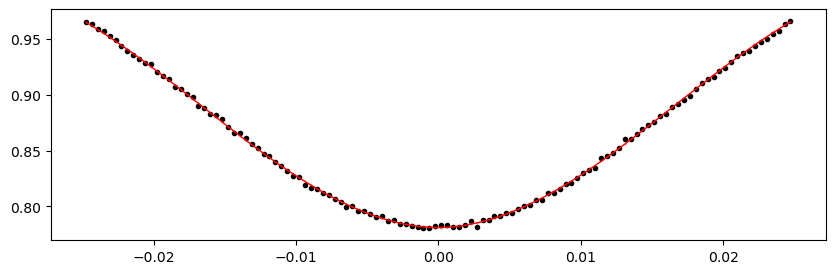

1946.30635 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.98it/s]


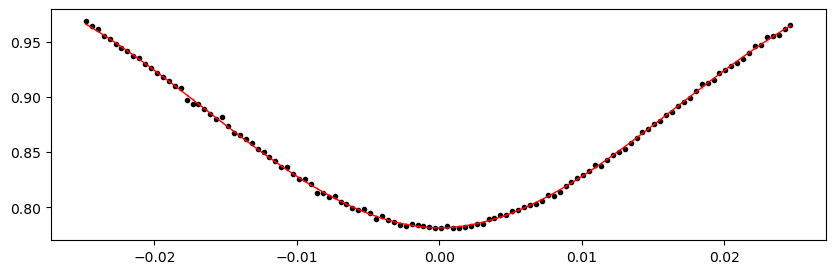

1949.648175 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.44it/s]


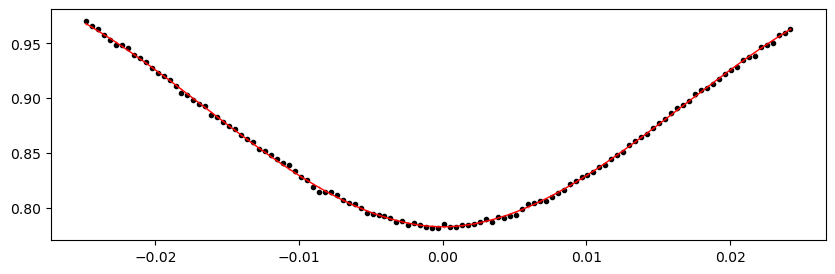

1952.99 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.91it/s]


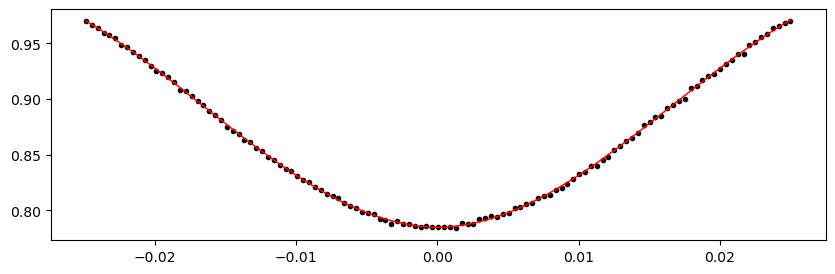

1956.331825 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.96it/s]


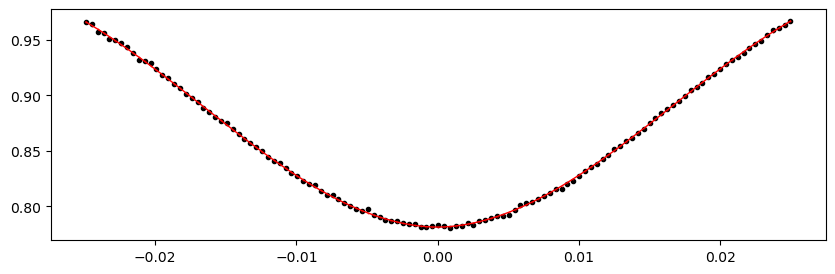

1959.67365 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.76it/s]


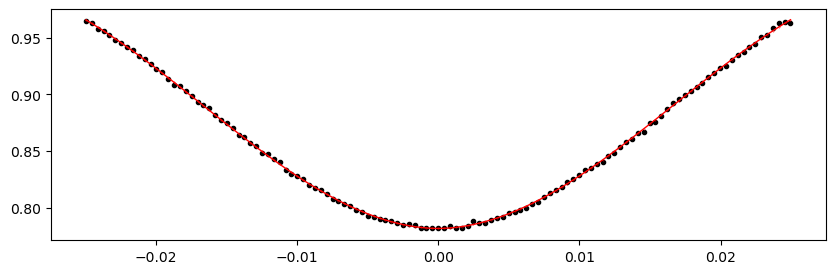

1963.0154750000002 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.13it/s]


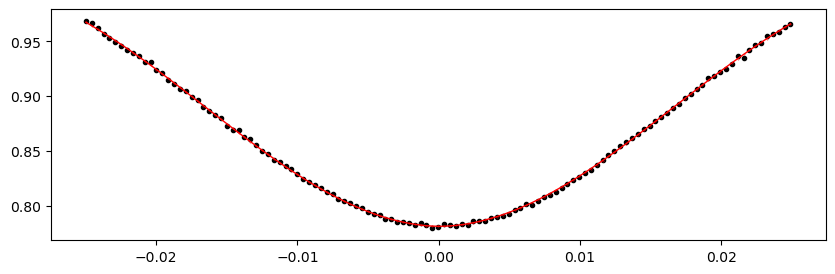

1966.3573000000001 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.50it/s]


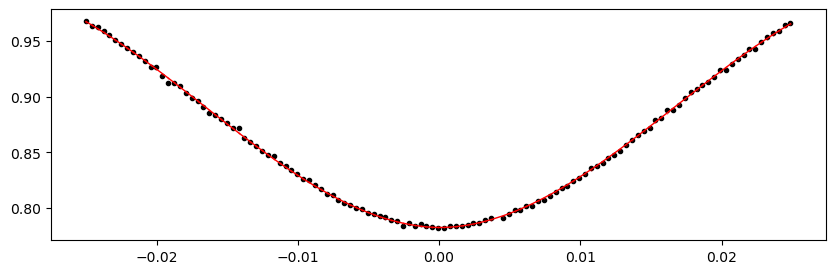

1969.699125 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.87it/s]


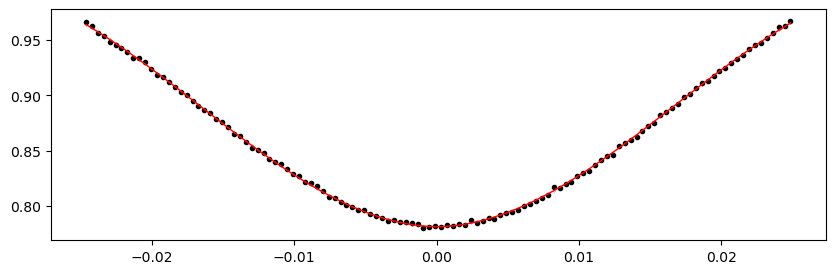

1973.04095 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.06it/s]


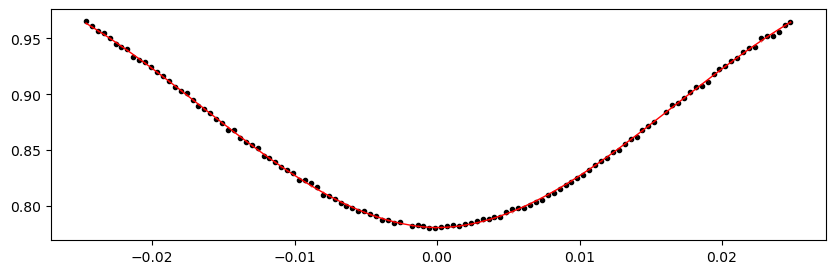

1976.382775 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.75it/s]


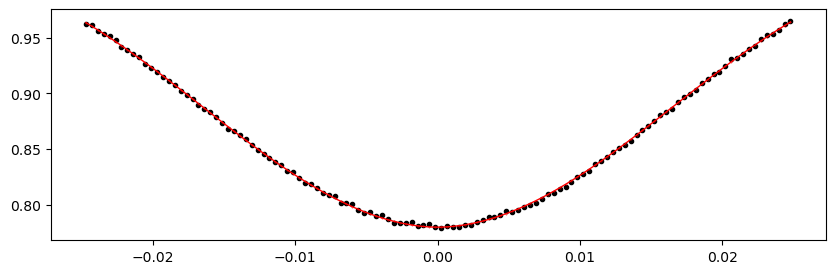

1979.7246 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.78it/s]


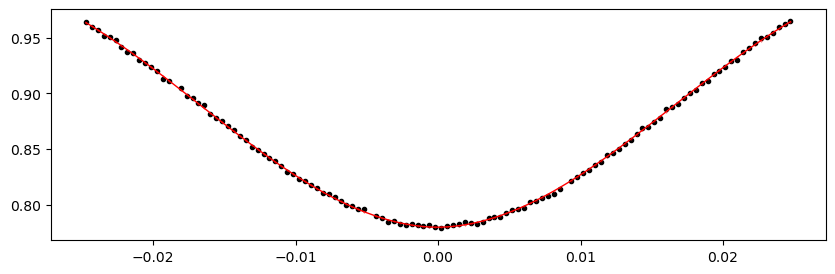

1989.750075 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.83it/s]


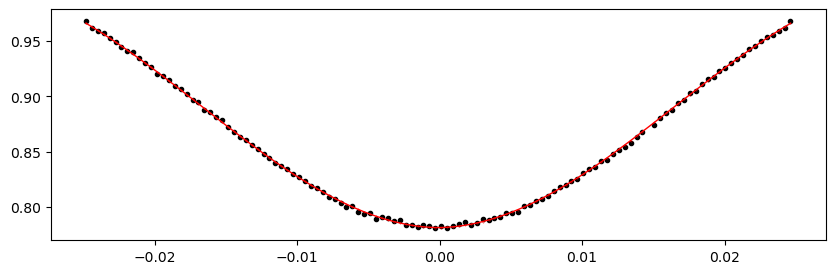

1993.0919 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.52it/s]


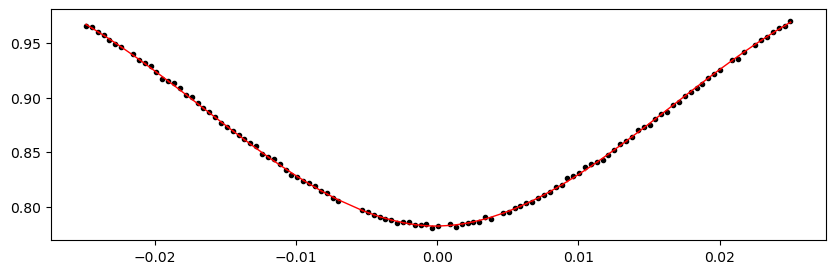

2003.117375 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.97it/s]


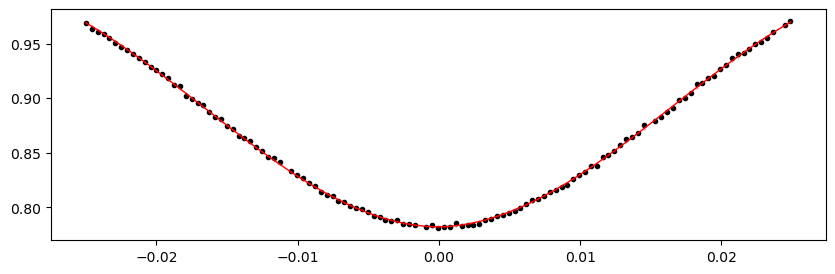

2006.4592 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.89it/s]


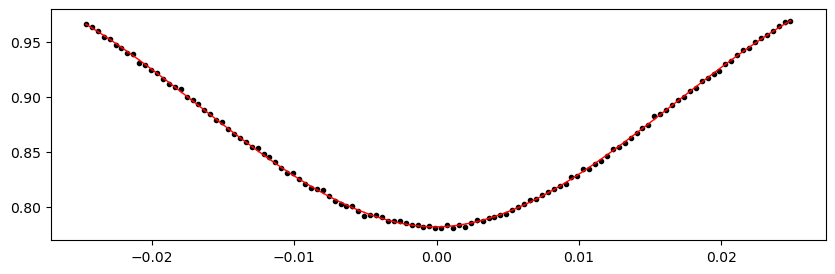

2013.14285 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.24it/s]


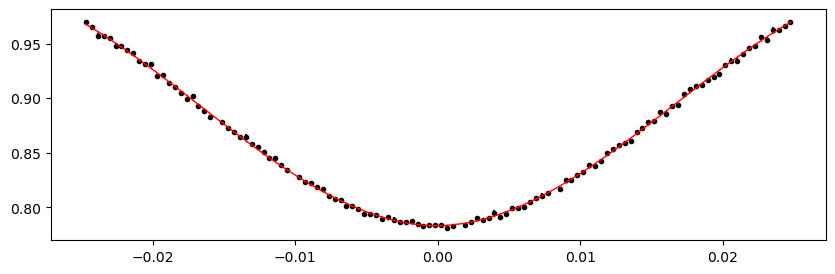

2016.4846750000002 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.76it/s]


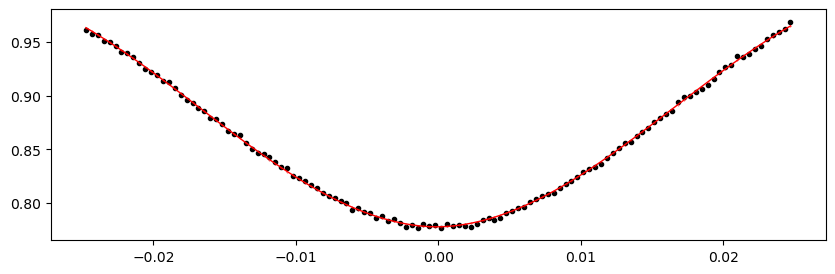

2019.8265000000001 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.33it/s]


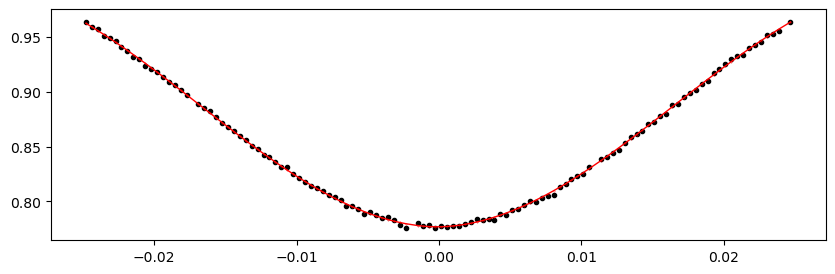

2023.168325 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.66it/s]


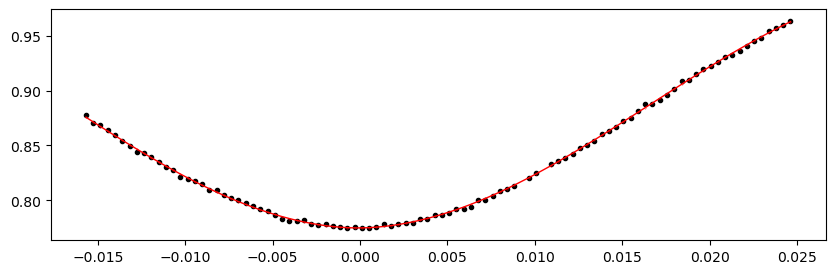

2026.51015 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.41it/s]


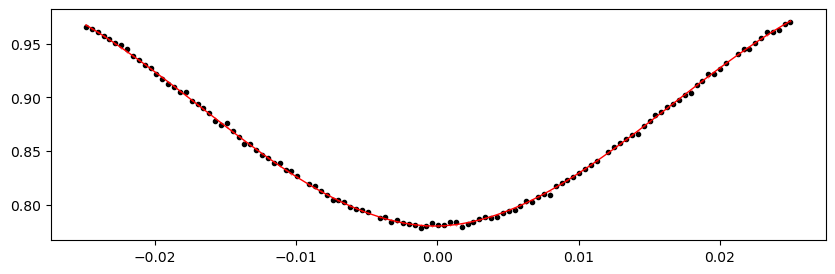

2029.851975 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.89it/s]


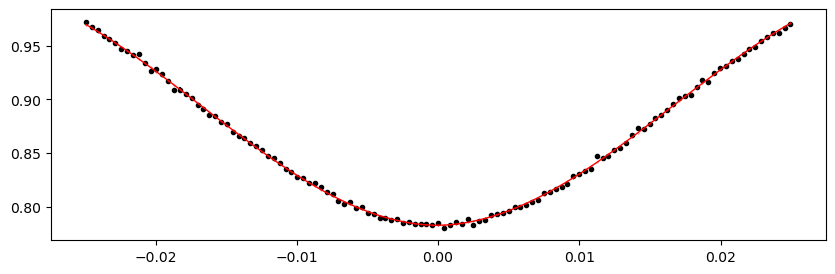

2033.1938 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.70it/s]


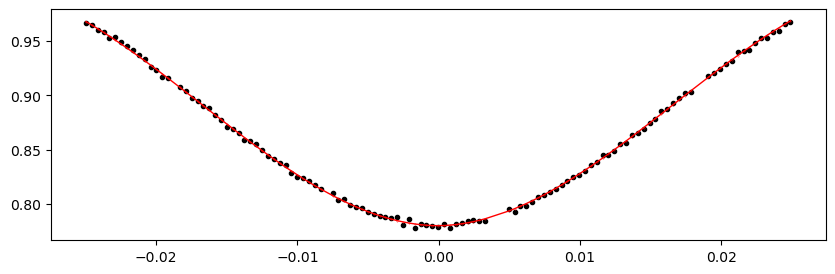

2390.769075 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.75it/s]


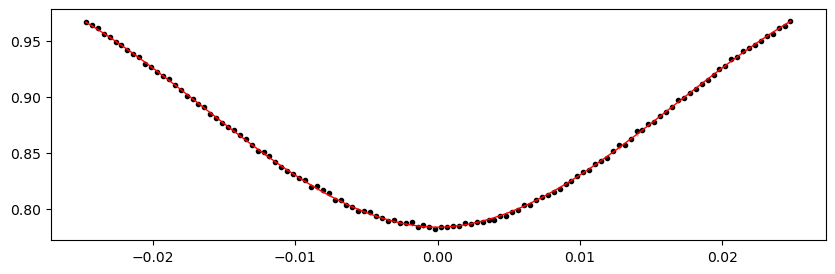

2394.1109 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.72it/s]


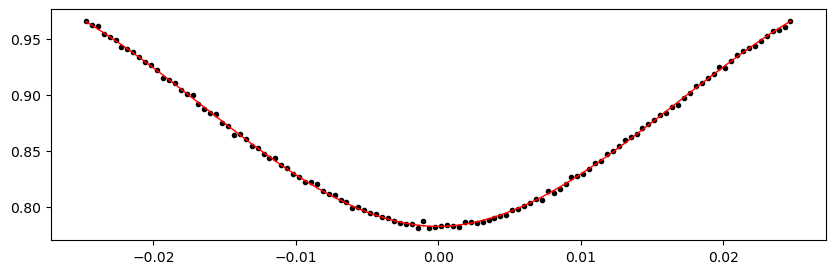

2397.452725 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.72it/s]


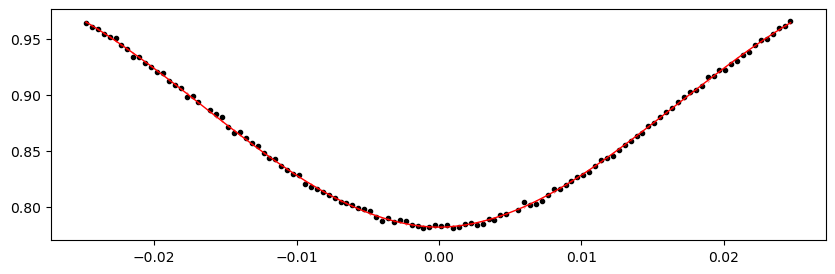

2400.79455 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.23it/s]


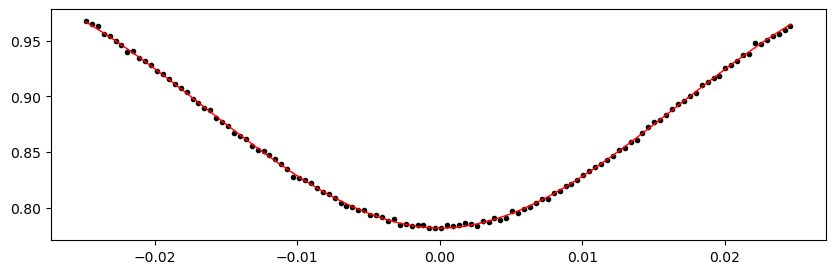

2404.136375 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.95it/s]


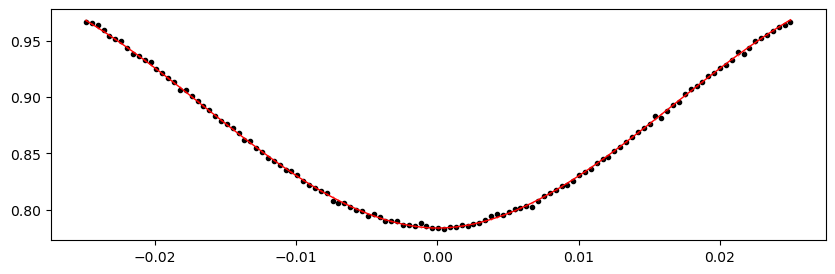

2407.4782 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.23it/s]


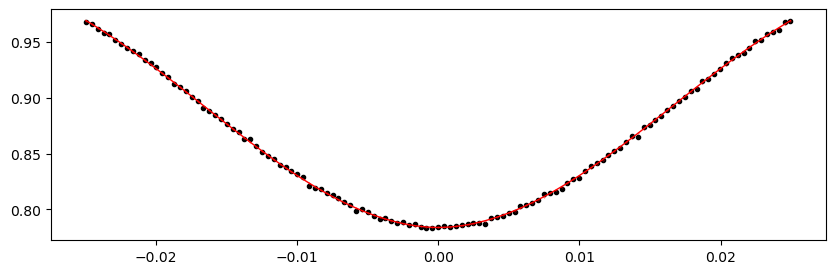

2410.820025 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.83it/s]


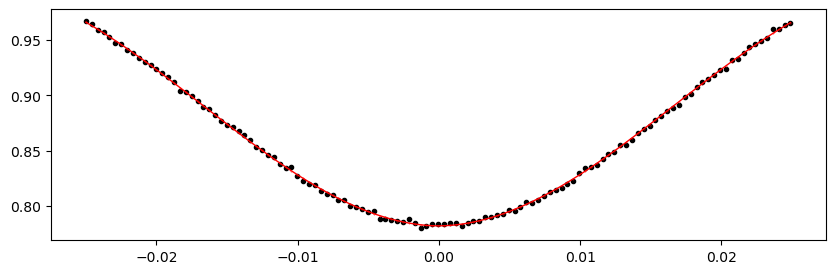

2414.16185 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.17it/s]


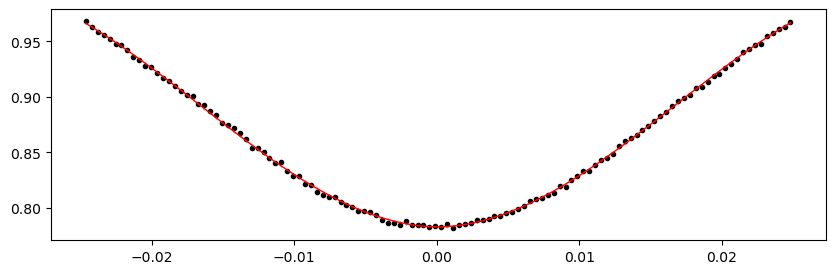

2417.503675 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.04it/s]


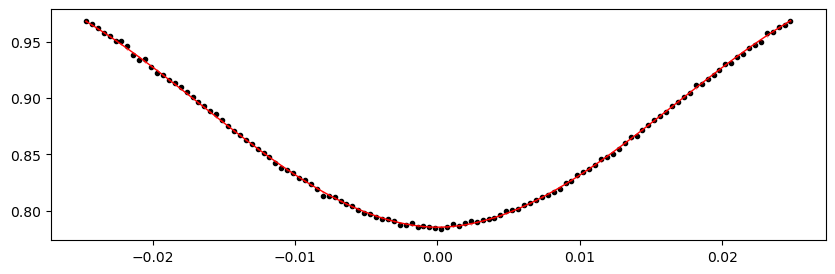

2420.8455 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.40it/s]


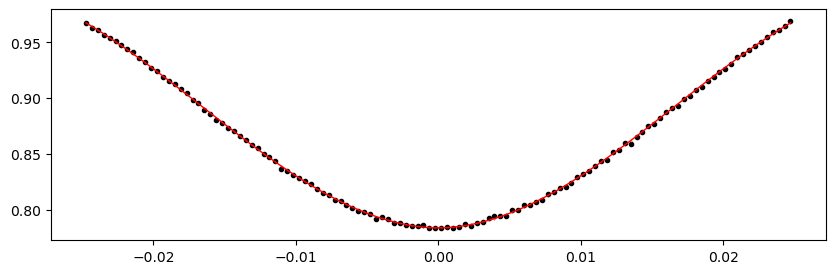

2424.187325 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.85it/s]


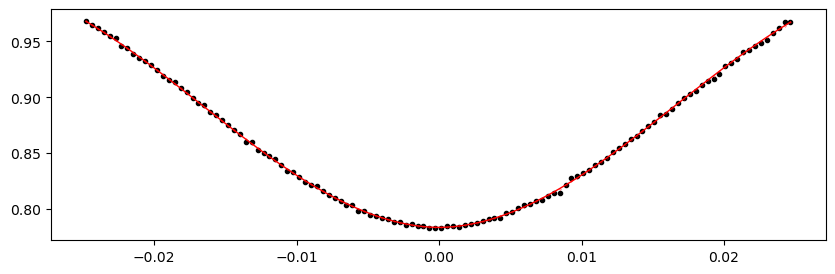

2427.5291500000003 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.79it/s]


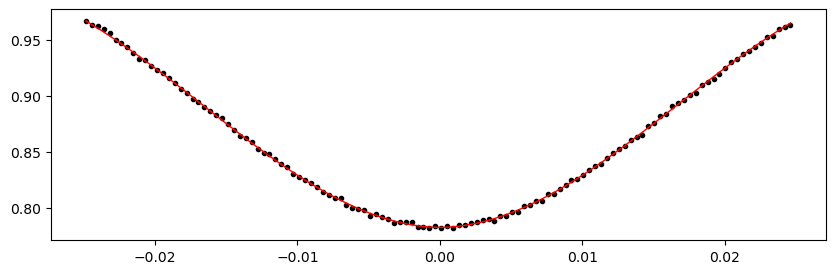

2430.870975 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.17it/s]


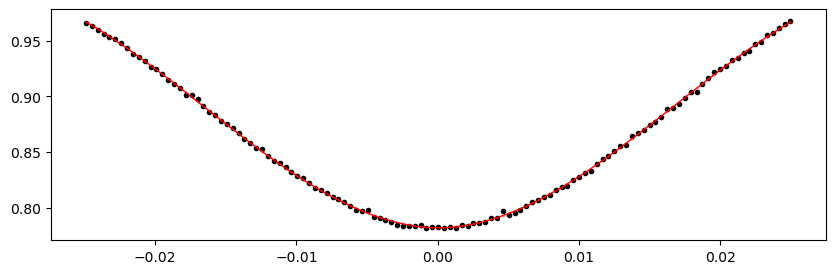

2434.2128000000002 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.36it/s]


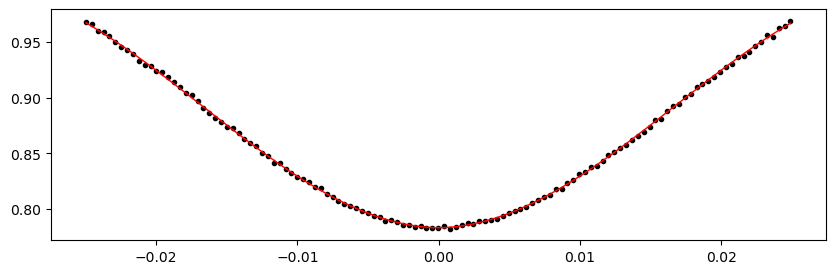

2437.5546249999998 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.68it/s]


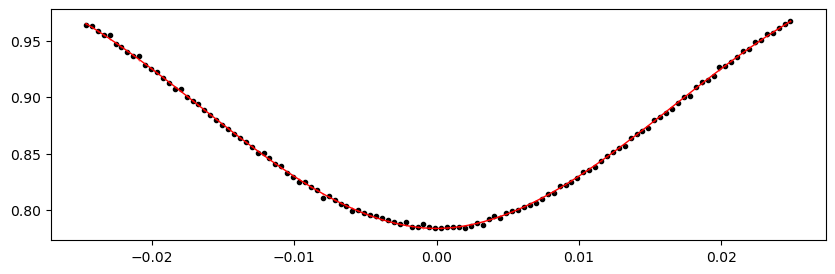

2440.89645 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.51it/s]


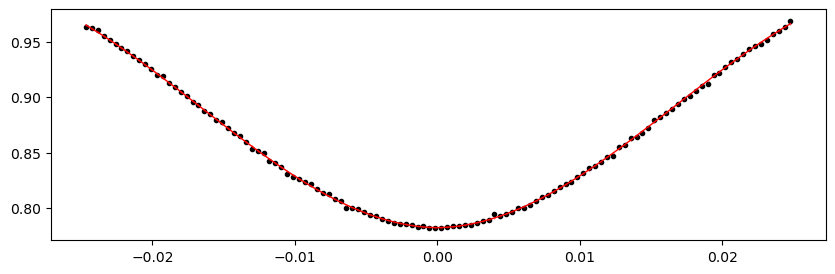

2444.238275 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.54it/s]


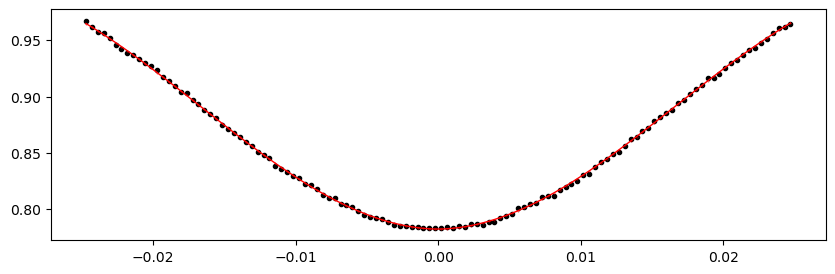

2581.2531 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.68it/s]


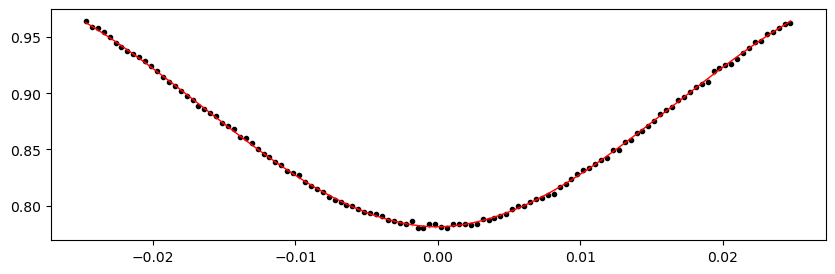

2584.594925 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.13it/s]


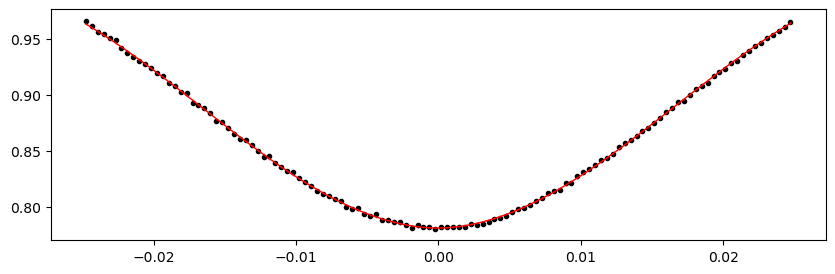

2587.93675 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.55it/s]


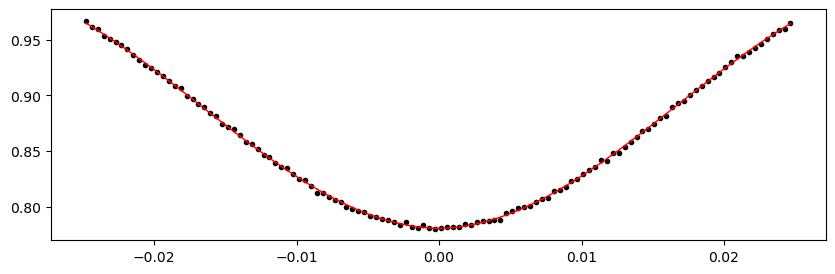

2591.2785750000003 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.44it/s]


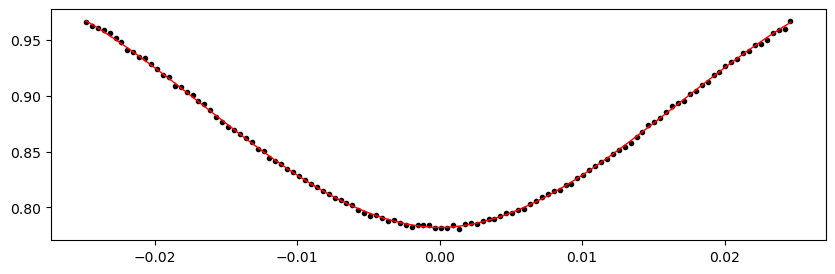

2597.962225 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.43it/s]


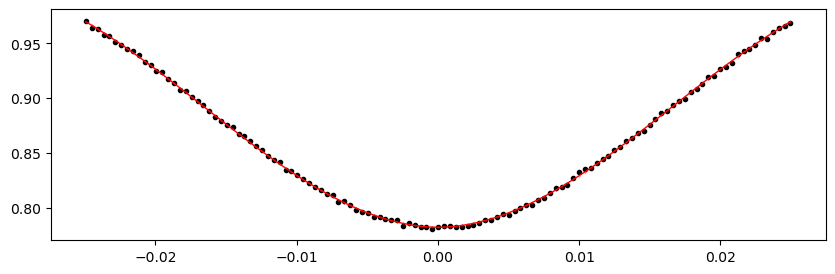

2601.3040499999997 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.51it/s]


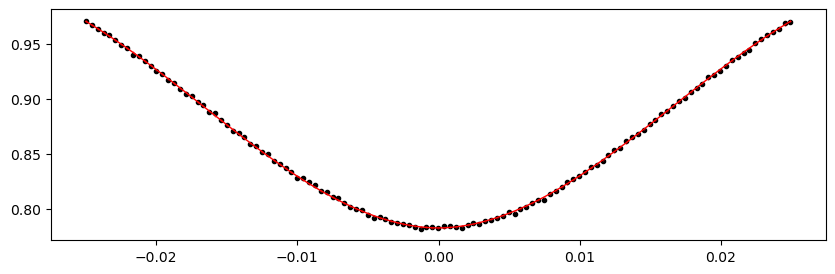

2604.645875 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.53it/s]


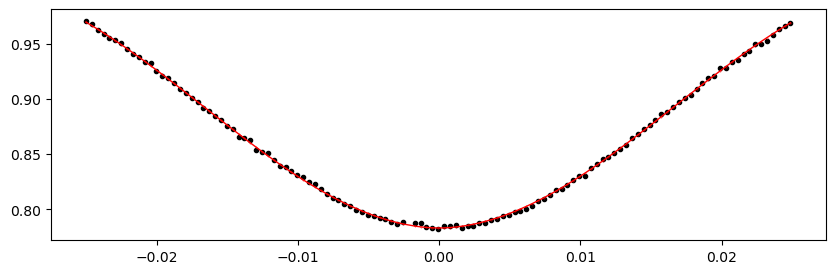

2611.329525 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.82it/s]


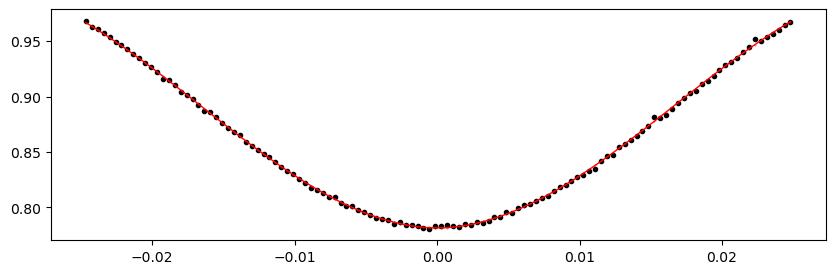

2614.67135 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.05it/s]


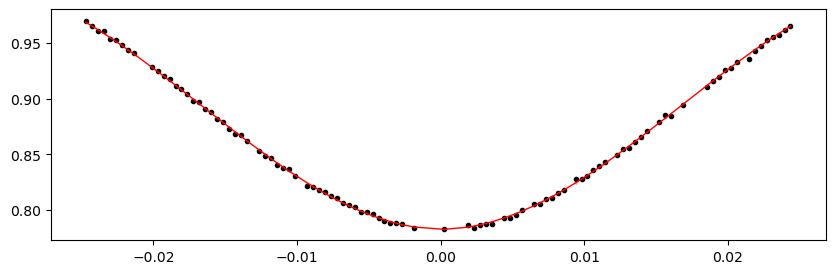

2618.013175 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.07it/s]


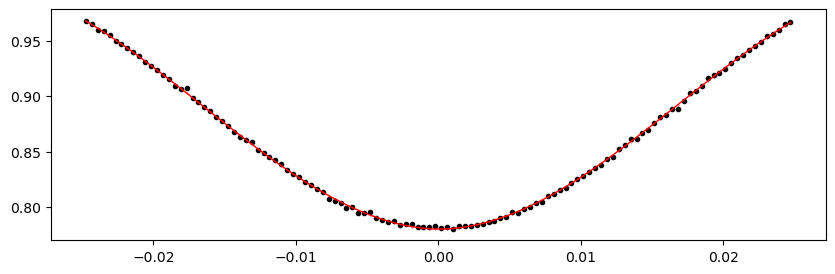

2621.355 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.92it/s]


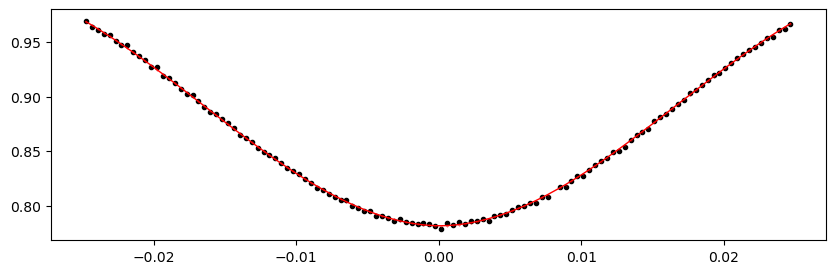

2628.03865 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.40it/s]


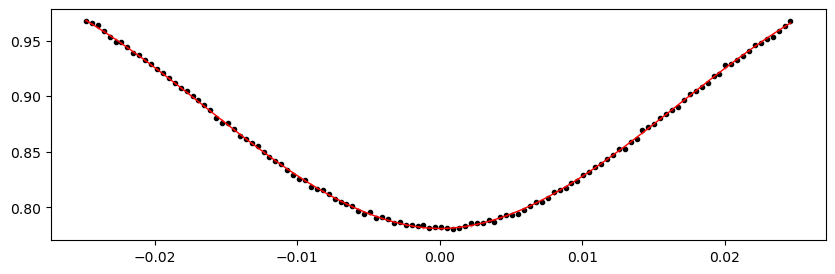

2631.380475 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.43it/s]


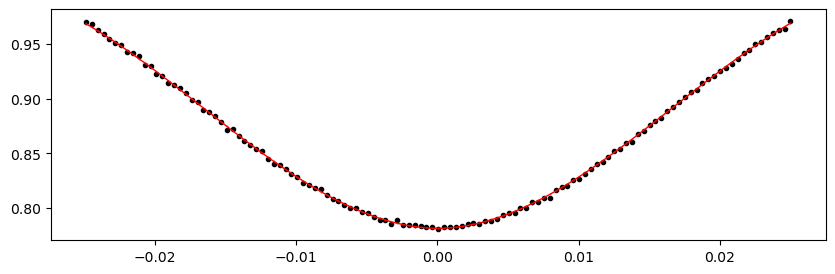

2634.7223 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.07it/s]


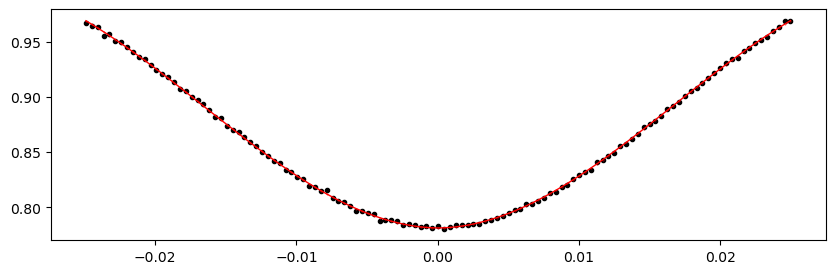

2641.4059500000003 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.65it/s]


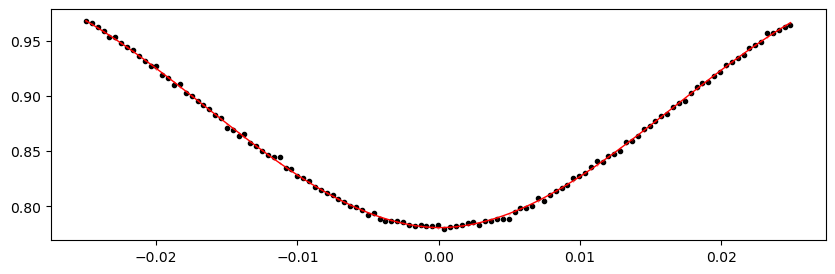

2644.747775 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.96it/s]


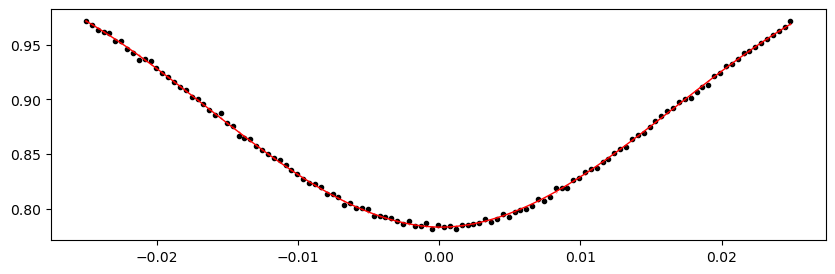

2648.0896000000002 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.09it/s]


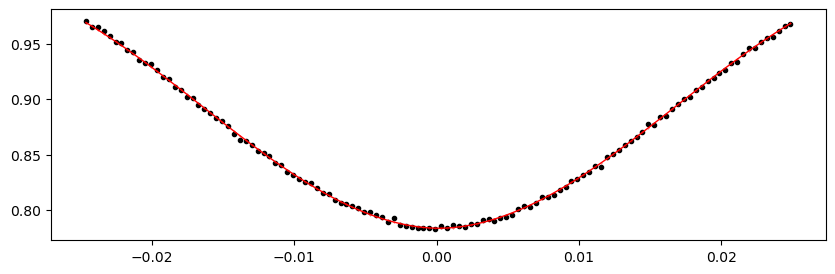

2658.115075 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.43it/s]


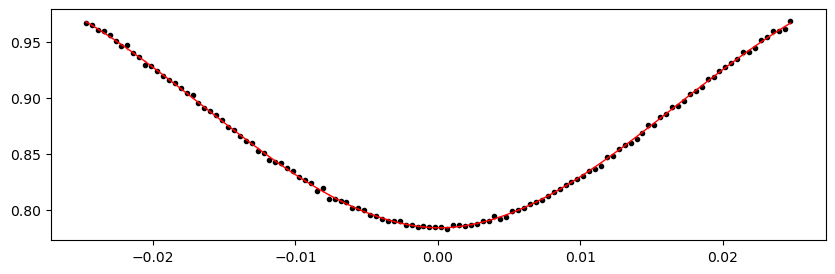

2661.4569 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.30it/s]


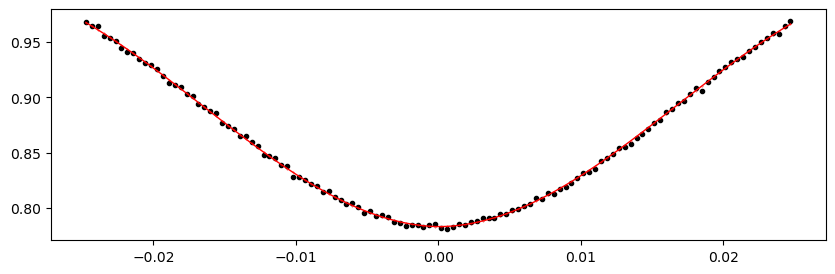

2671.482375 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.39it/s]


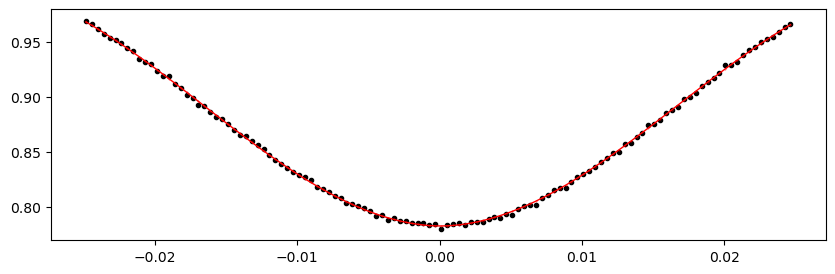

2674.8242 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.88it/s]


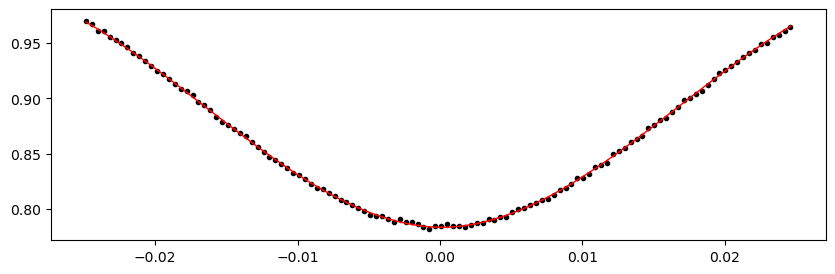

2678.166025 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.83it/s]


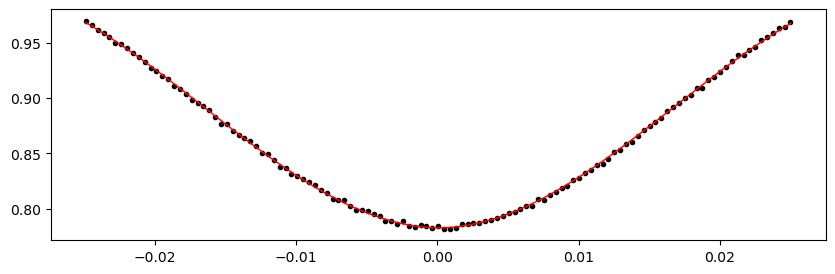

2684.849675 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.50it/s]


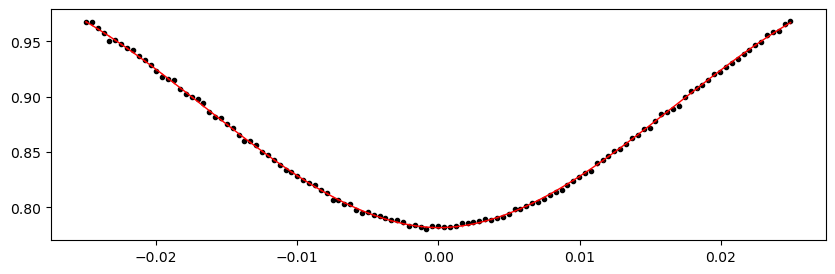

2688.1915 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.74it/s]


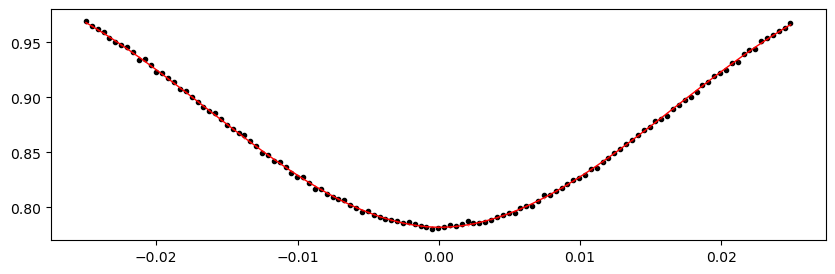

2691.533325 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.73it/s]


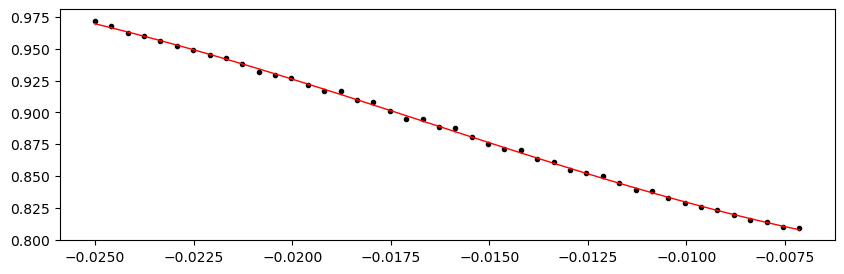

2698.2169750000003 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.98it/s]


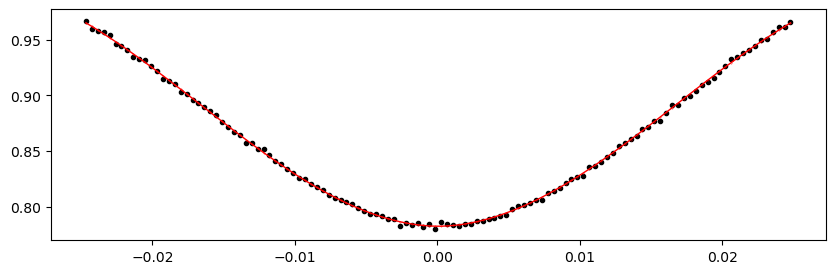

2701.5588 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.88it/s]


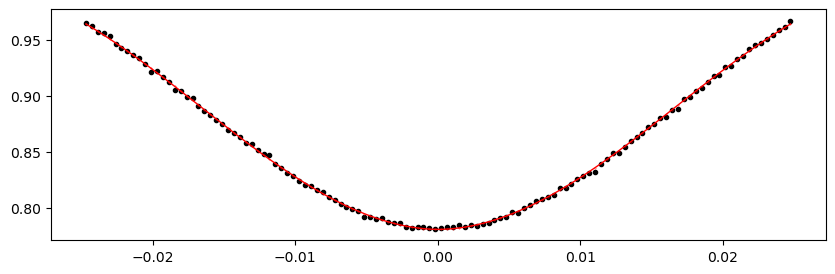

2711.584275 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.77it/s]


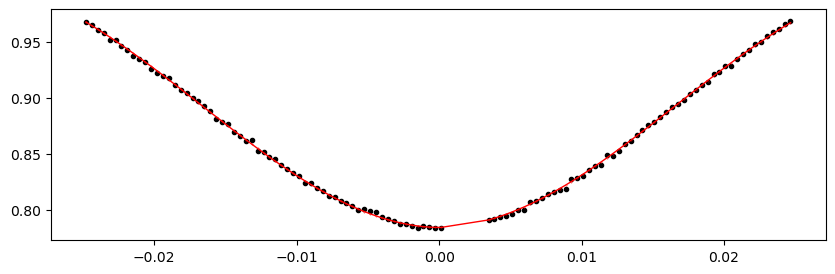

2714.9260999999997 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.23it/s]


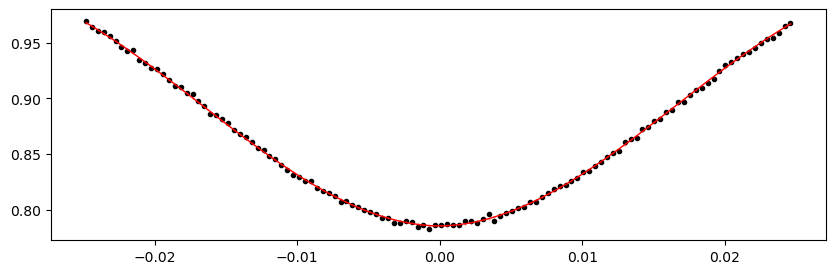

2724.951575 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.84it/s]


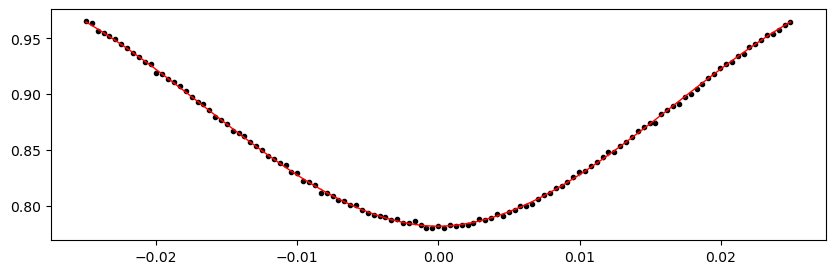

2728.2934 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.62it/s]


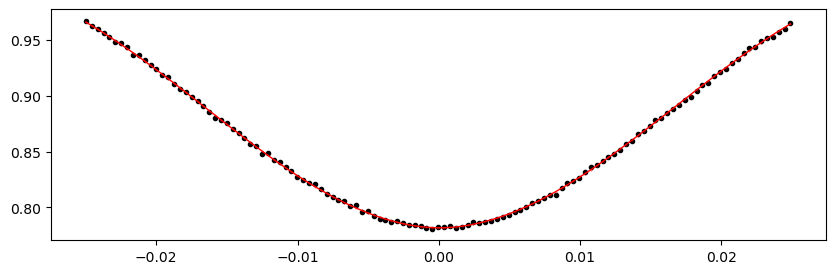

2731.635225 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.99it/s]


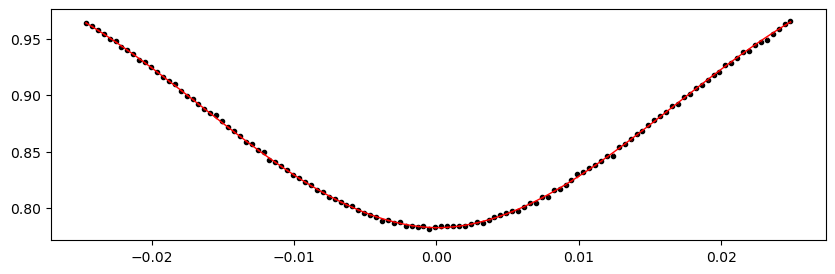

2738.318875 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.76it/s]


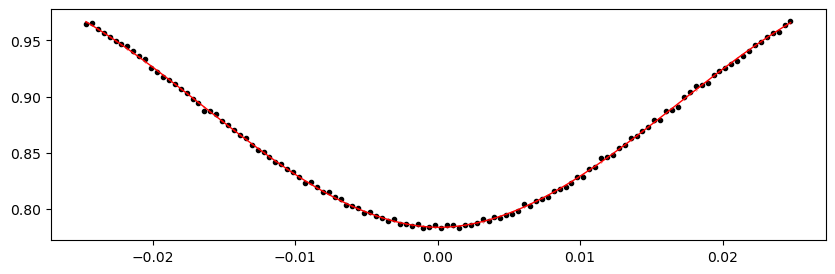

2741.6607000000004 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 321.89it/s]


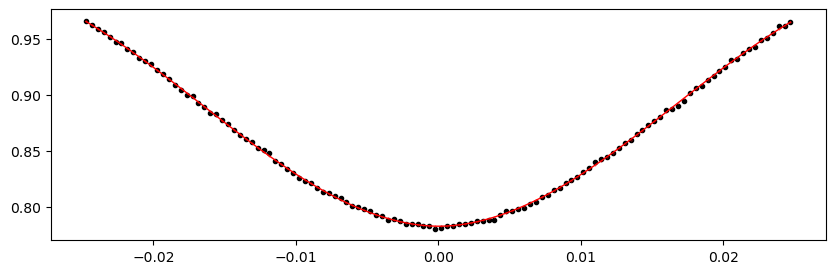

2771.737125 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.87it/s]


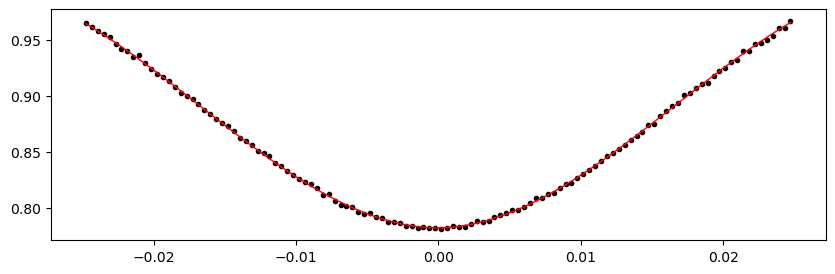

2775.07895 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.17it/s]


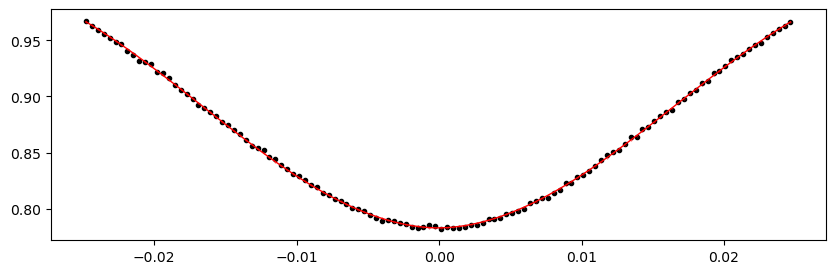

2778.420775 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.53it/s]


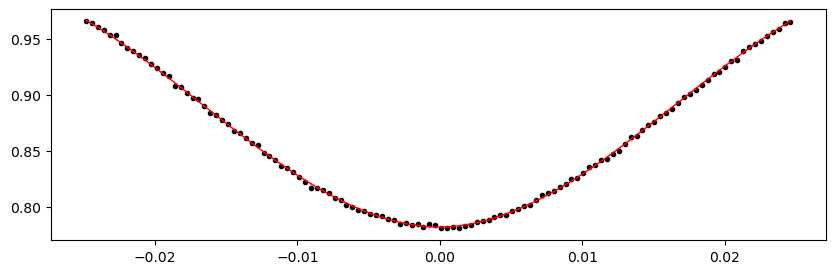

2781.7626 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.95it/s]


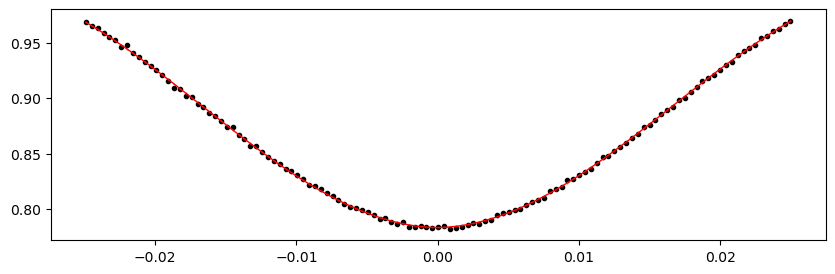

2785.104425 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.08it/s]


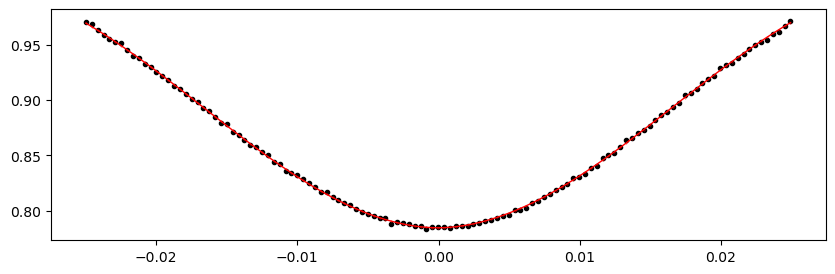

2788.44625 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.41it/s]


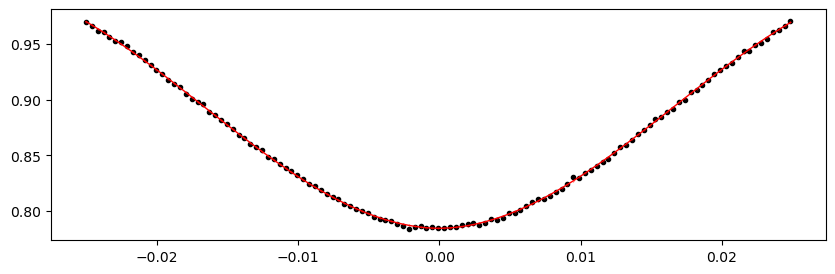

2791.788075 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.13it/s]


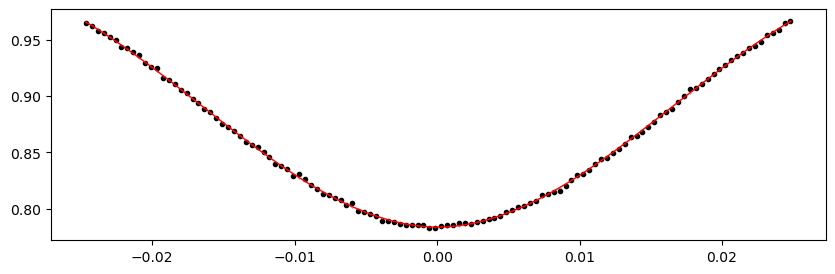

2795.1299 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.54it/s]


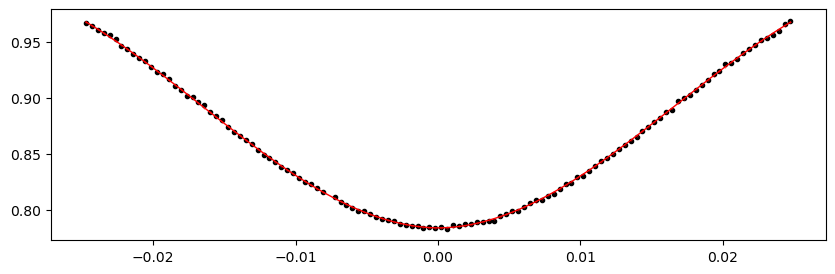

2798.4717250000003 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.83it/s]


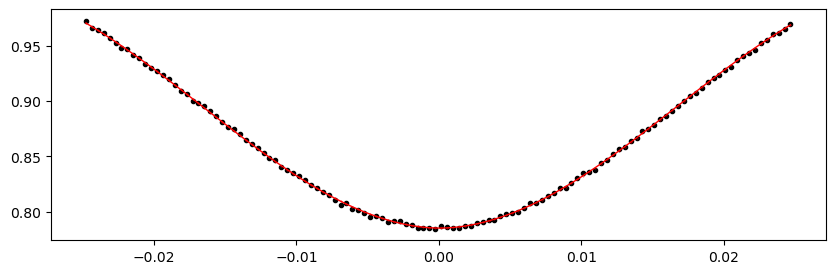

2801.81355 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.08it/s]


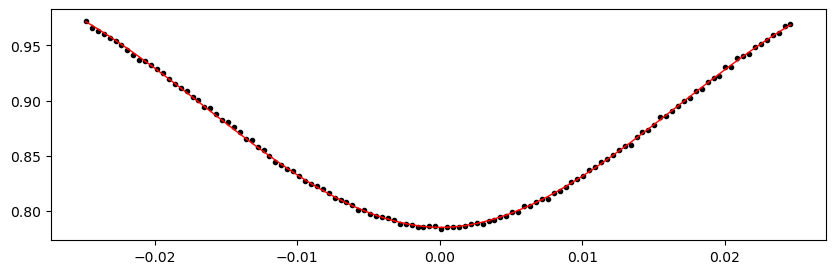

2805.1553750000003 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.80it/s]


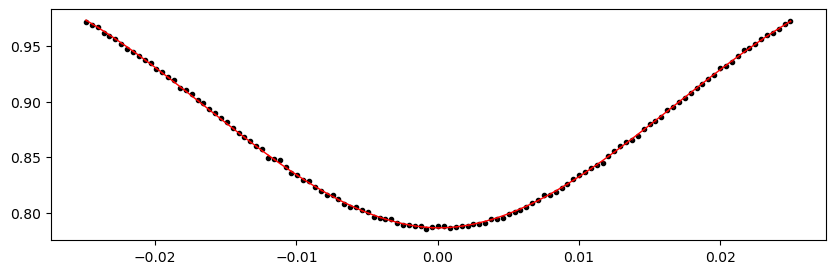

2808.4972 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.27it/s]


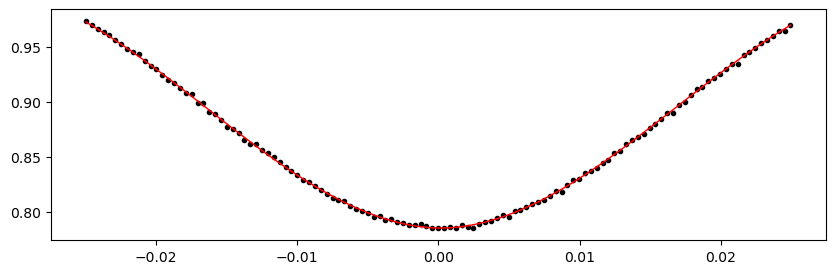

2811.839025 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.53it/s]


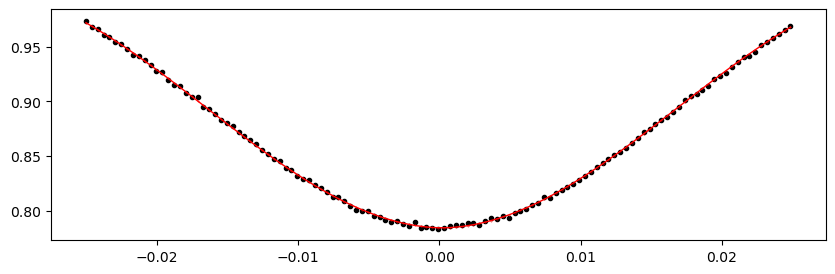

2815.1808499999997 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.63it/s]


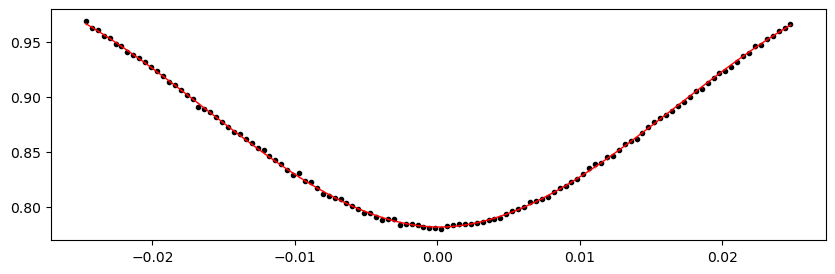

2818.522675 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.82it/s]


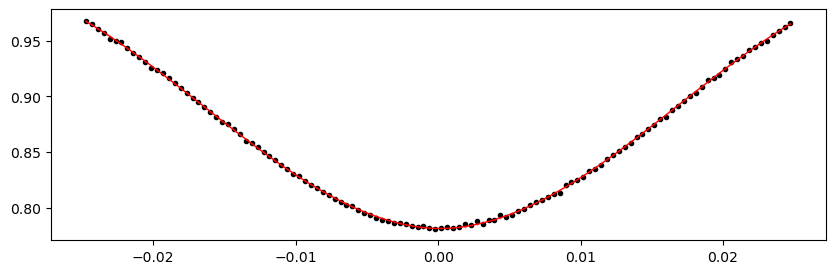

2821.8644999999997 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.77it/s]


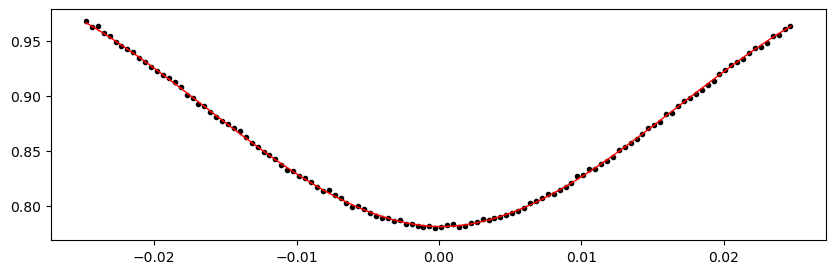

2825.206325 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.30it/s]


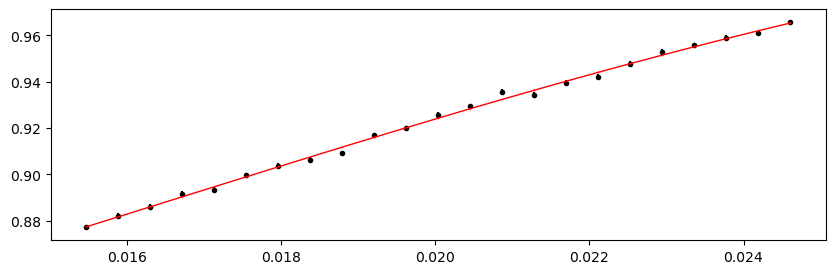

2828.54815 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.22it/s]


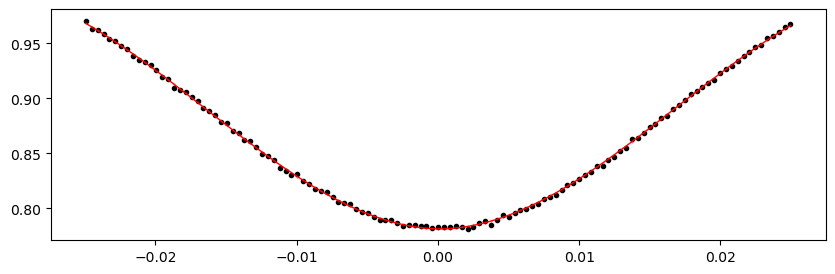

2831.889975 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.06it/s]


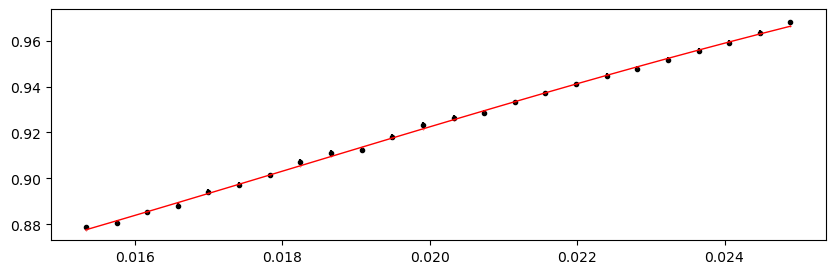

2835.2318 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.71it/s]


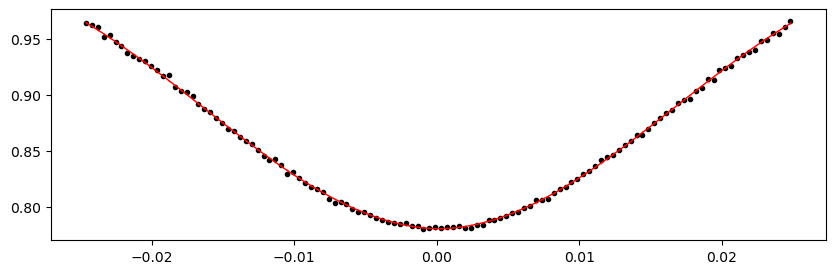

Time 2838.573625 does not have enough data points: 17
2841.91545 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.46it/s]


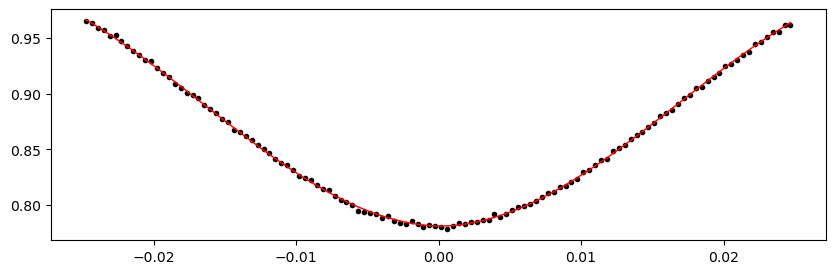

2845.257275 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.89it/s]


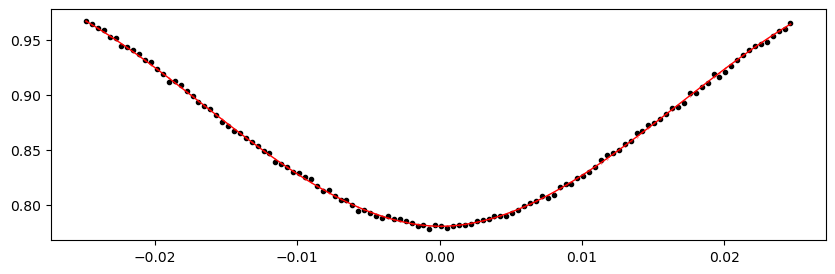

2848.5991000000004 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.36it/s]


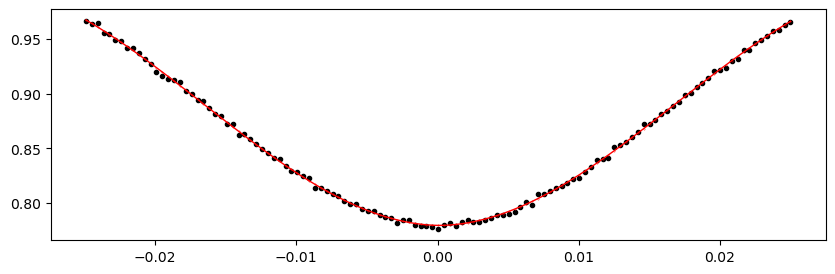

2851.940925 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.80it/s]


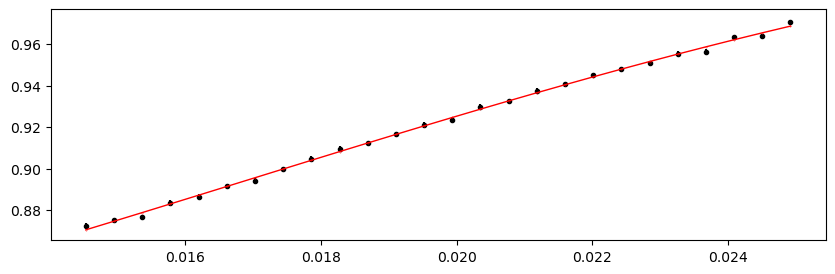

2855.2827500000003 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.56it/s]


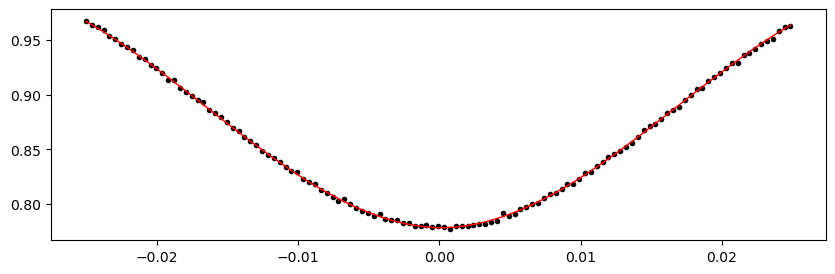

2858.624575 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.25it/s]


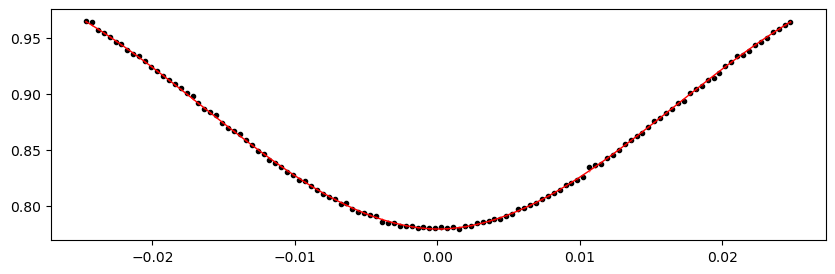

2861.9664000000002 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.55it/s]


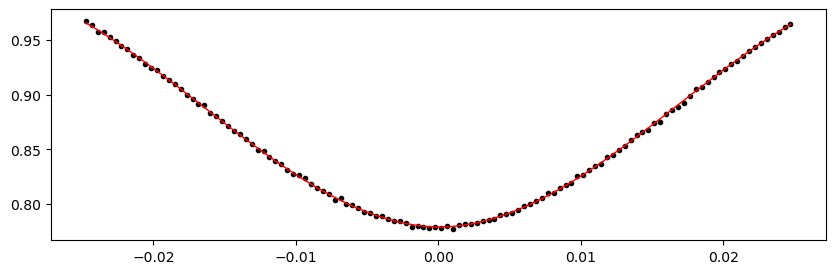

2868.65005 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.68it/s]


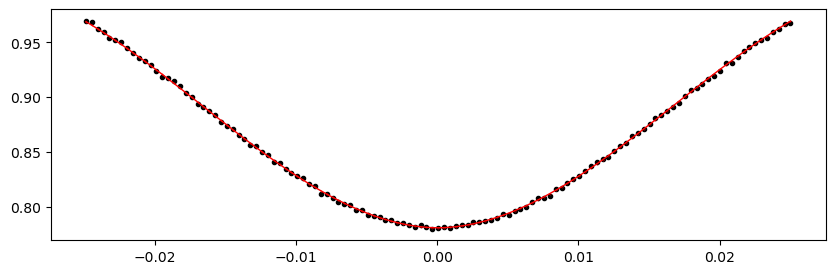

2871.9918749999997 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.80it/s]


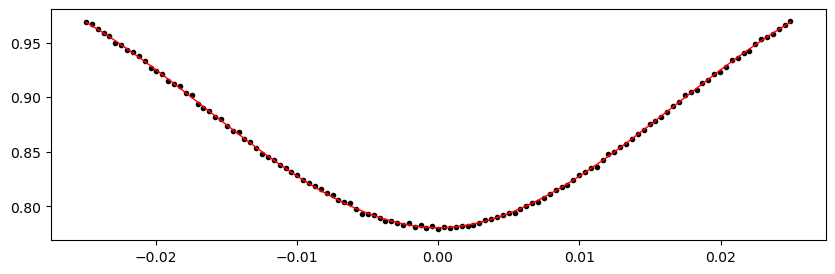

2875.3337 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.63it/s]


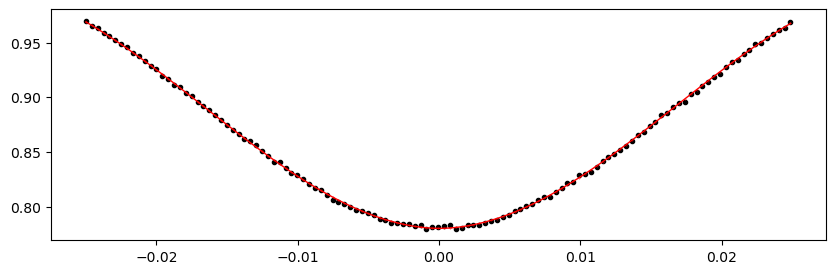

2878.675525 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.22it/s]


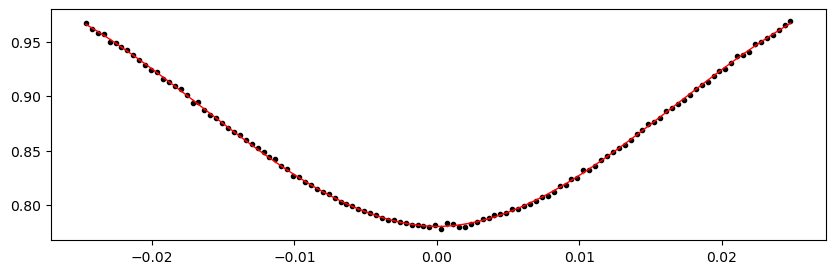

2882.01735 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.66it/s]


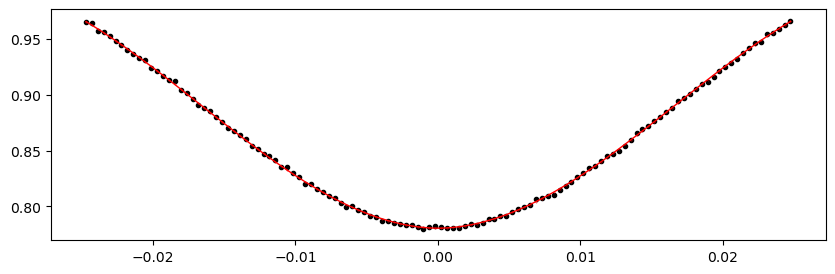

2885.359175 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.17it/s]


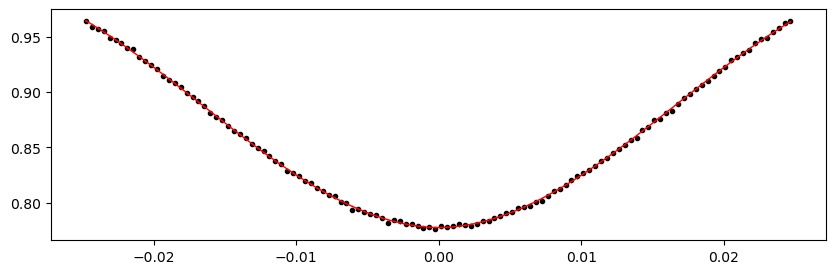

2888.701 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.47it/s]


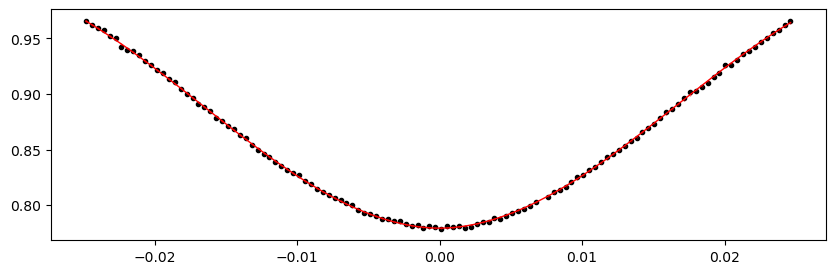

2892.042825 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.30it/s]


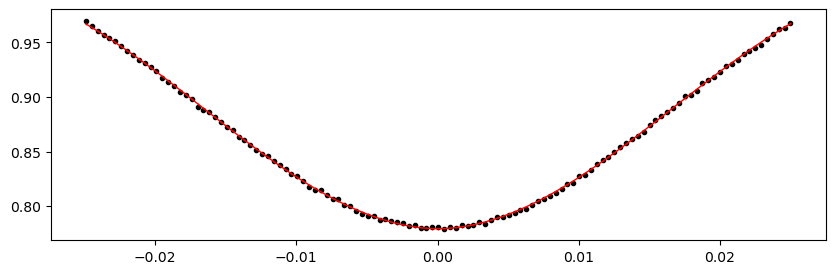

2895.38465 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.69it/s]


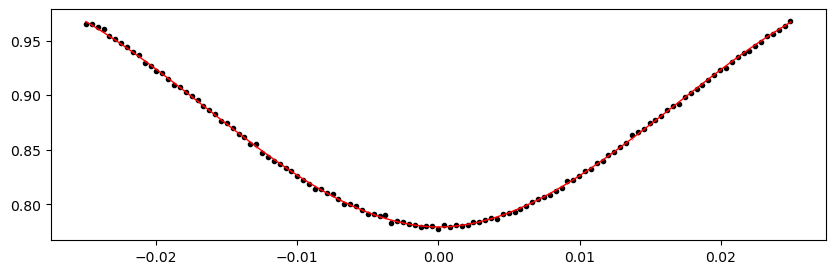

2898.726475 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.24it/s]


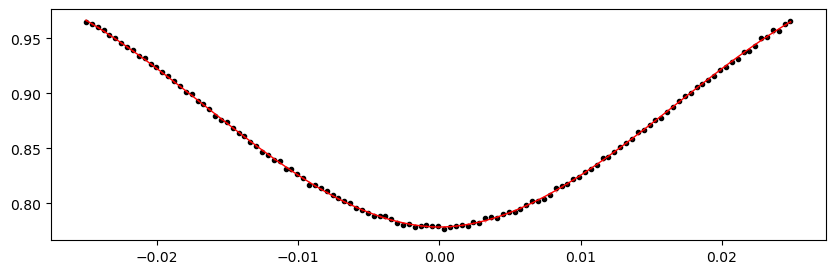

2902.0683 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.82it/s]


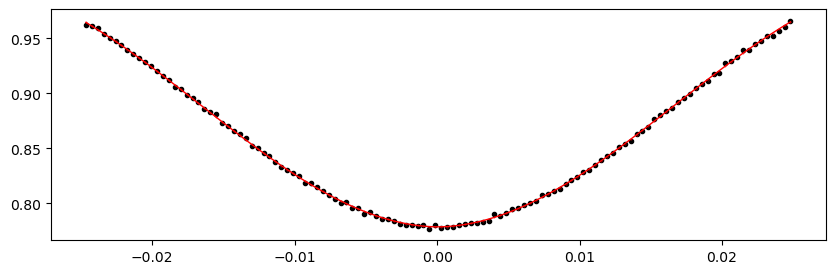

2905.4101250000003 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.20it/s]


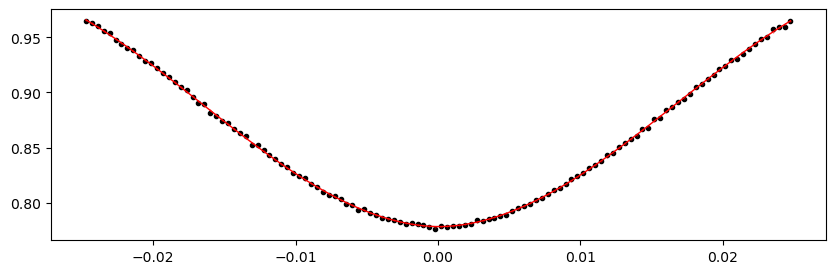

2908.75195 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.26it/s]


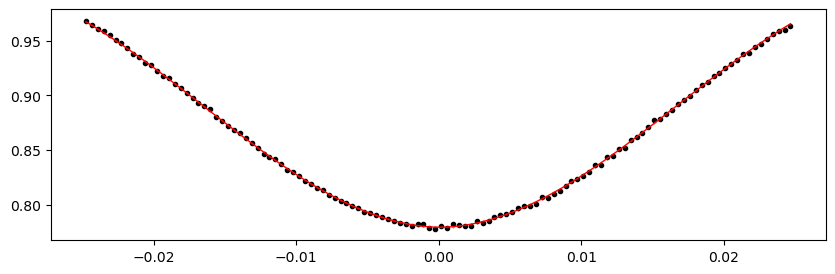

2915.4356 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.98it/s]


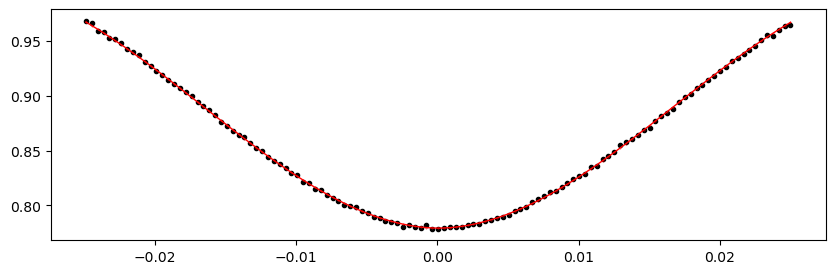

2918.777425 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.30it/s]


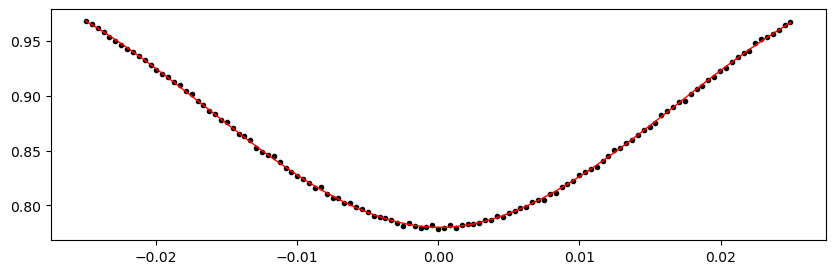

2922.1192499999997 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.26it/s]


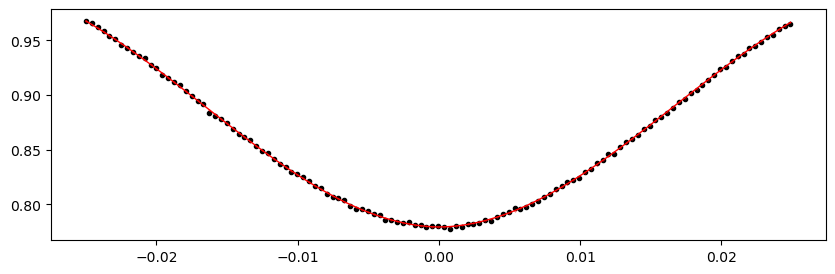

2928.8028999999997 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.56it/s]


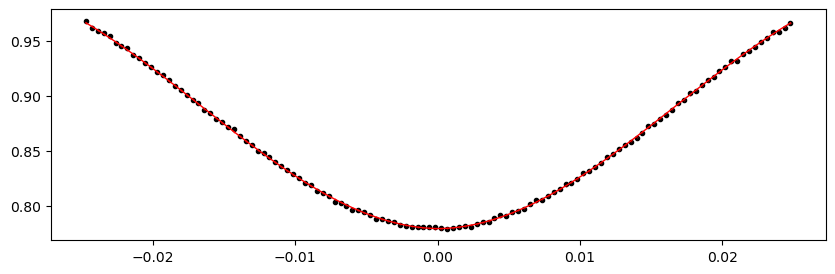

2932.144725 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.65it/s]


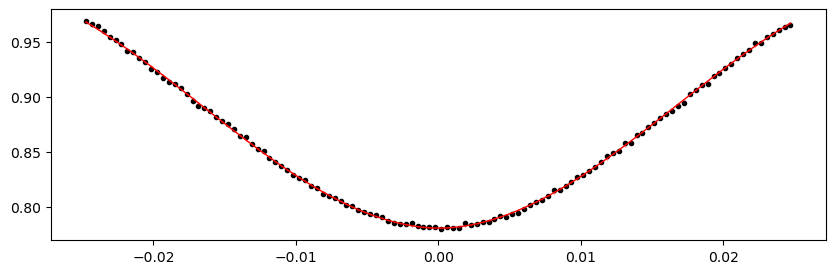

2935.48655 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.66it/s]


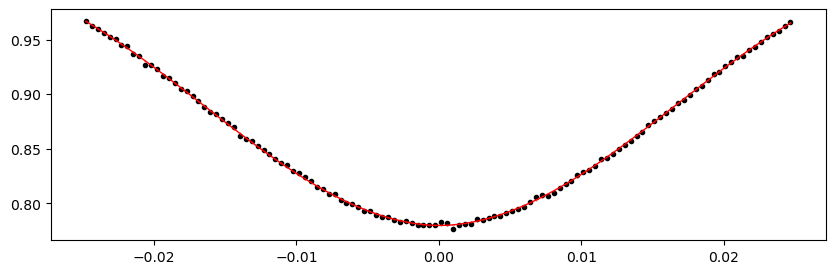

2942.1702 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.16it/s]


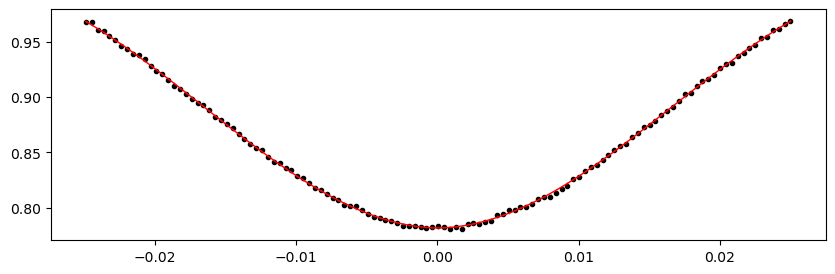

2945.512025 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.96it/s]


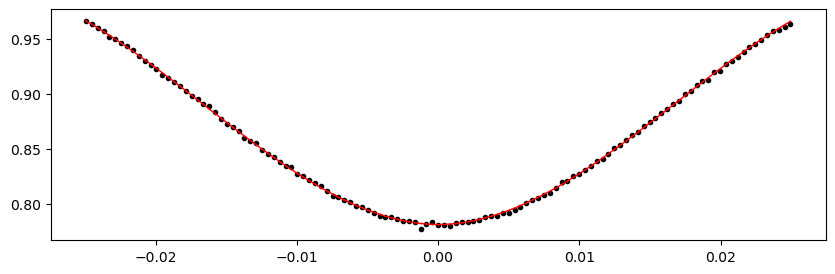

2948.85385 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.36it/s]


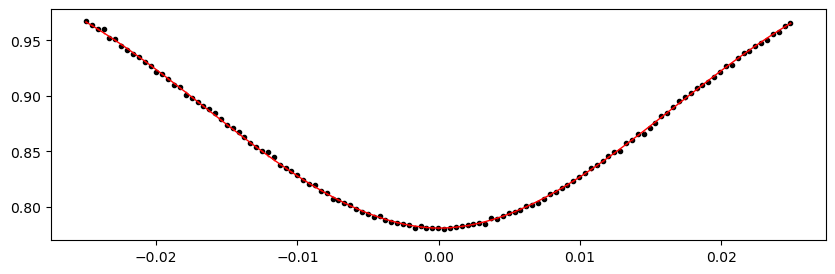

2955.5375000000004 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.93it/s]


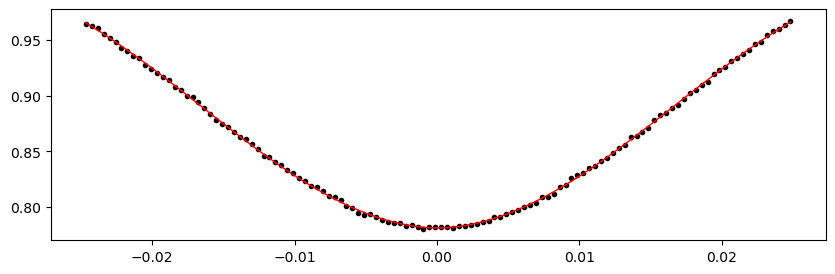

2958.879325 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.76it/s]


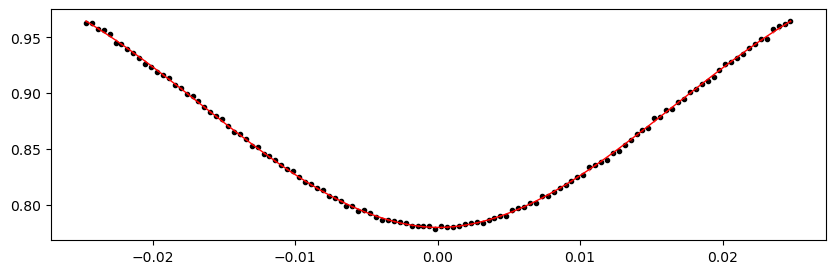

2962.2211500000003 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.12it/s]


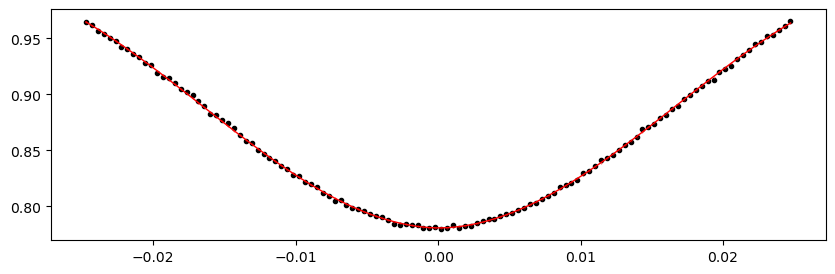

3293.0618249999998 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.27it/s]


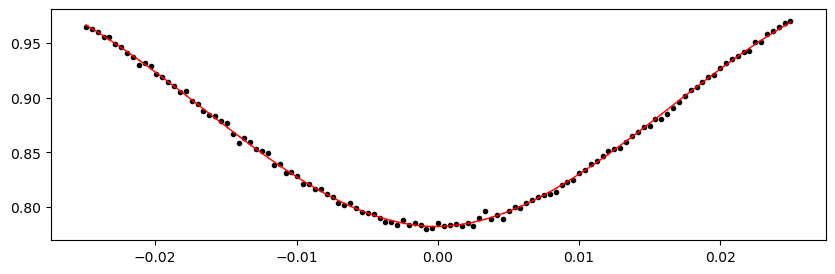

3296.40365 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.21it/s]


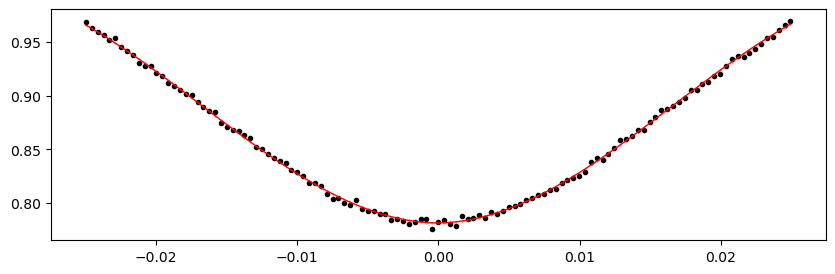

3306.429125 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.78it/s]


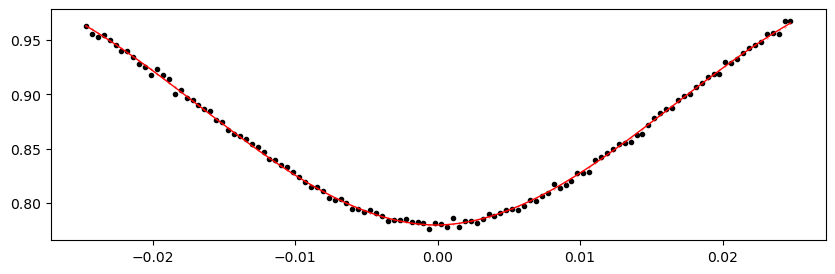

3309.77095 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.88it/s]


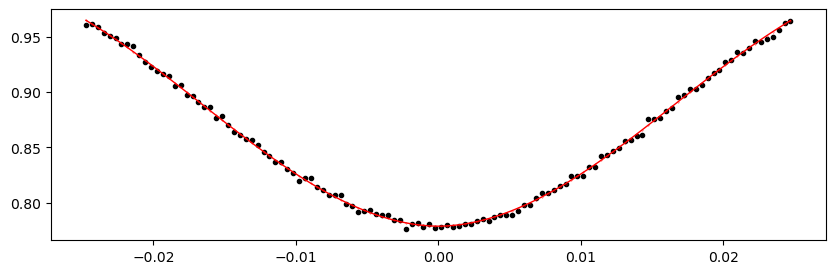

3313.112775 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.64it/s]


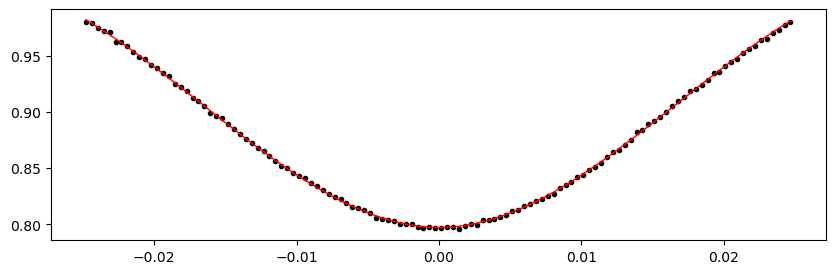

3316.4546 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.02it/s]


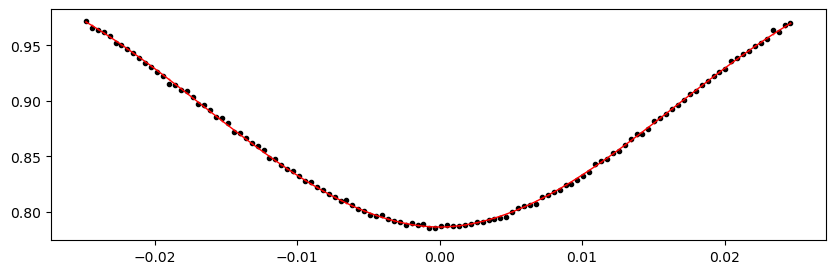

3319.796425 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.41it/s]


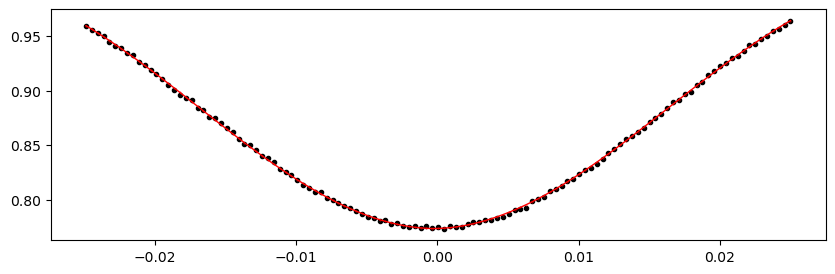

3323.13825 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.79it/s]


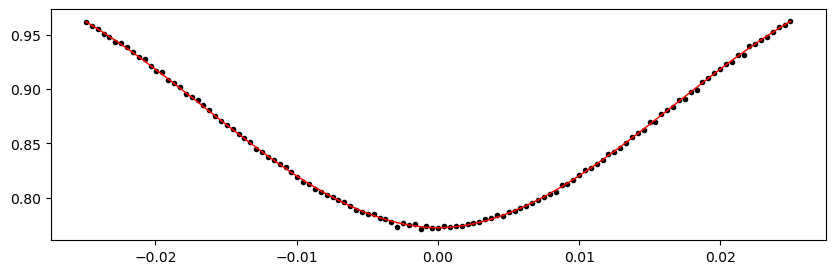

3326.480075 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.32it/s]


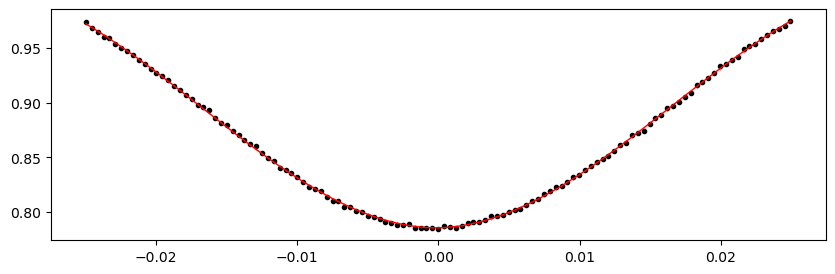

3329.8219 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.73it/s]


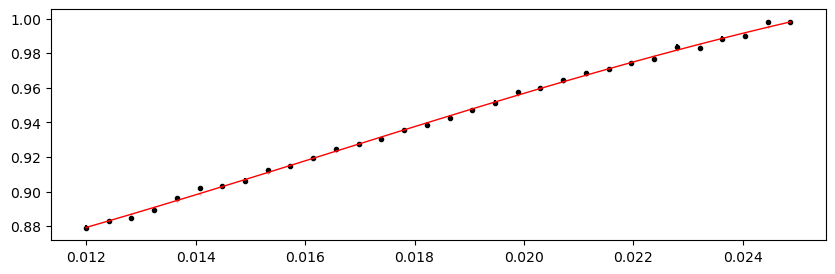

3333.1637250000003 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.39it/s]


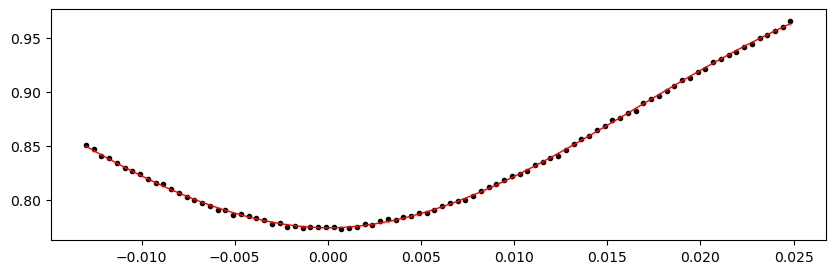

3336.50555 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.68it/s]


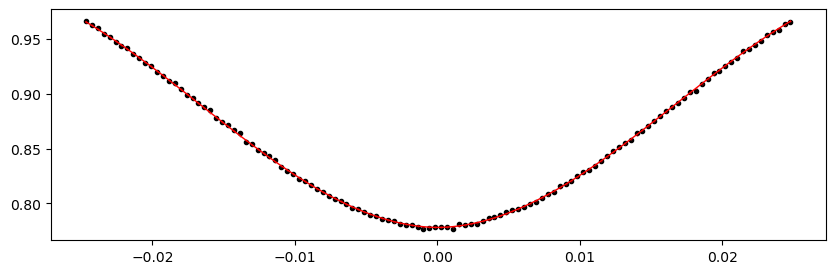

3339.8473750000003 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.46it/s]


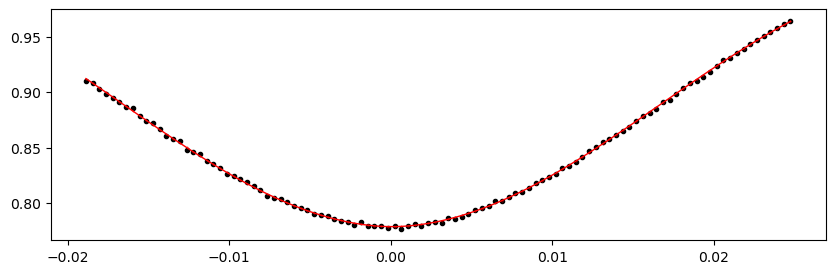

Time 3343.1892 does not have enough data points: 13
3346.531025 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.36it/s]


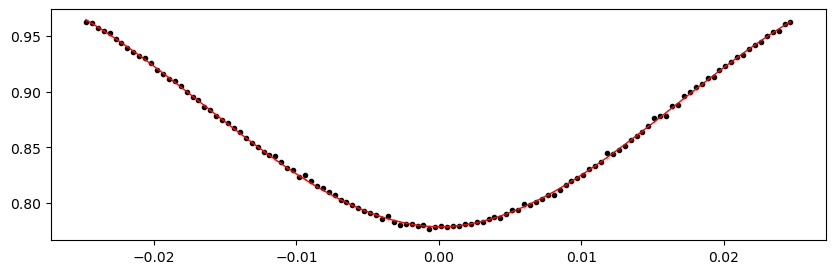

3349.8728499999997 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.57it/s]


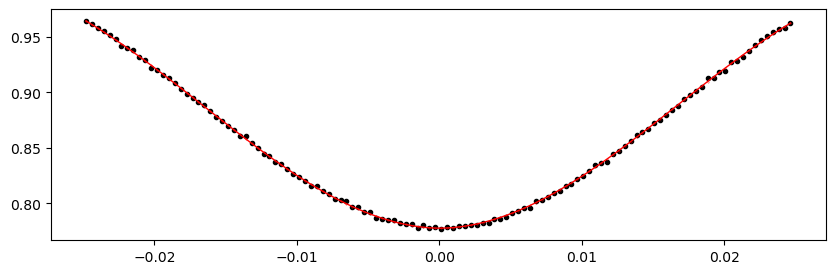

3353.214675 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.10it/s]


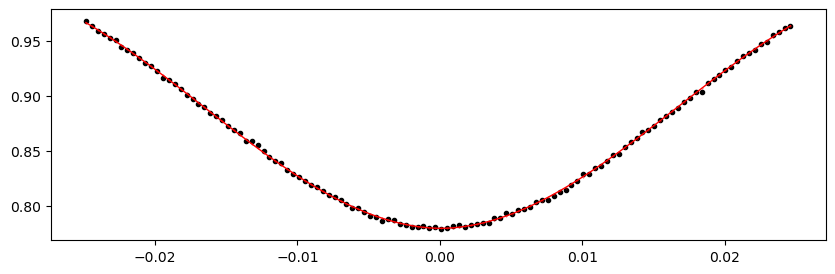

3359.898325 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.64it/s]


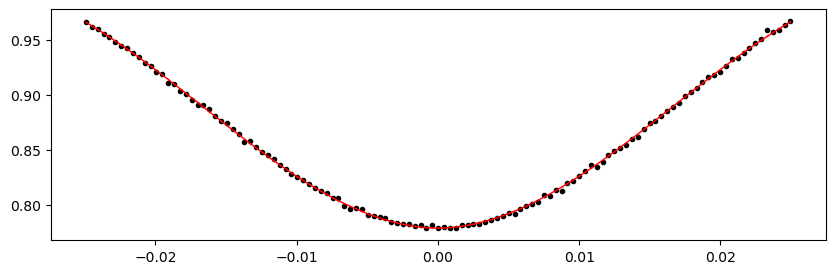

3363.24015 1.0224077130567308 -0.24142476423510215 0.225009275182493


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.76it/s]


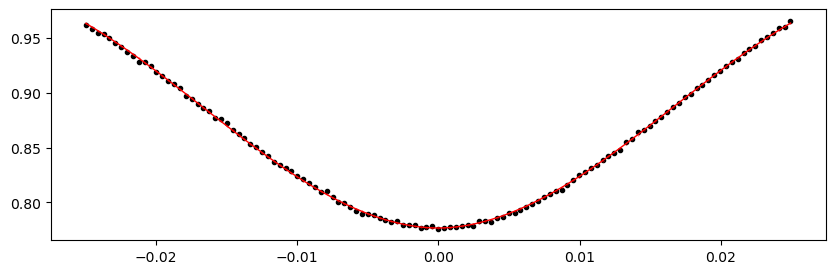

In [25]:
%matplotlib inline

print("Fitting individual primary eclipses...")
etv_functions.fit_each_eclipse(data_primary, n_transits, t0_primary, period, mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, outfile_path)
!$NOTIFY_CMD "Individual primary eclipses fit done"


Fitting individual secondary eclipses...
Existing manifest file found, will skip previously processed LCs and append to end of manifest file
Number 0 has already been completed -- skip
1687.3149125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.95it/s]


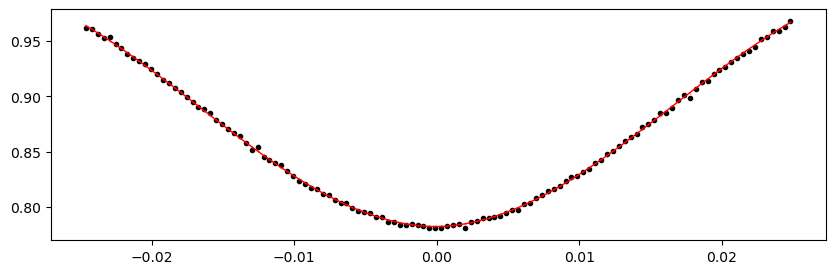

1690.6567375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.43it/s]


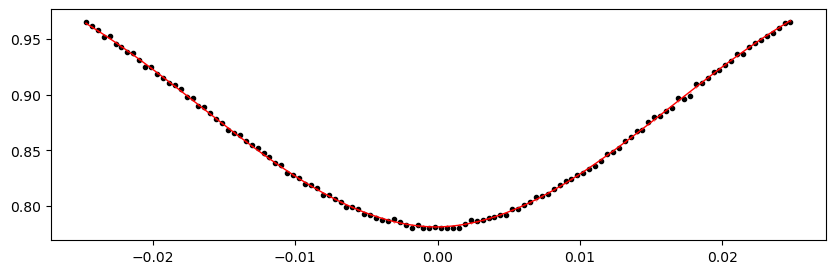

1697.3403875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.82it/s]


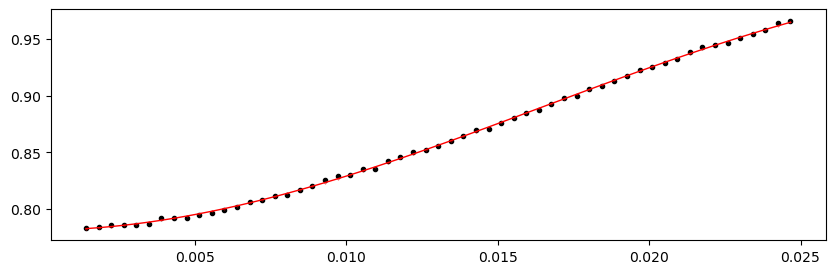

1700.6822125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.58it/s]


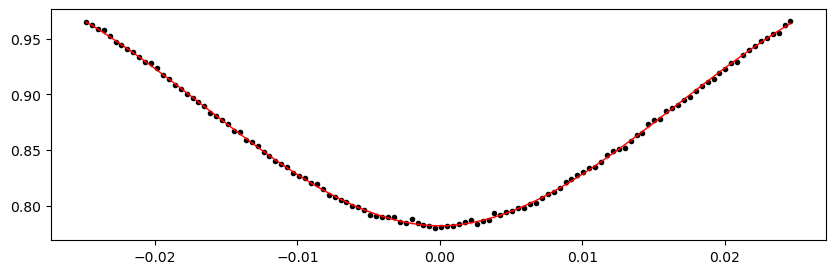

1704.0240375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.82it/s]


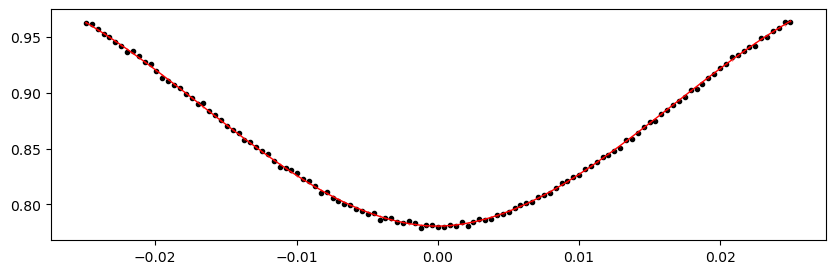

1714.0495125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.87it/s]


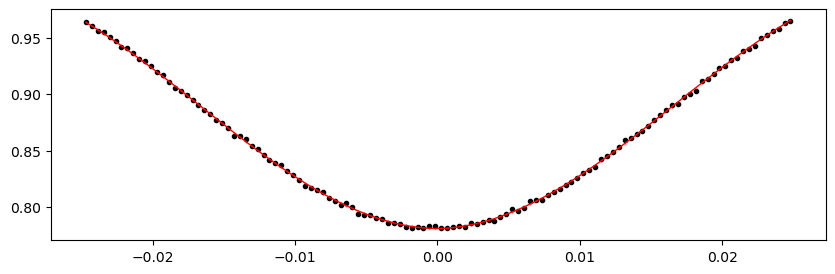

1717.3913375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.65it/s]


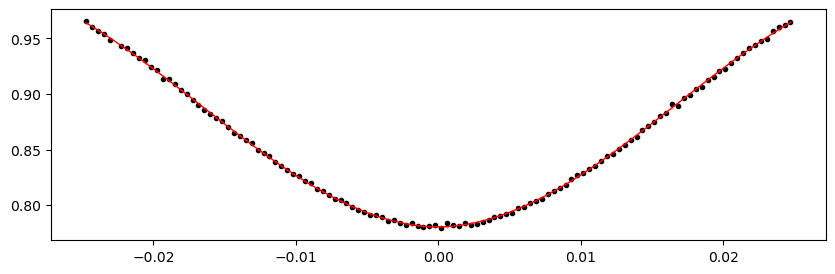

1727.4168125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.53it/s]


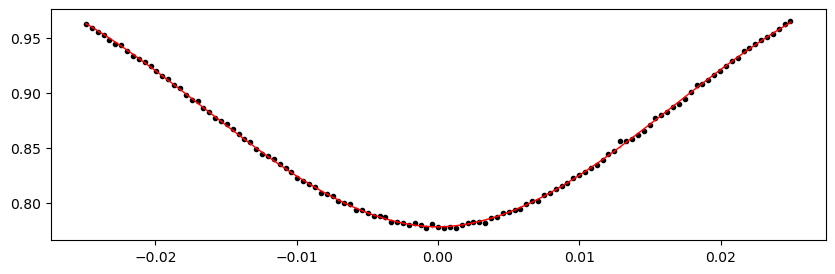

1730.7586375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.72it/s]


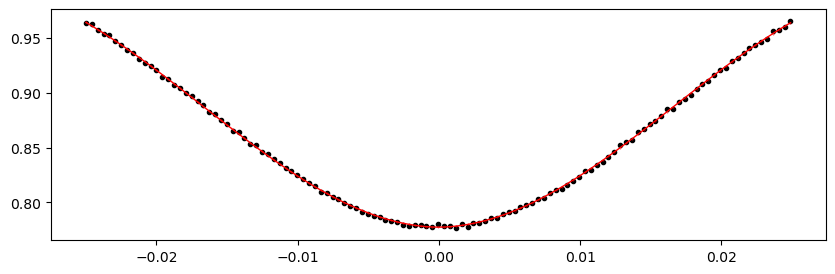

1734.1004625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.81it/s]


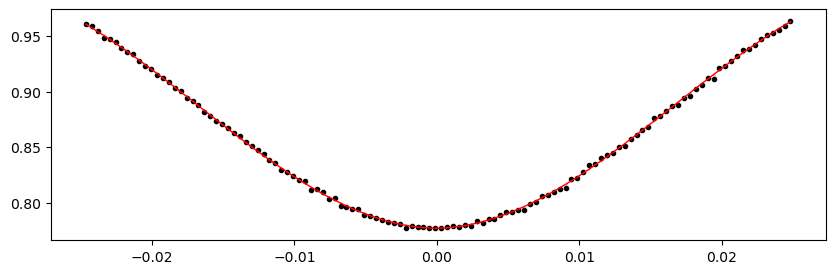

1740.7841125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.70it/s]


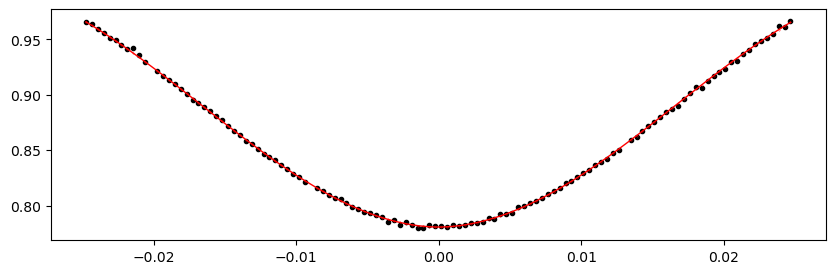

1744.1259375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.43it/s]


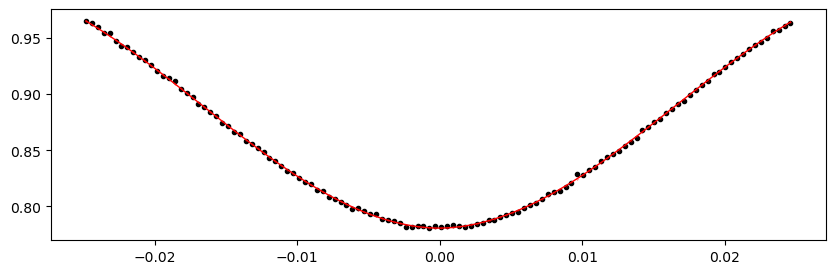

1747.4677625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.59it/s]


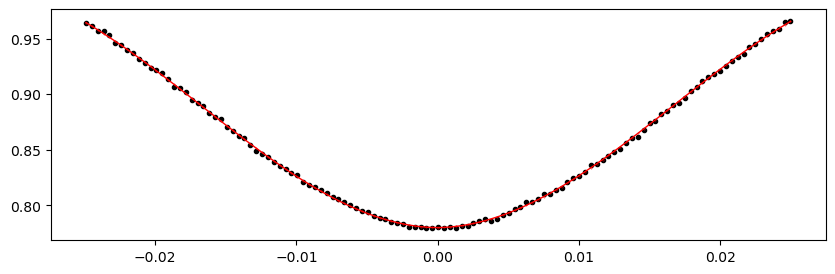

1754.1514125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.30it/s]


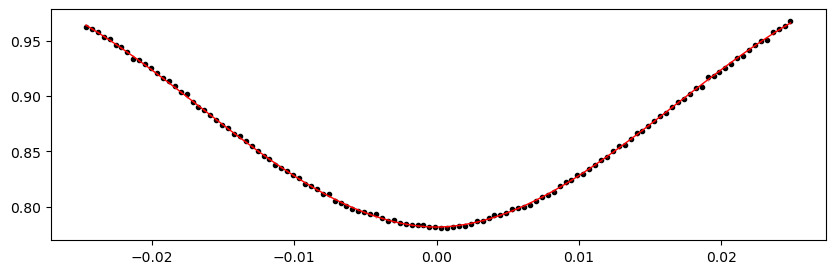

1757.4932375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.53it/s]


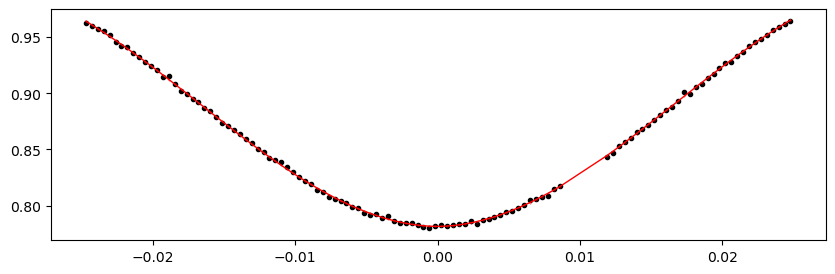

1760.8350625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.79it/s]


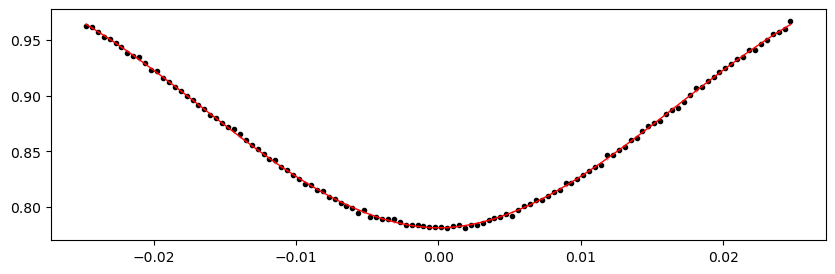

1767.5187125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.63it/s]


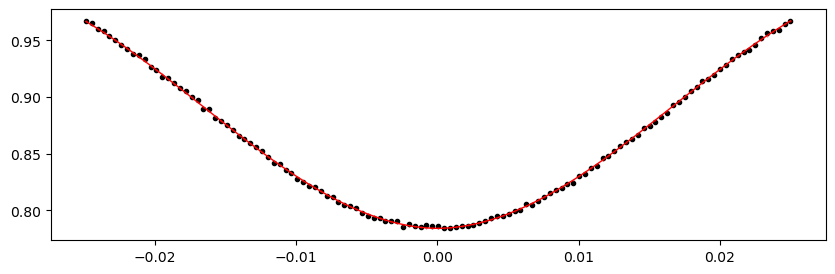

1770.8605375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.62it/s]


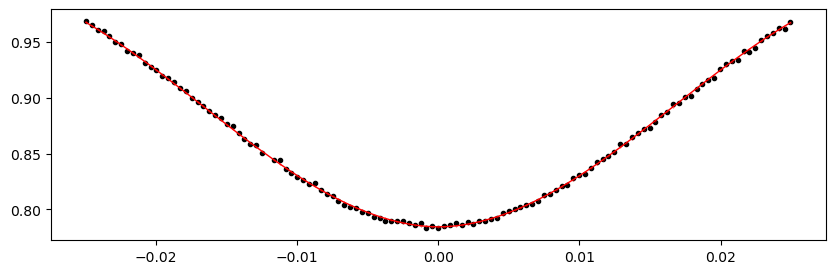

1780.8860125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.10it/s]


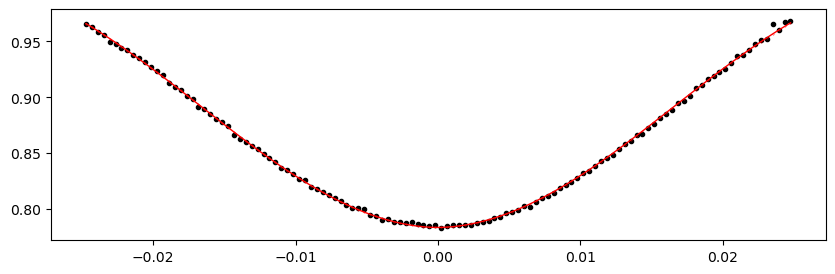

1784.2278375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.27it/s]


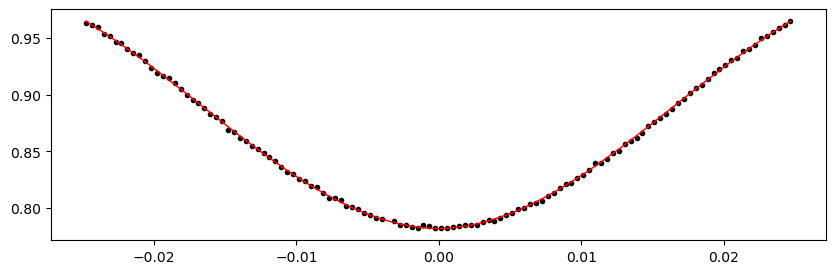

1790.9114875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.20it/s]


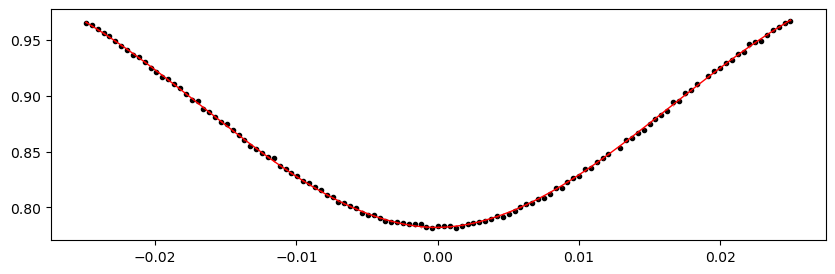

1794.2533125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.12it/s]


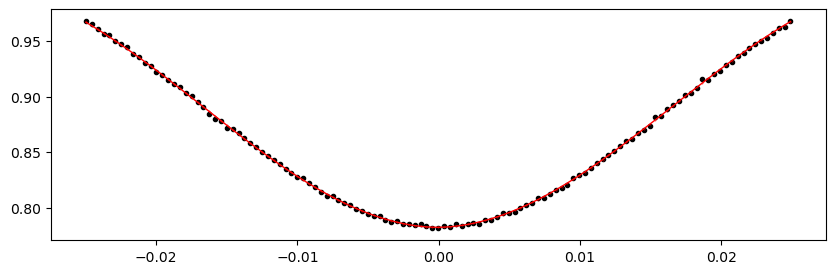

1797.5951375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.62it/s]


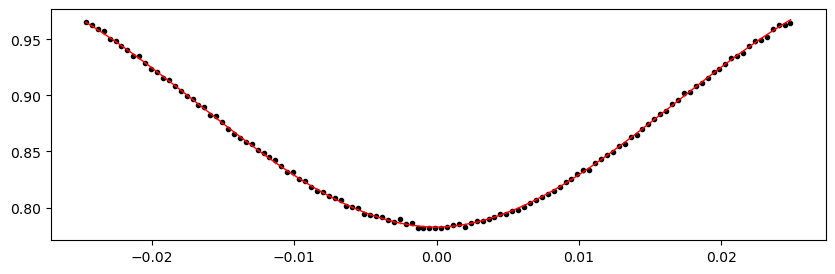

1804.2787875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.44it/s]


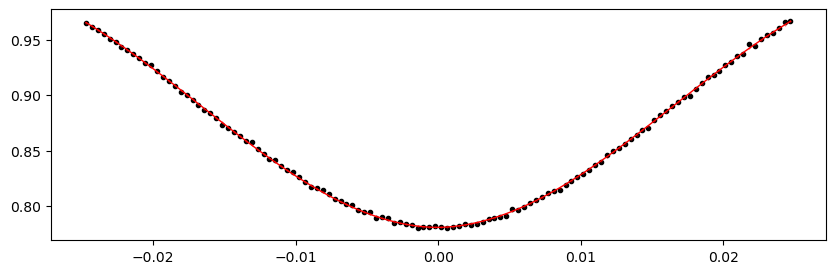

1807.6206125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.57it/s]


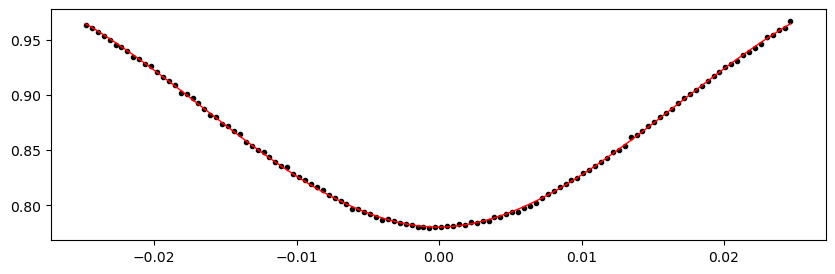

1810.9624375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.15it/s]


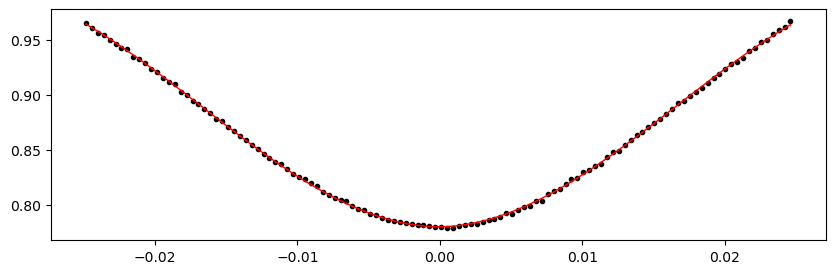

1817.6460875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.75it/s]


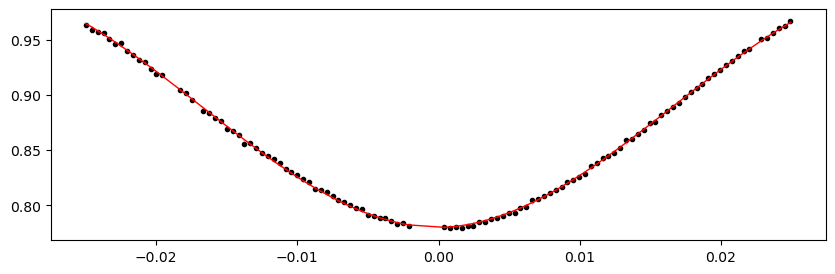

1820.9879125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.20it/s]


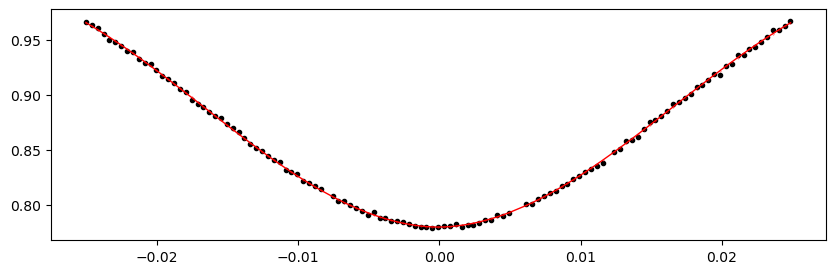

1824.3297375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.50it/s]


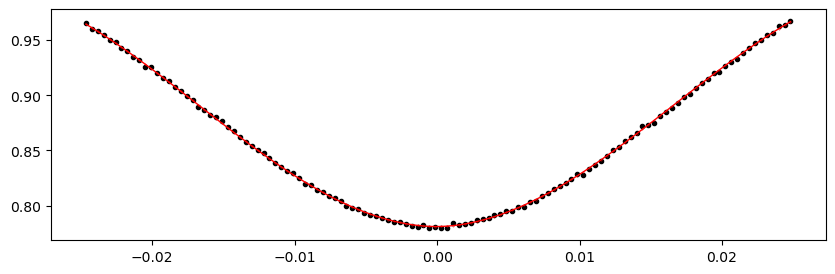

1831.0133875000001 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.12it/s]


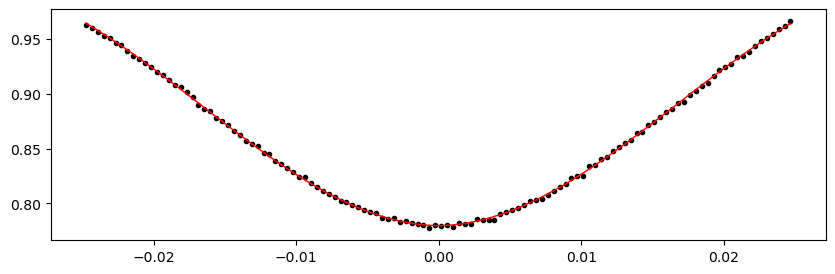

1834.3552125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.82it/s]


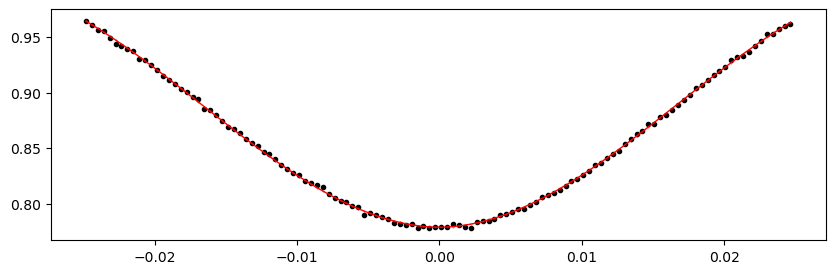

1837.6970375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.57it/s]


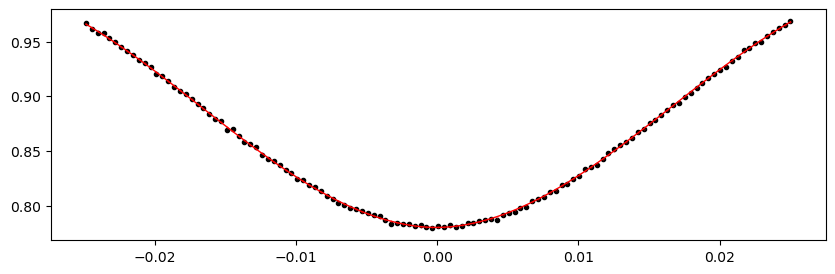

1844.3806875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.63it/s]


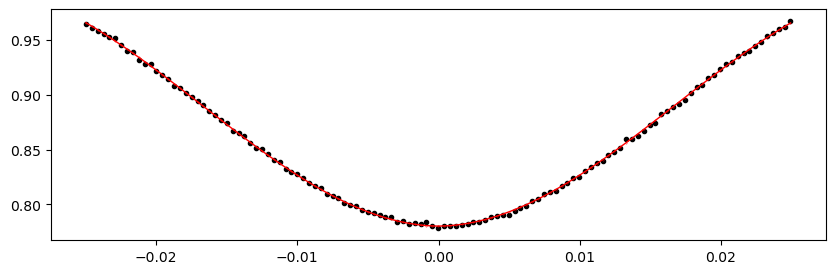

1847.7225125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.23it/s]


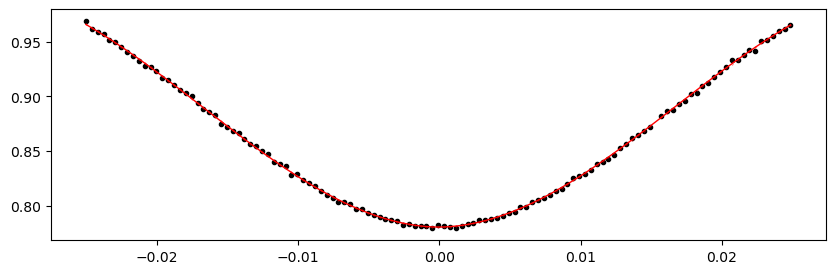

1851.0643375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.48it/s]


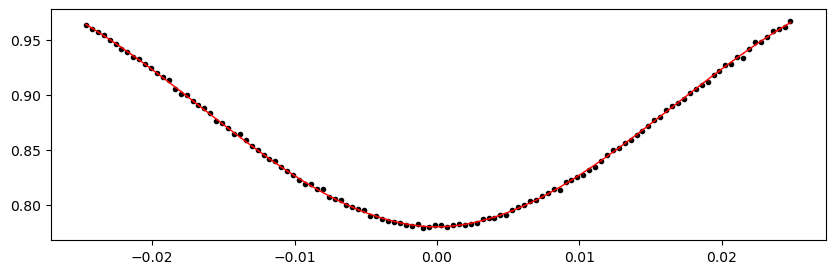

1854.4061625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.79it/s]


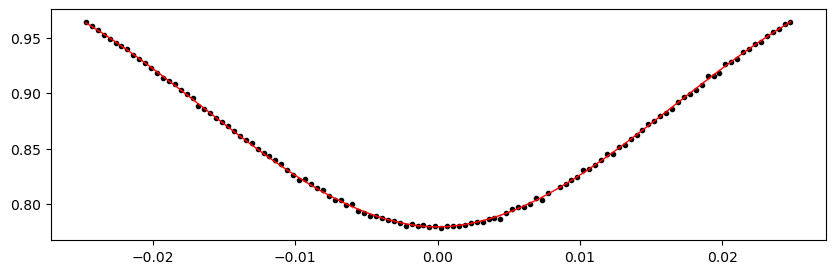

1857.7479875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.34it/s]


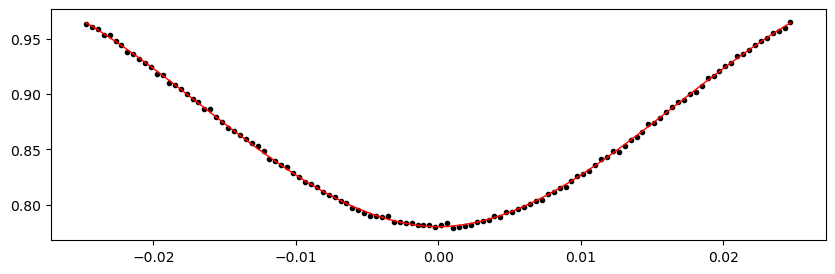

1861.0898125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.36it/s]


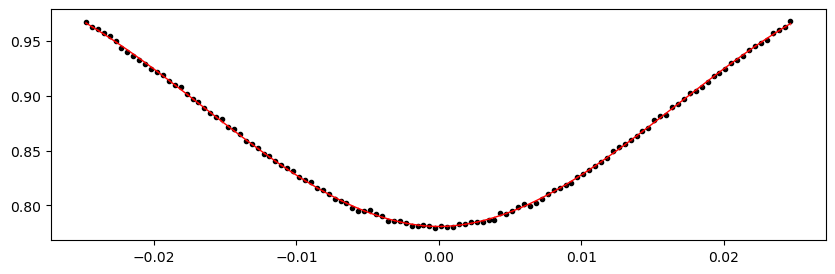

1864.4316375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.37it/s]


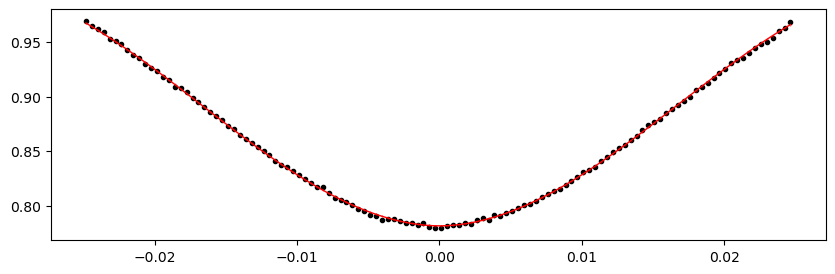

1867.7734625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.00it/s]


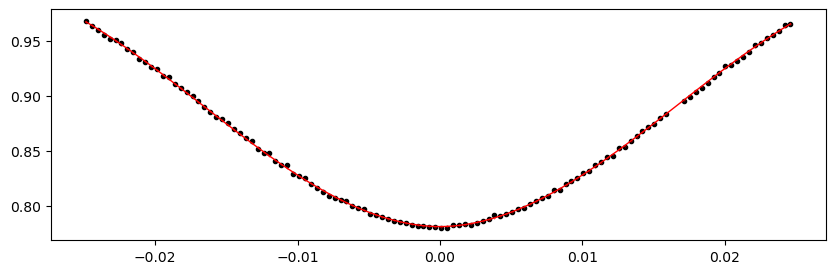

1871.1152875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.65it/s]


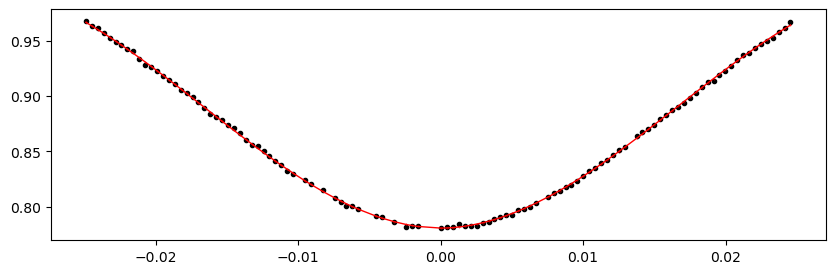

1874.4571125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.14it/s]


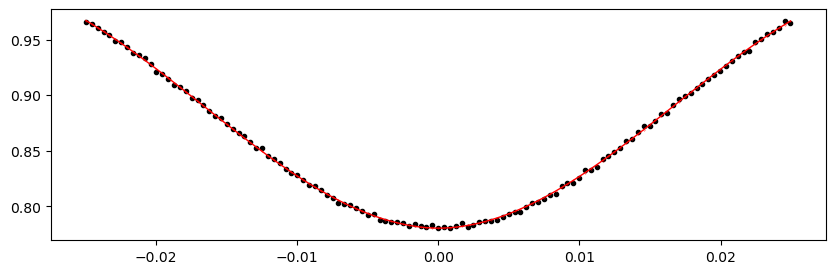

1877.7989375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.25it/s]


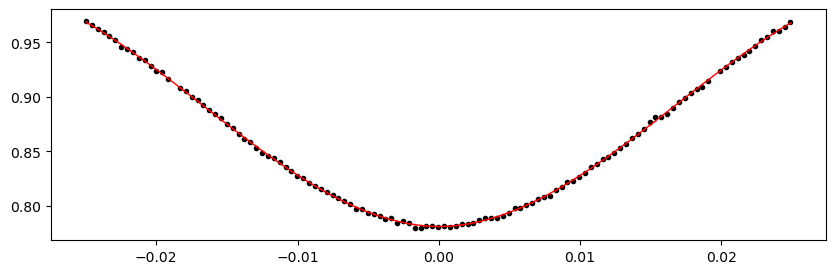

1881.1407625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.53it/s]


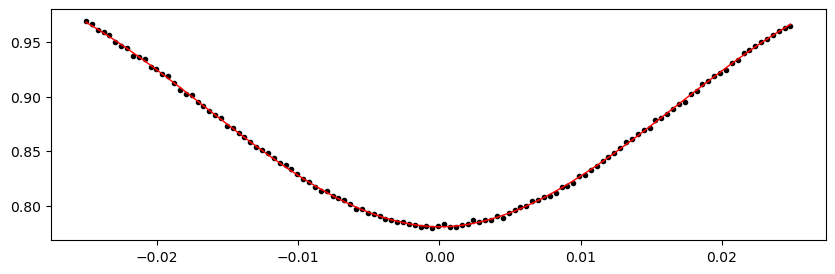

1887.8244125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.94it/s]


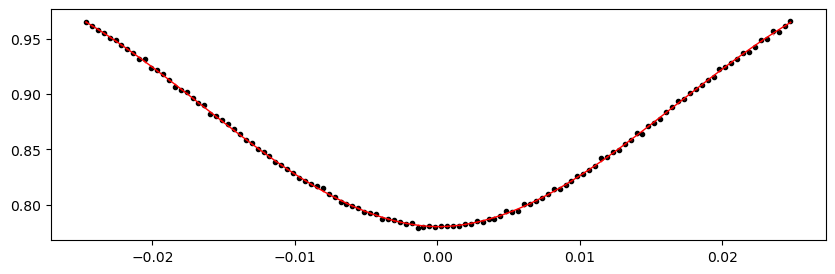

1891.1662375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.09it/s]


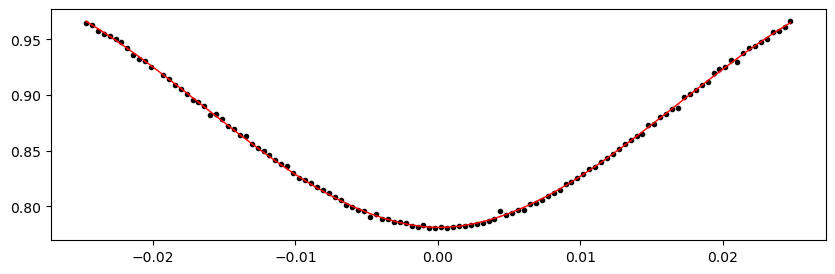

1894.5080625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.26it/s]


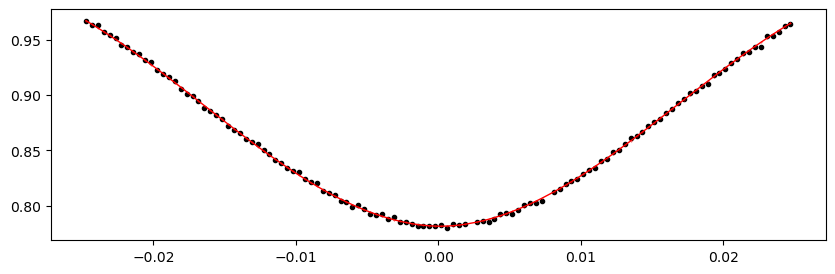

Time 1897.8498875 does not have enough data points: 10
1901.1917125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.95it/s]


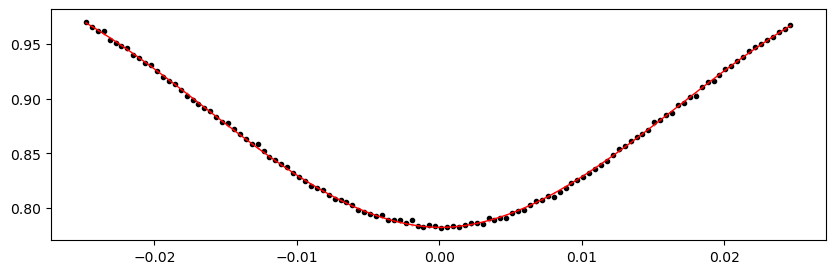

1904.5335375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.35it/s]


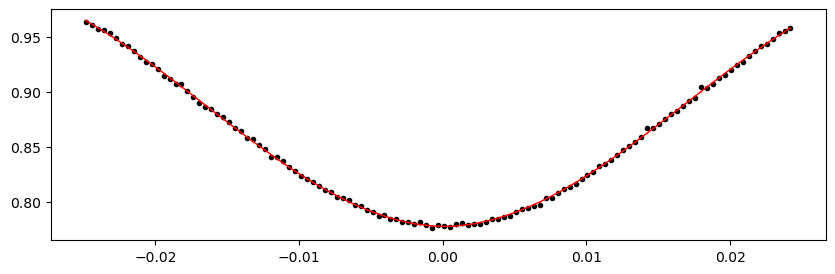

1907.8753625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.95it/s]


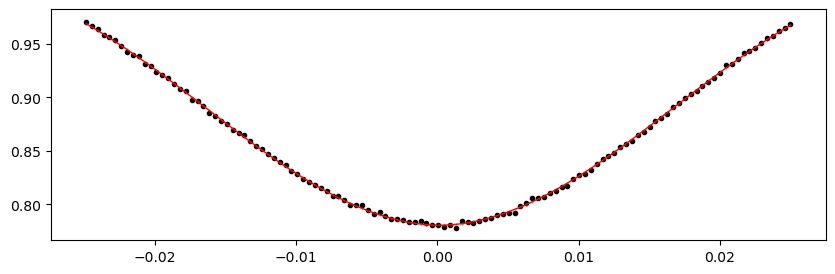

1911.2171875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.82it/s]


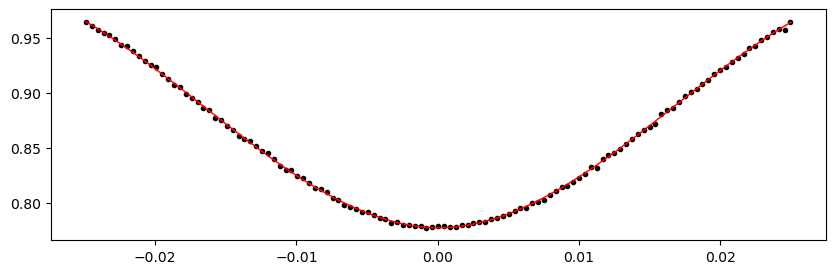

1917.9008375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.09it/s]


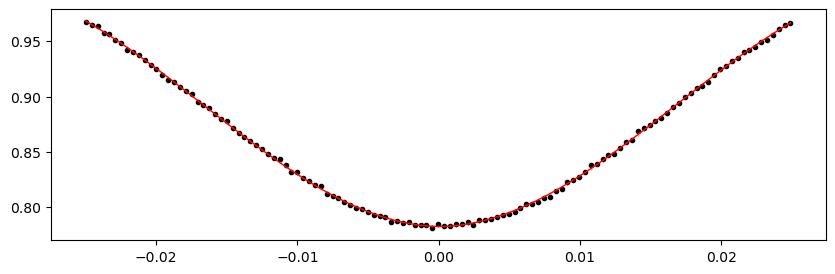

1921.2426625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.90it/s]


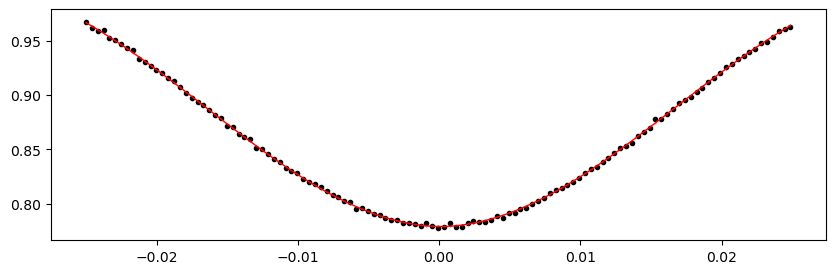

1924.5844875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.21it/s]


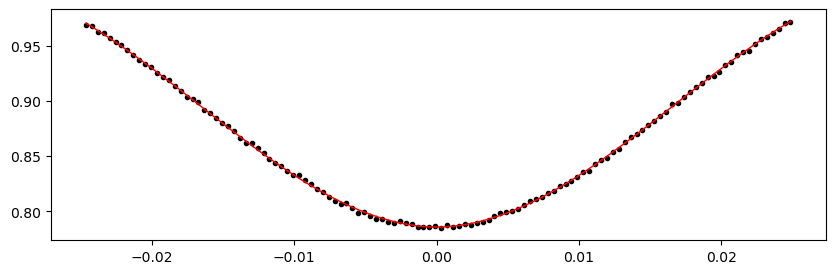

1931.2681375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.80it/s]


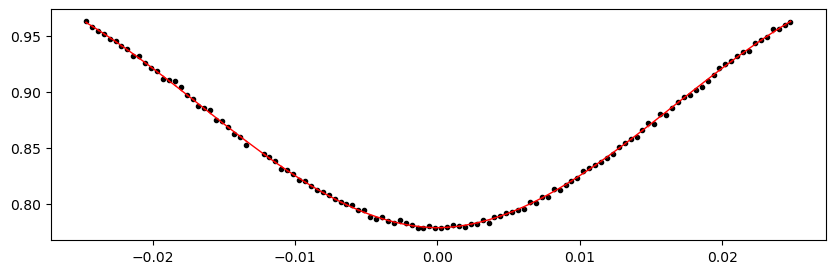

1934.6099625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.85it/s]


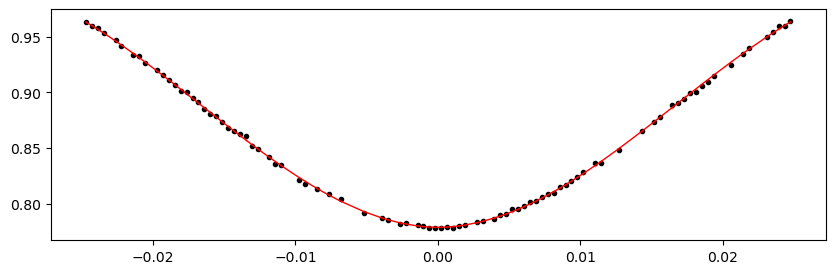

1937.9517875000001 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.82it/s]


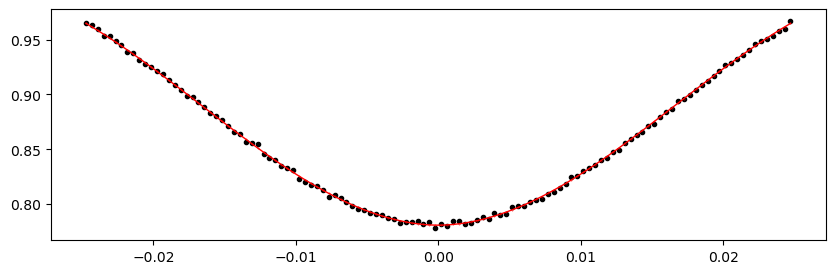

1944.6354375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.36it/s]


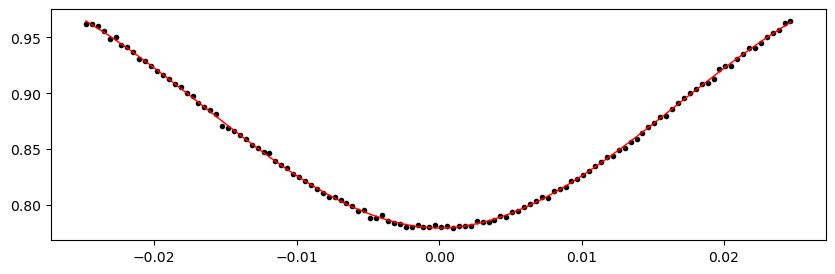

1947.9772625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.81it/s]


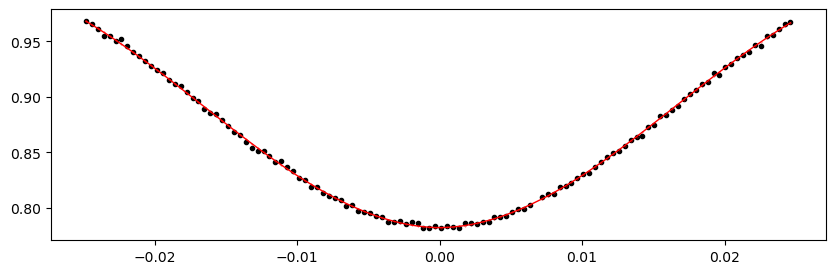

1951.3190875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.59it/s]


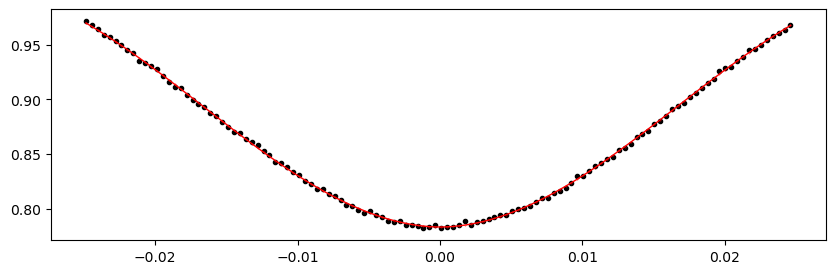

1954.6609125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.31it/s]


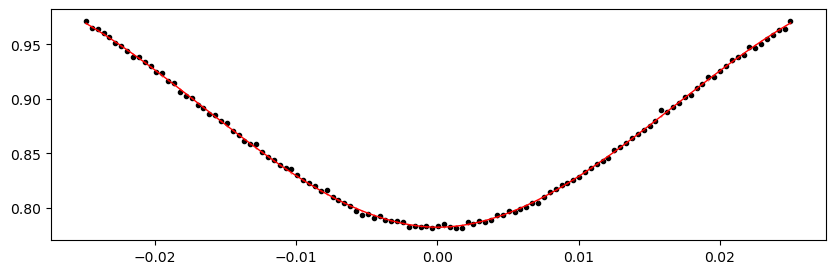

1961.3445625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.86it/s]


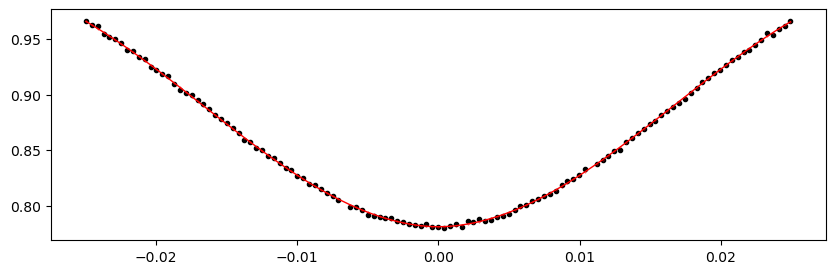

1964.6863875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.51it/s]


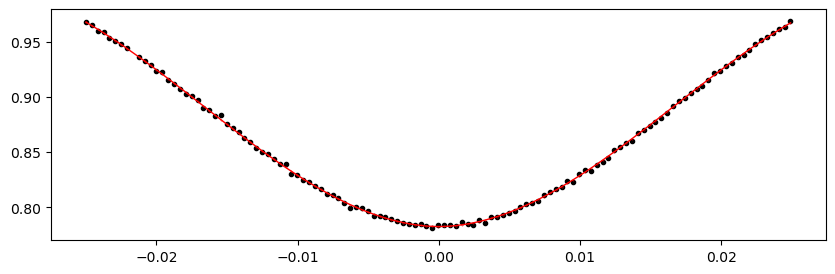

1968.0282124999999 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.58it/s]


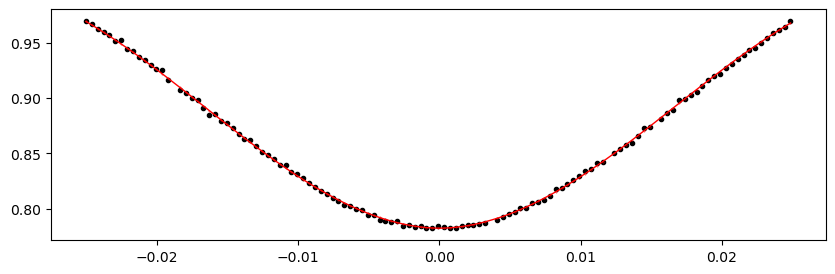

1974.7118625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.08it/s]


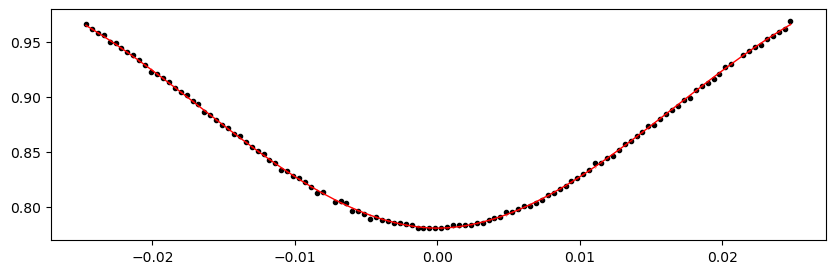

1978.0536875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.00it/s]


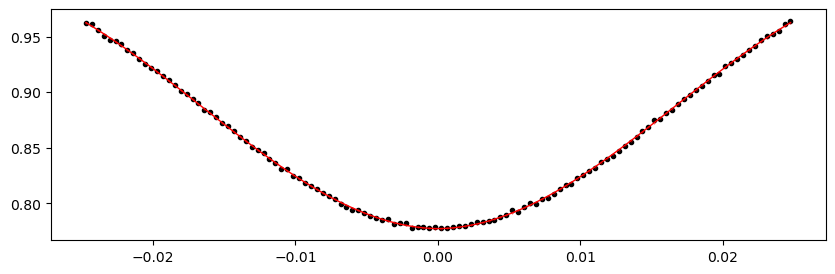

1981.3955125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.51it/s]


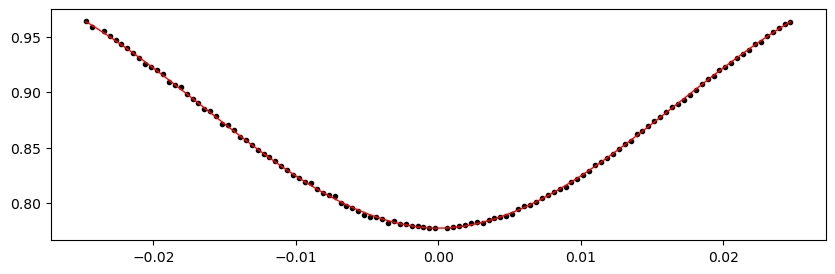

1988.0791625000002 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.50it/s]


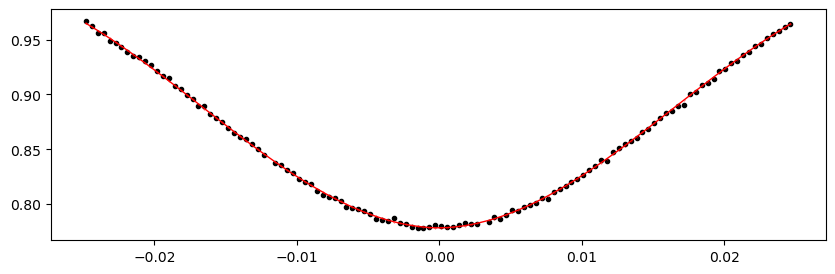

1991.4209875000001 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.54it/s]


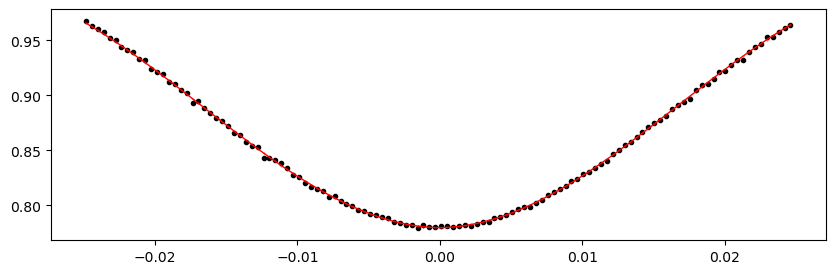

1994.7628125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.29it/s]


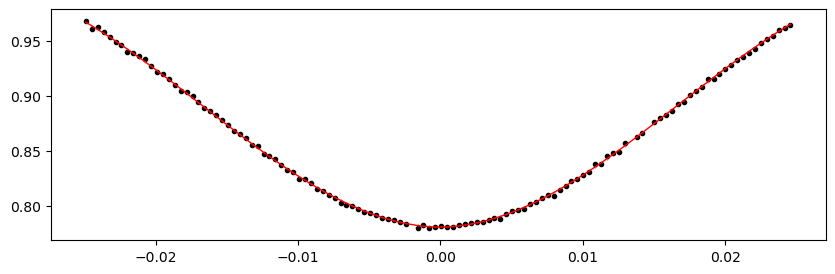

2001.4464625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.65it/s]


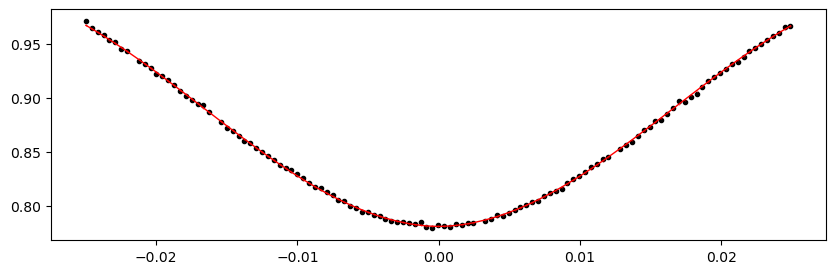

2004.7882875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.73it/s]


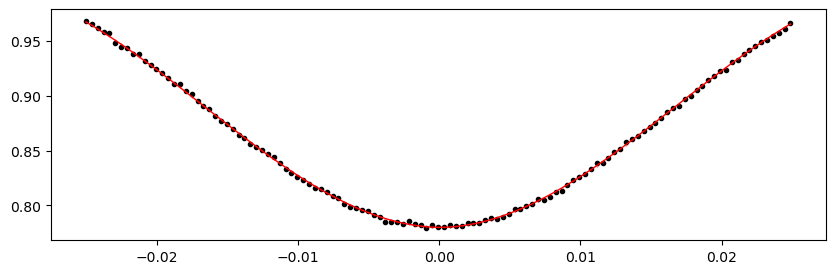

2008.1301125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.43it/s]


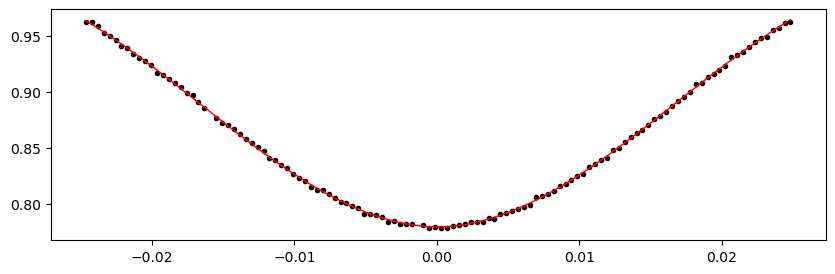

2011.4719375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.40it/s]


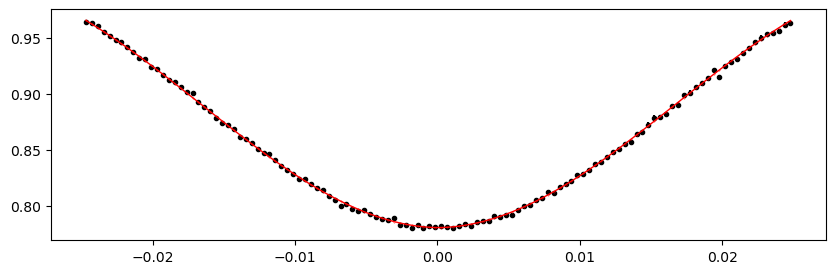

2014.8137625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.32it/s]


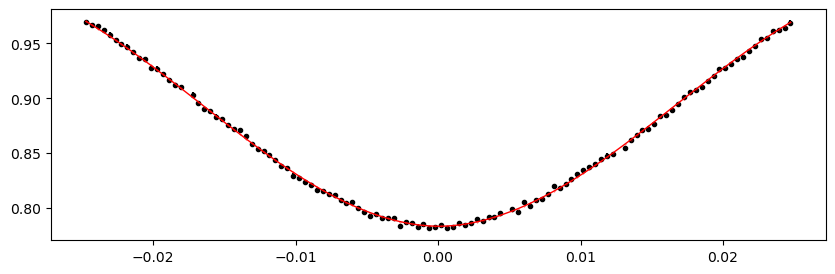

2018.1555875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.28it/s]


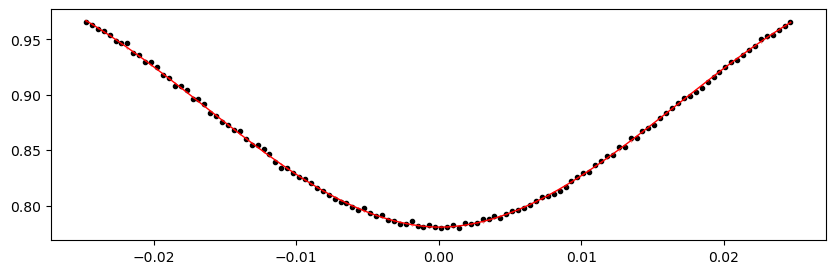

2021.4974124999999 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.57it/s]


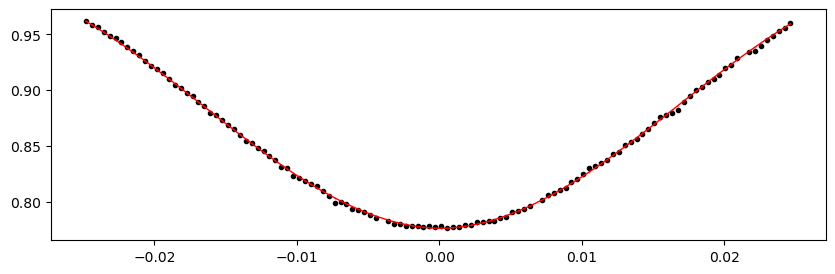

2024.8392375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.33it/s]


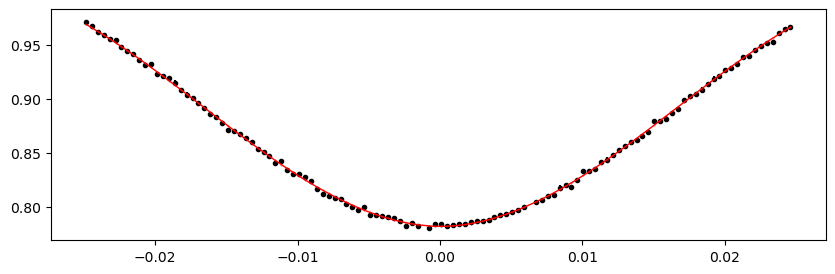

2028.1810625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.43it/s]


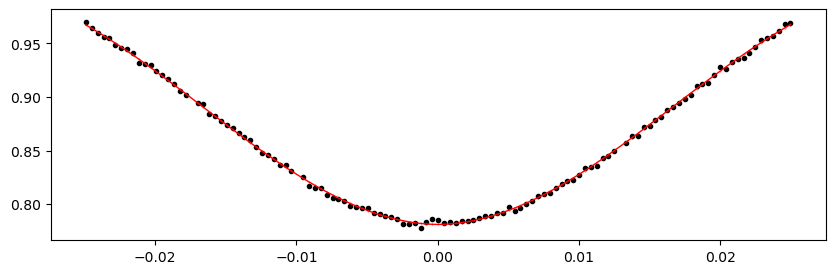

2031.5228875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.74it/s]


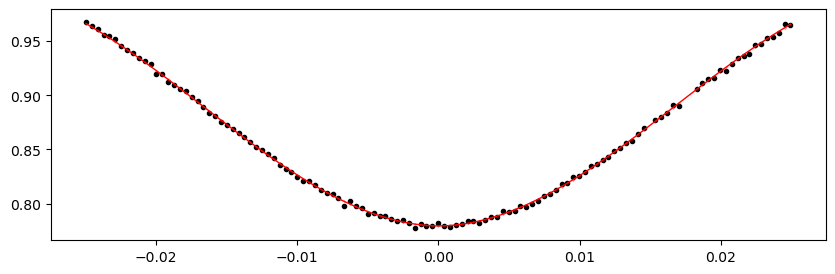

2034.8647125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.32it/s]


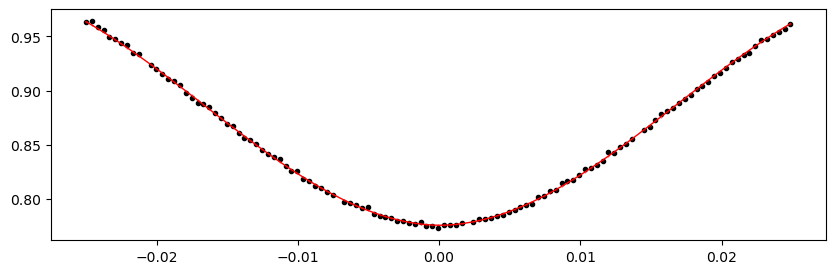

2392.4399875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.58it/s]


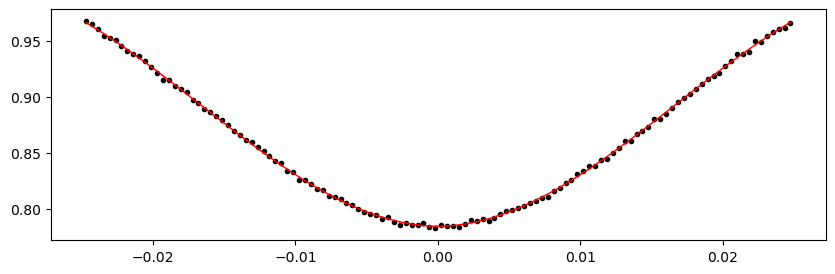

2395.7818125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.95it/s]


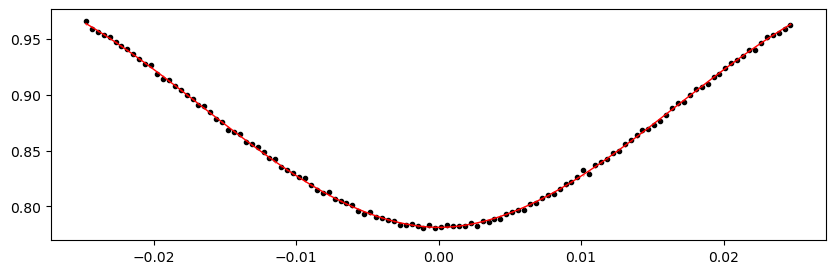

2399.1236375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.51it/s]


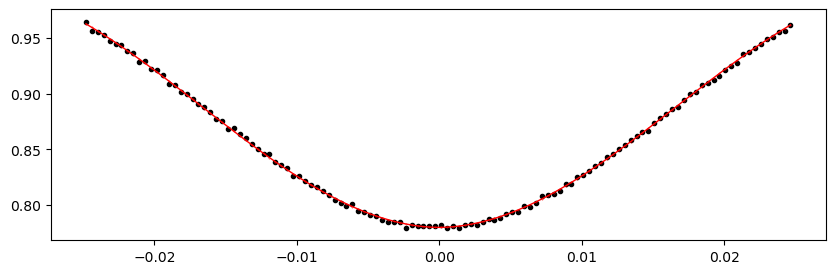

2402.4654625000003 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.73it/s]


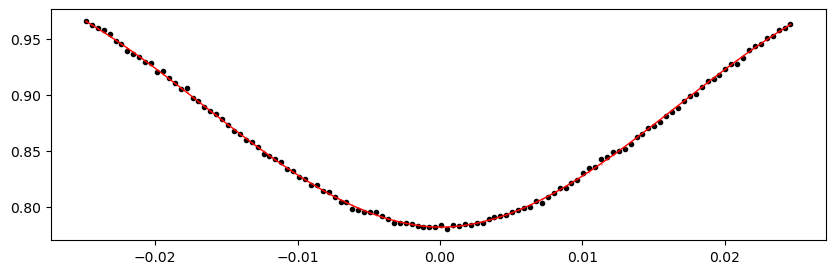

2405.8072875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.59it/s]


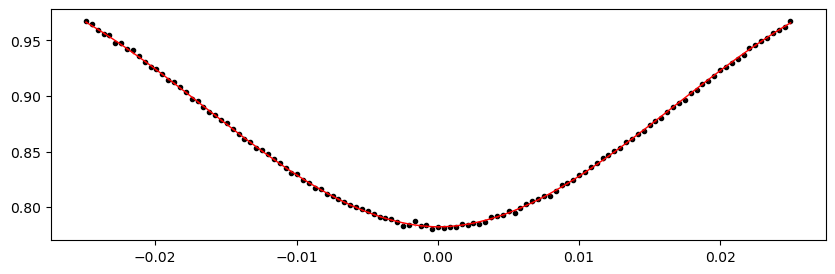

2409.1491125000002 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.36it/s]


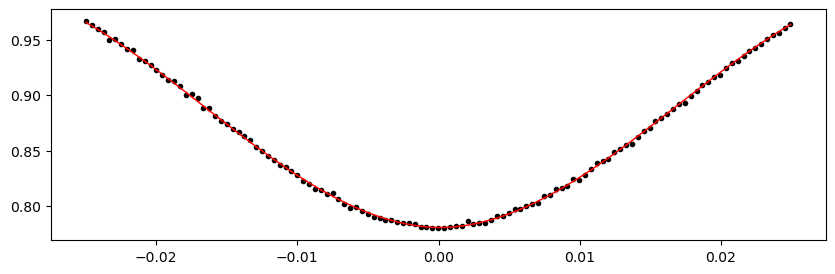

2412.4909374999997 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.31it/s]


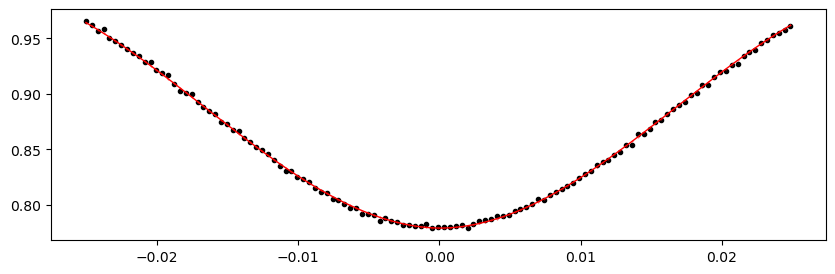

2415.8327625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.02it/s]


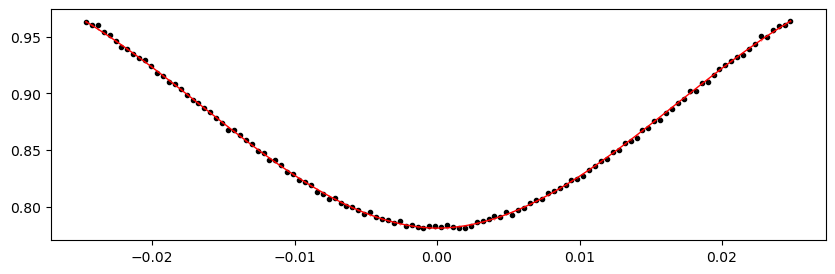

2422.5164125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.94it/s]


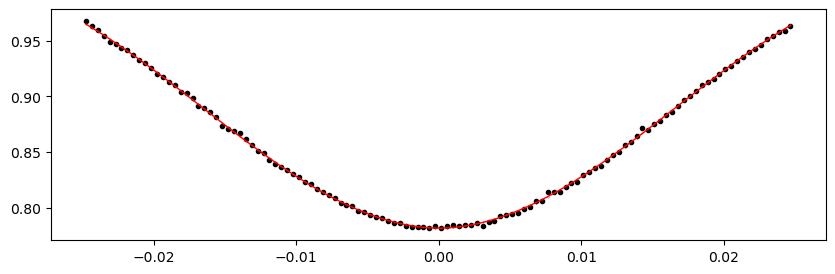

2425.8582375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.89it/s]


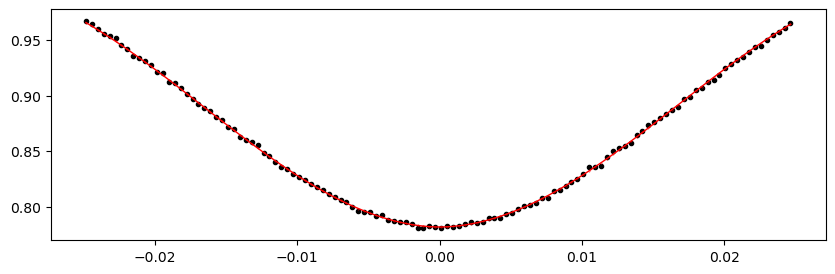

2429.2000625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.64it/s]


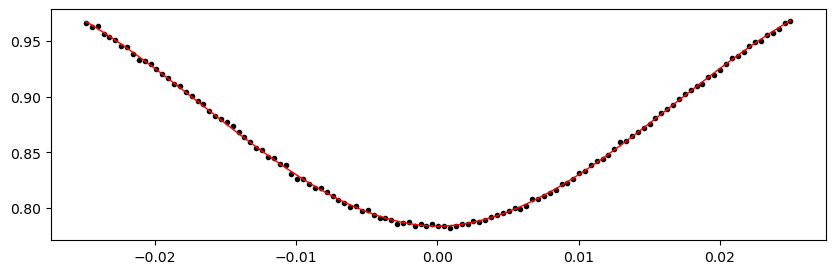

2432.5418875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.44it/s]


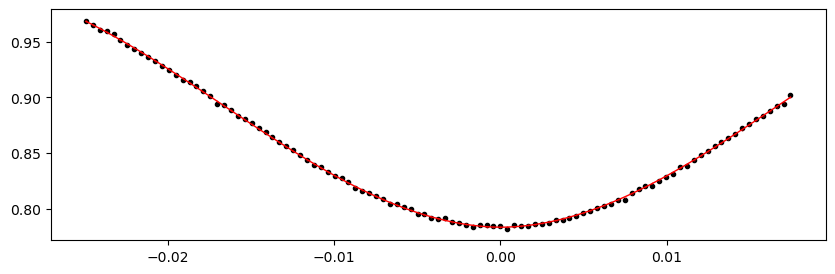

2435.8837125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.19it/s]


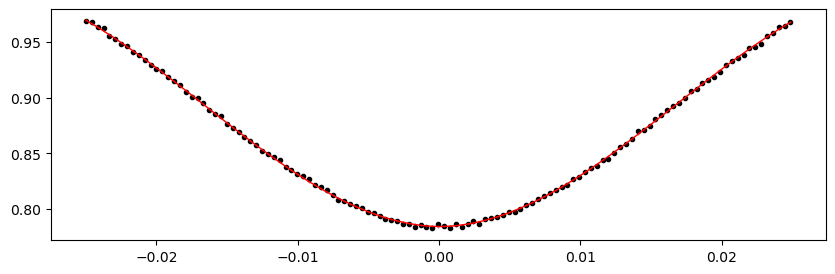

2439.2255375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.71it/s]


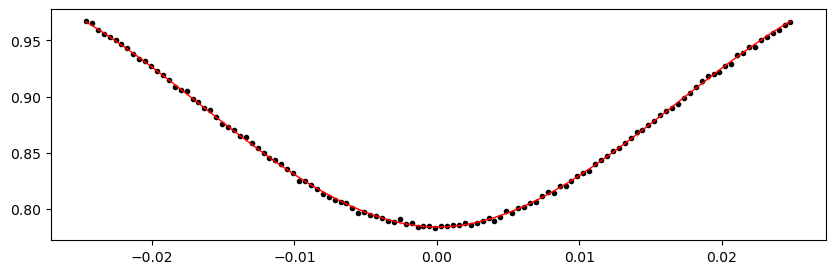

2442.5673625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.00it/s]


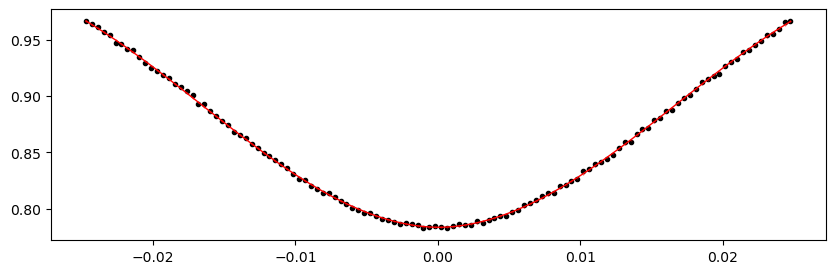

2445.9091875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.09it/s]


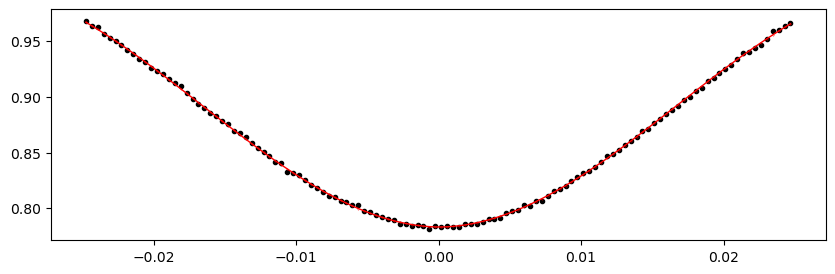

2582.9240125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.80it/s]


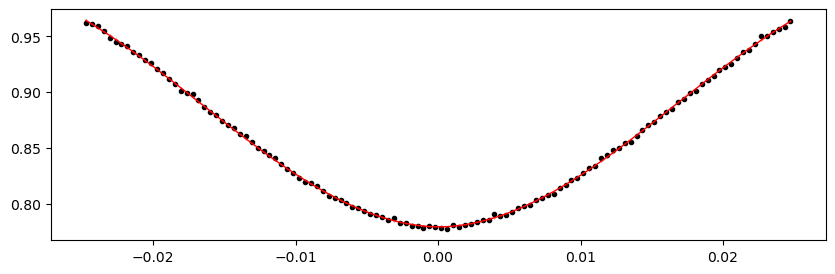

2586.2658375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.30it/s]


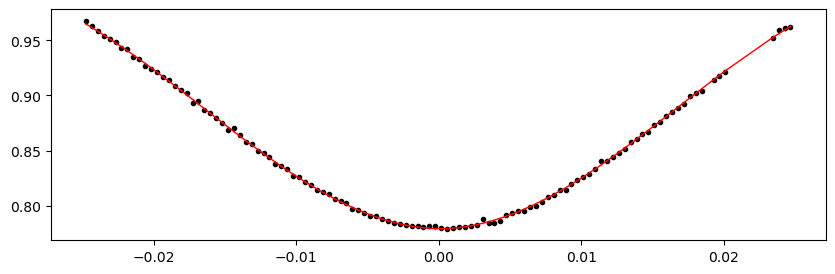

2589.6076625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.07it/s]


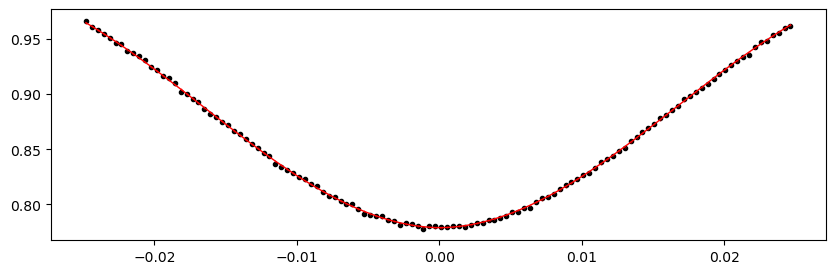

2592.9494875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.29it/s]


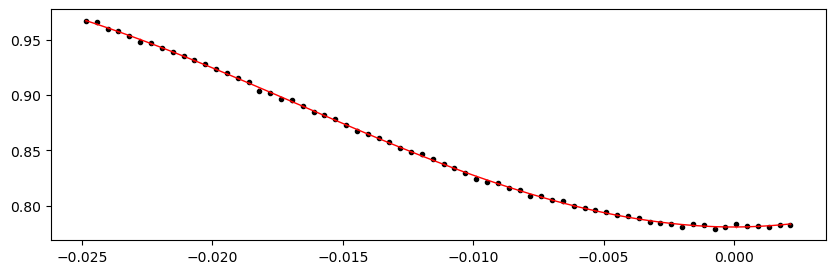

2596.2913125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.38it/s]


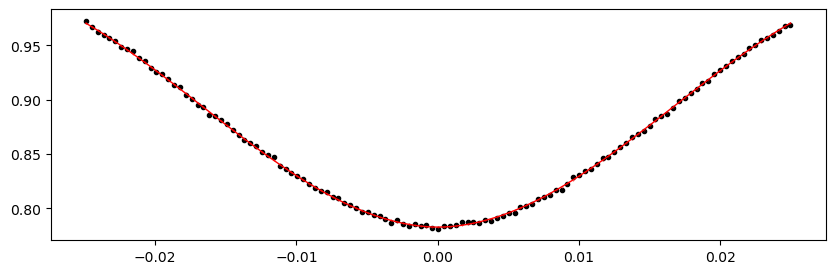

2599.6331375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.00it/s]


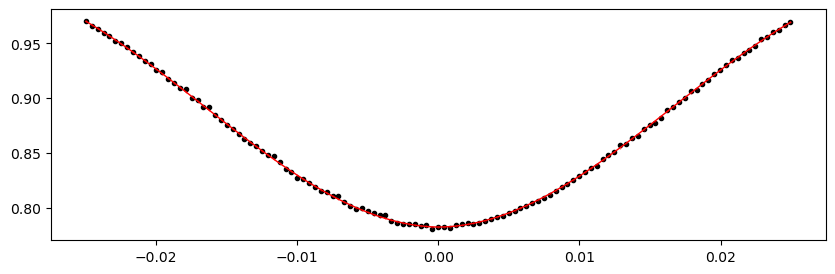

2602.9749625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.96it/s]


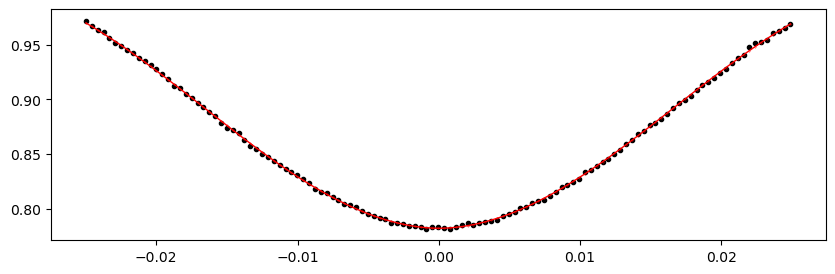

2606.3167875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.01it/s]


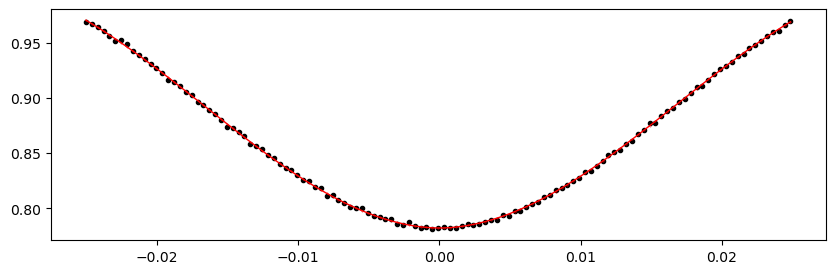

2613.0004375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.07it/s]


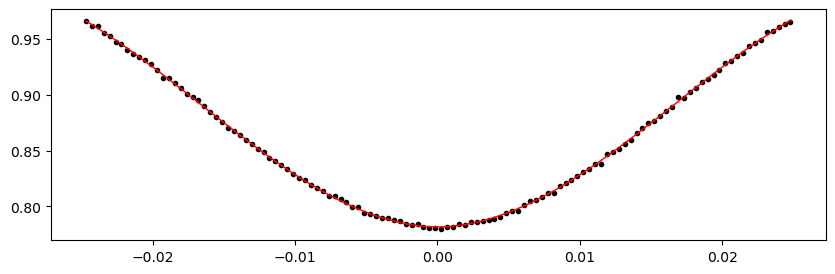

2616.3422625000003 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.07it/s]


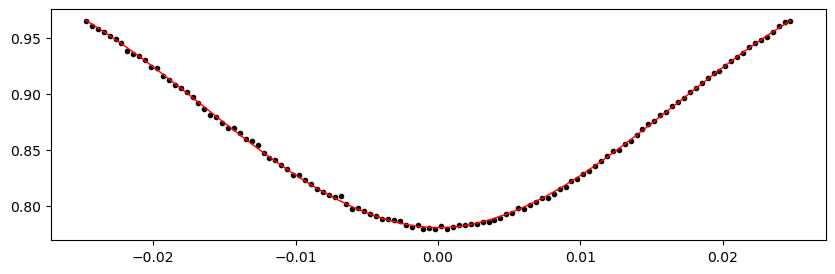

2619.6840875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.05it/s]


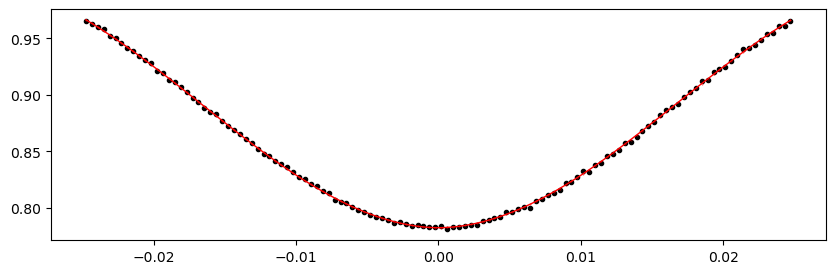

2626.3677374999997 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.51it/s]


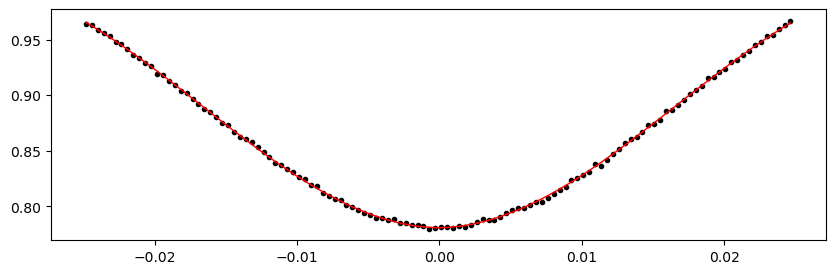

2629.7095625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.69it/s]


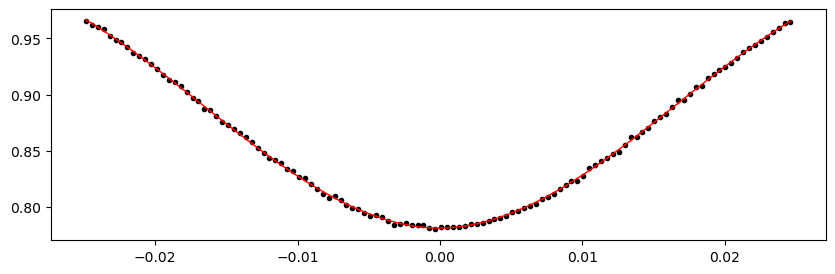

2633.0513875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.13it/s]


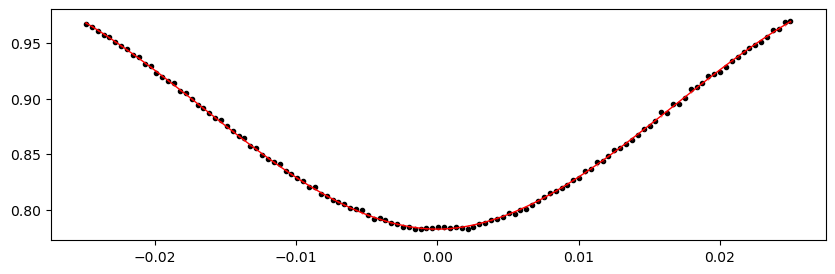

2643.0768625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.96it/s]


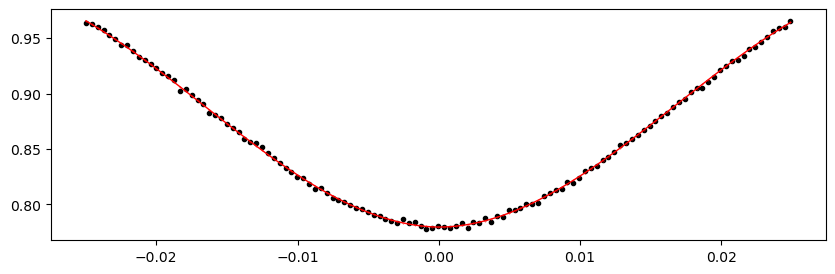

2646.4186875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.15it/s]


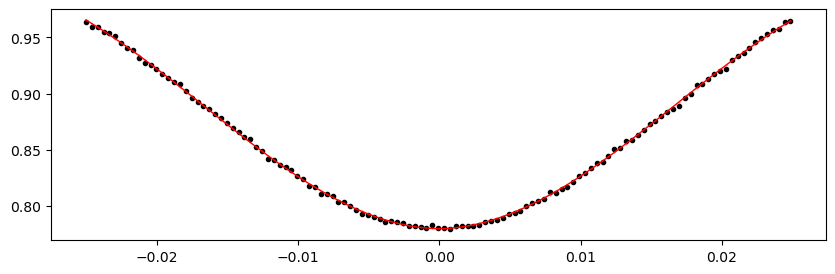

2649.7605125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.48it/s]


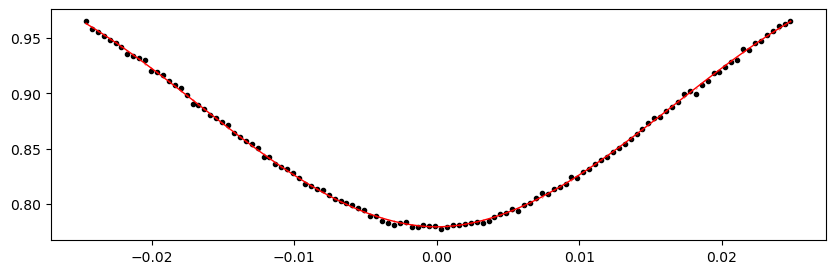

2656.4441625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.14it/s]


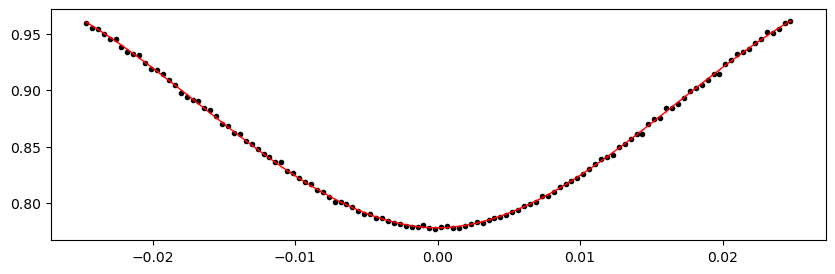

2659.7859875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.50it/s]


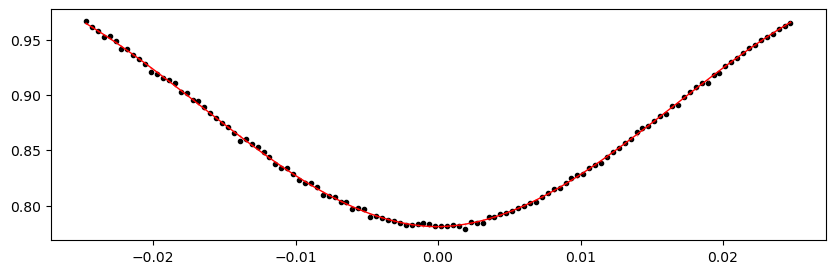

2663.1278125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.49it/s]


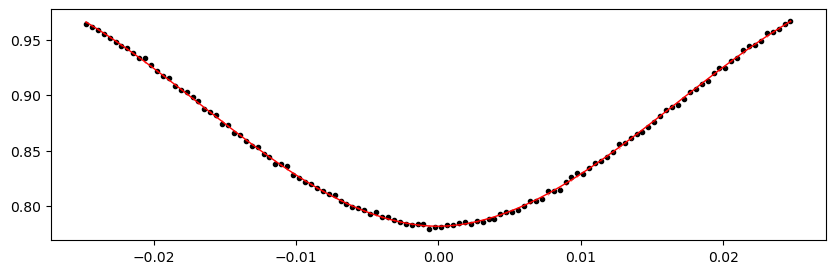

2669.8114625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.94it/s]


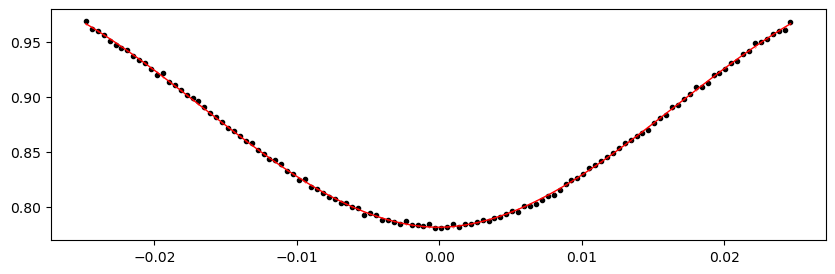

2673.1532875000003 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.88it/s]


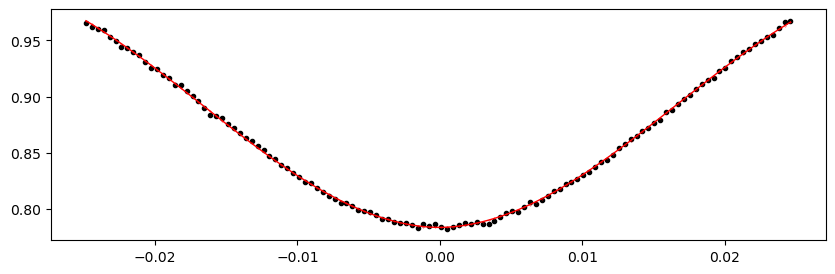

2676.4951125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.80it/s]


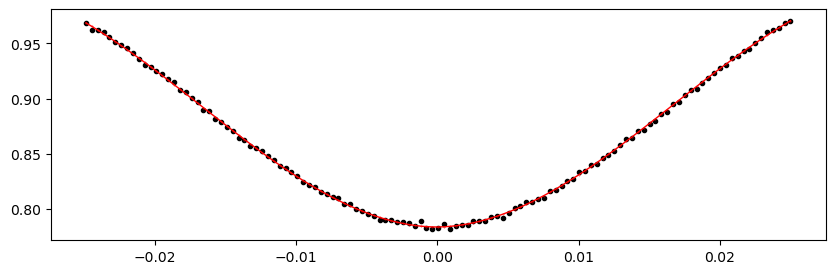

2683.1787625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.09it/s]


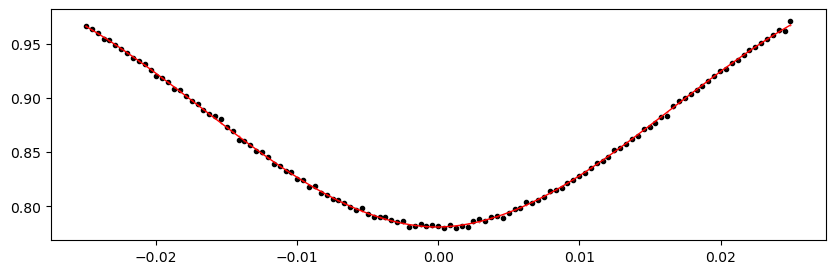

2686.5205875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.57it/s]


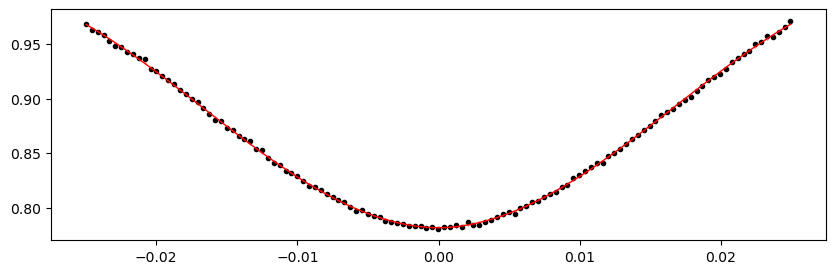

2689.8624125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.52it/s]


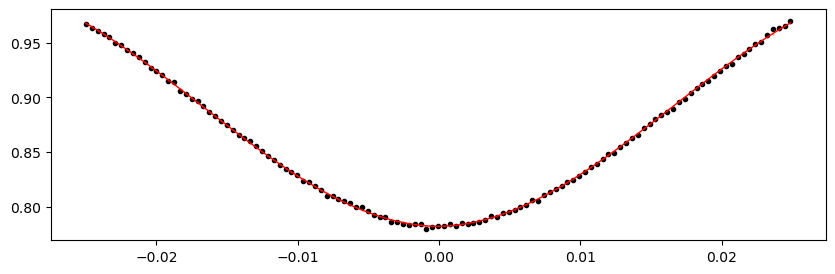

2696.5460625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.94it/s]


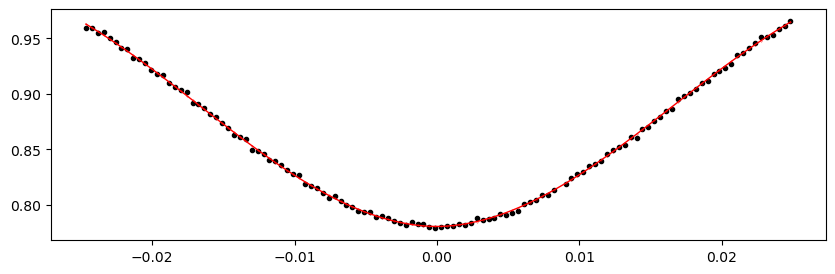

2699.8878875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.93it/s]


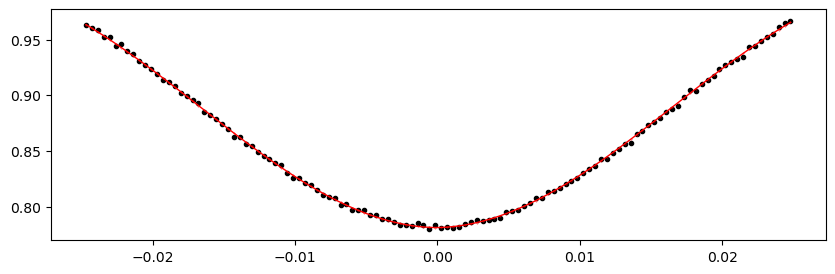

2703.2297125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.79it/s]


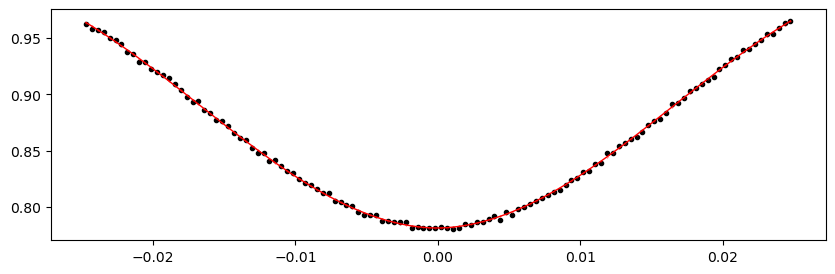

2709.9133625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.13it/s]


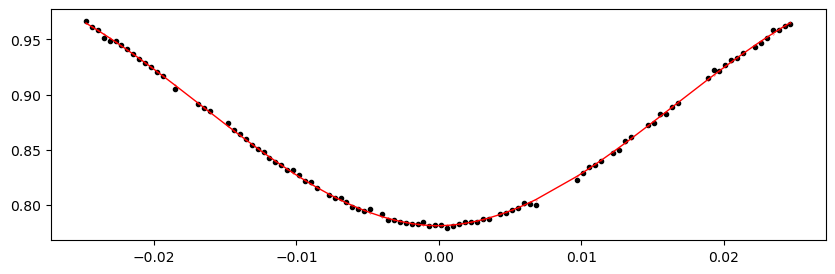

2713.2551875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.80it/s]


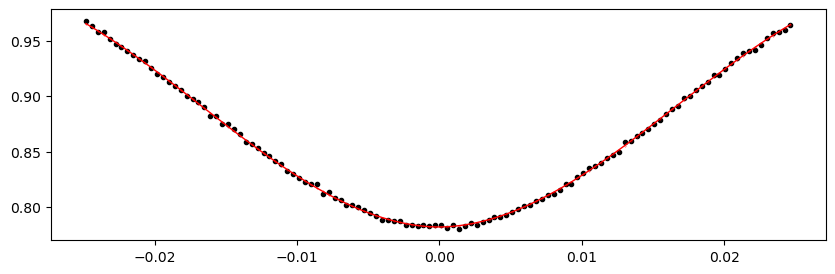

2716.5970125000003 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.02it/s]


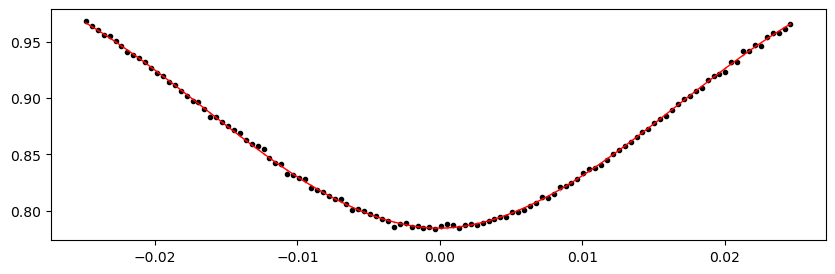

2723.2806625000003 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 430.12it/s]


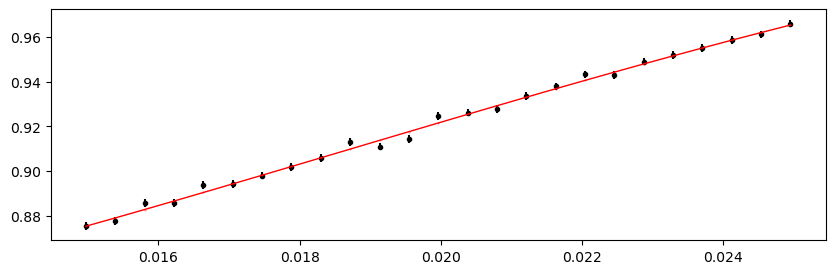

2726.6224875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.42it/s]


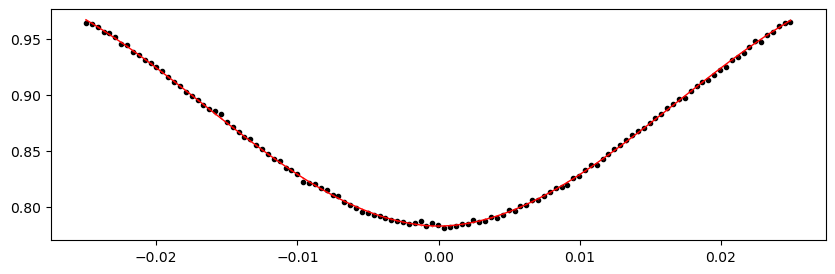

2729.9643125000002 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.38it/s]


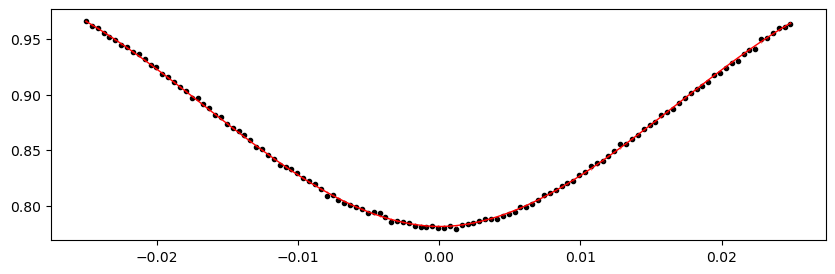

2736.6479625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.85it/s]


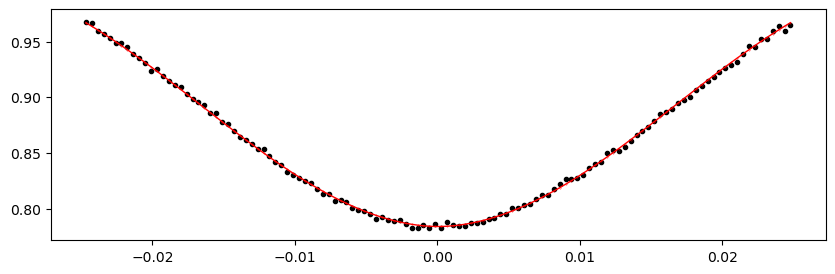

2739.9897875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.97it/s]


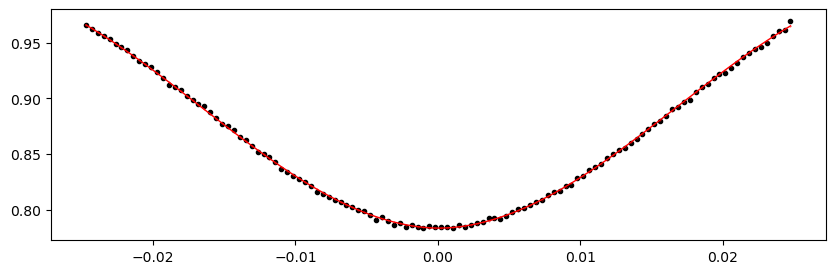

2770.0662125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.57it/s]


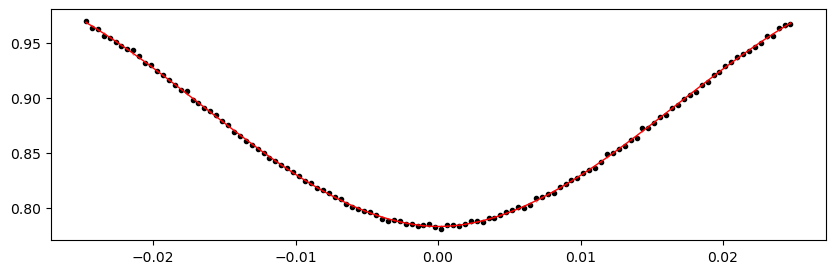

2773.4080375000003 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.43it/s]


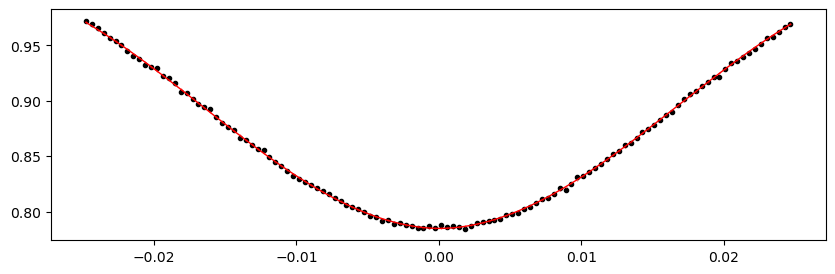

2776.7498625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.78it/s]


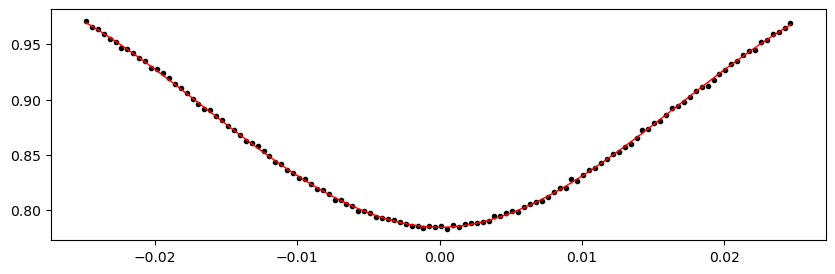

2786.7753375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.64it/s]


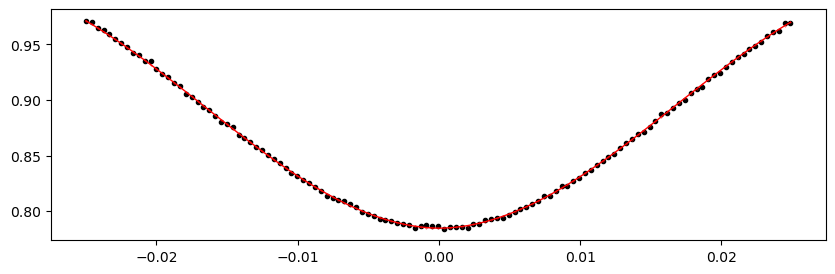

2790.1171624999997 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.34it/s]


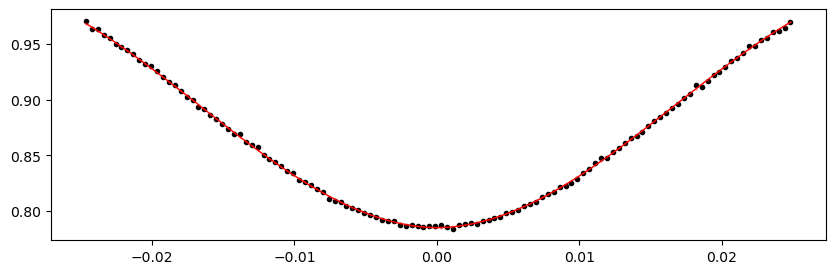

2793.4589875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.29it/s]


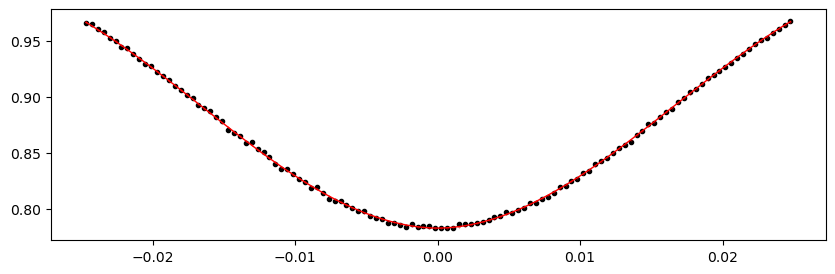

2800.1426375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.94it/s]


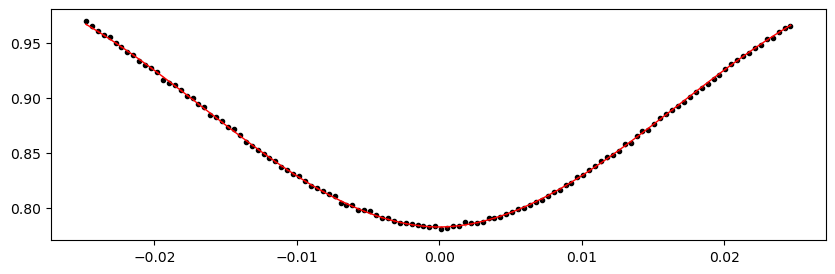

2803.4844625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.59it/s]


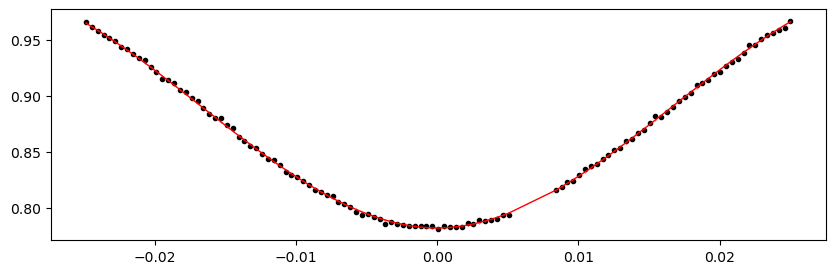

2806.8262875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.09it/s]


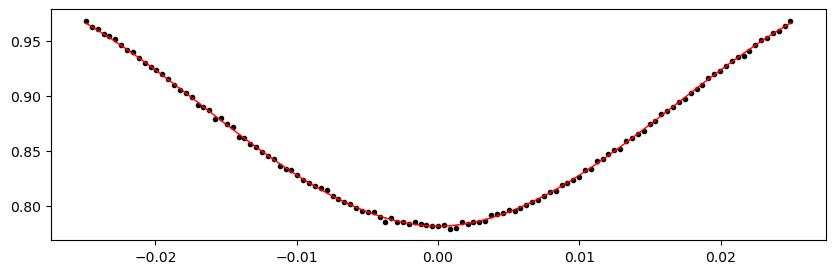

2813.5099375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.16it/s]


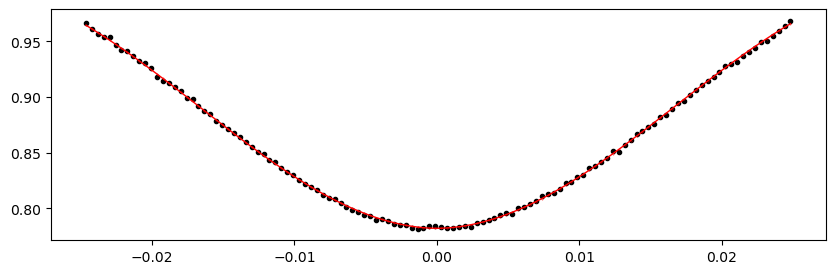

2816.8517625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.55it/s]


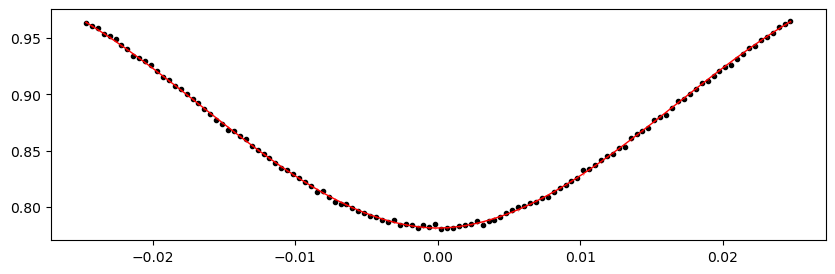

2820.1935875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.87it/s]


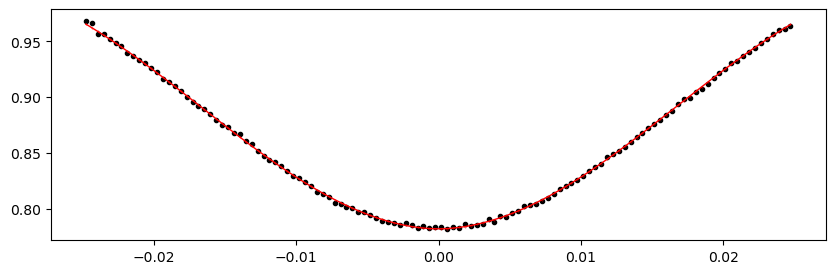

2823.5354125000003 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.96it/s]


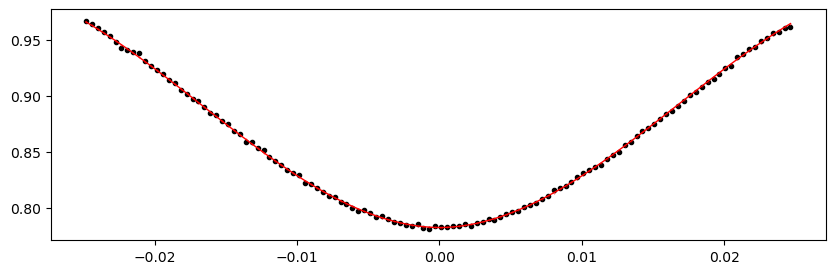

2826.8772375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.11it/s]


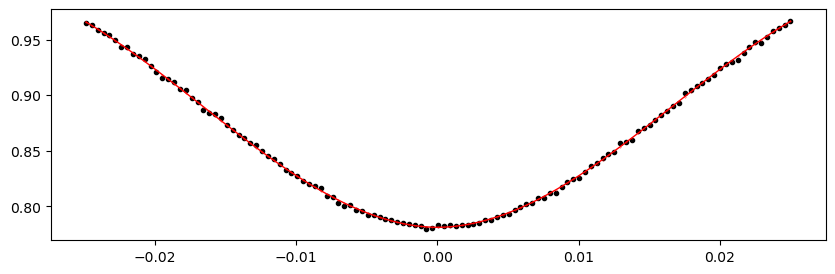

2830.2190625000003 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.46it/s]


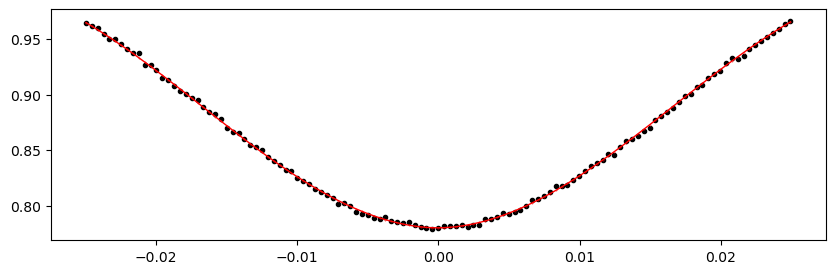

2833.5608875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.72it/s]


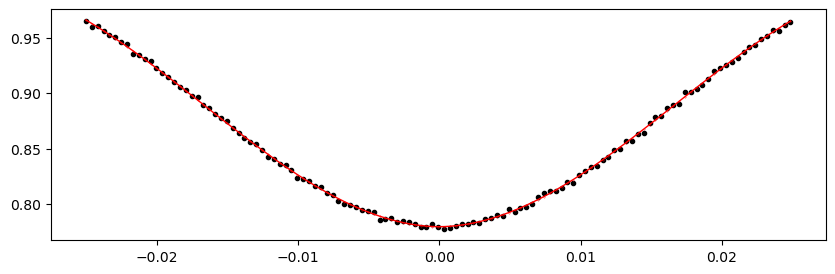

2840.2445374999998 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.02it/s]


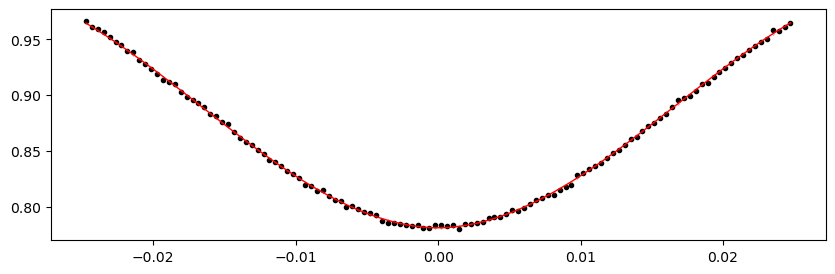

2843.5863625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.84it/s]


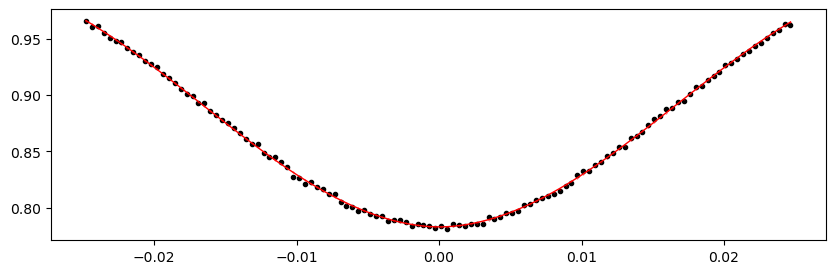

2846.9281875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.07it/s]


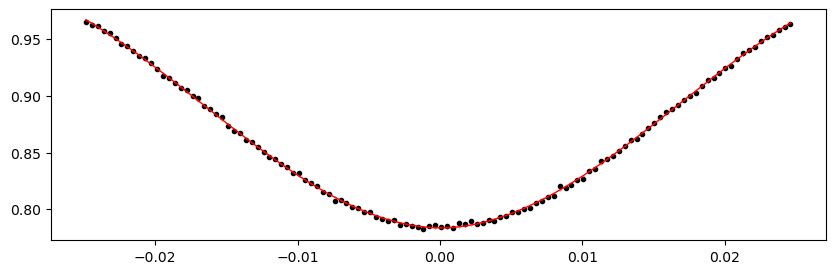

2850.2700125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.95it/s]


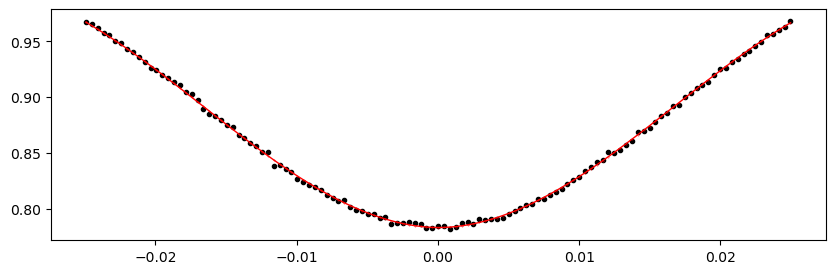

2853.6118375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.23it/s]


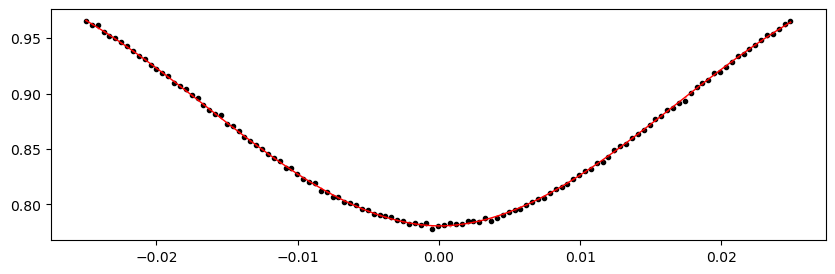

2856.9536625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.58it/s]


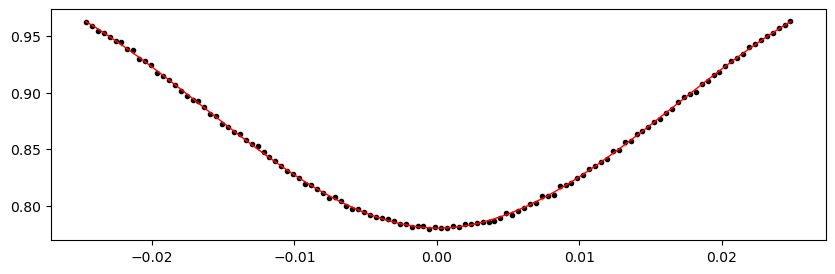

2860.2954875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.36it/s]


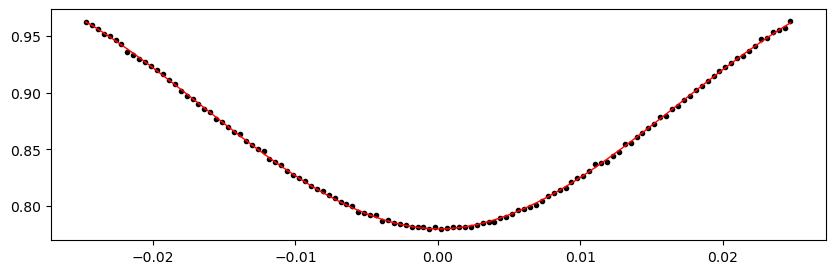

2866.9791375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.76it/s]


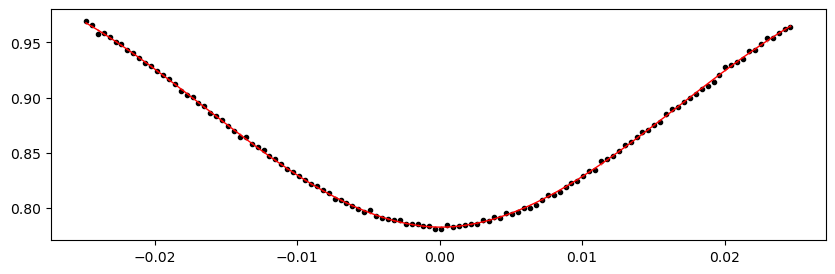

2870.3209625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.64it/s]


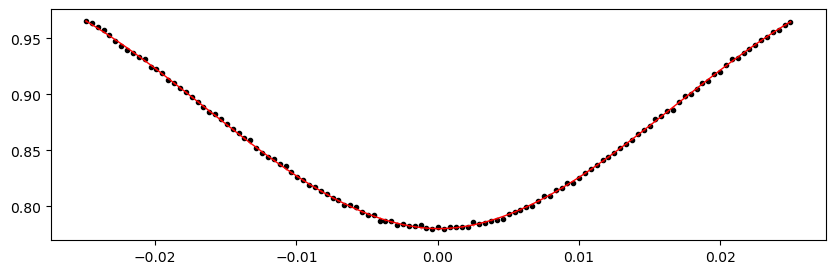

2873.6627875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.19it/s]


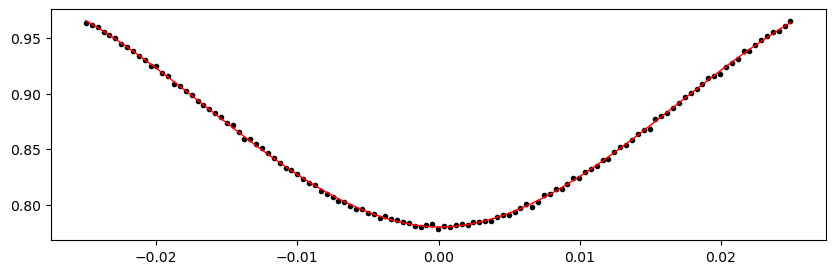

2877.0046125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.22it/s]


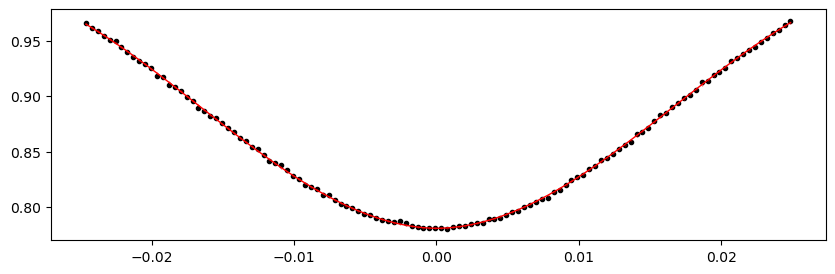

2880.3464375000003 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.59it/s]


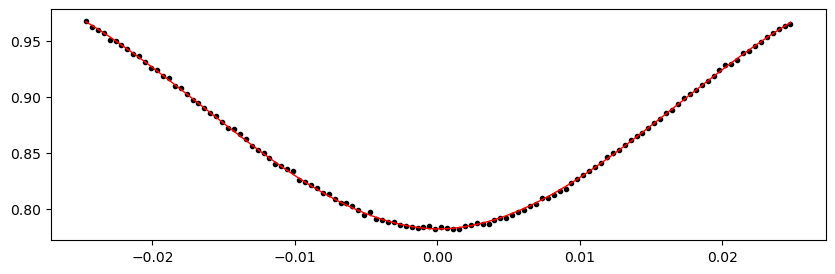

Time 2883.6882625 does not have enough data points: 6
2887.0300875000003 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.46it/s]


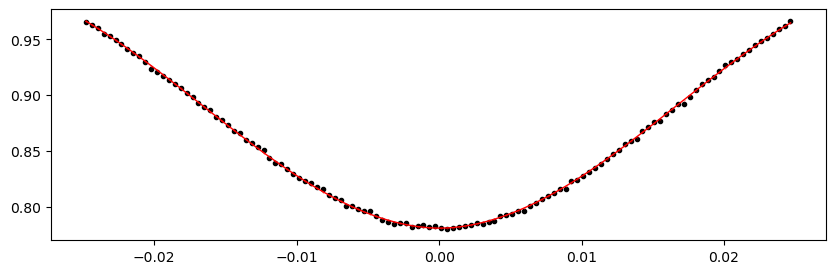

2890.3719125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.25it/s]


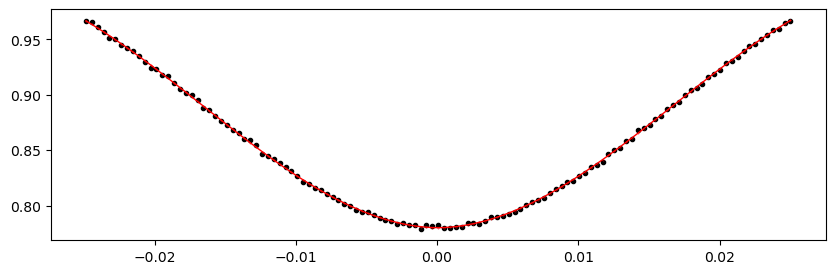

2893.7137375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.52it/s]


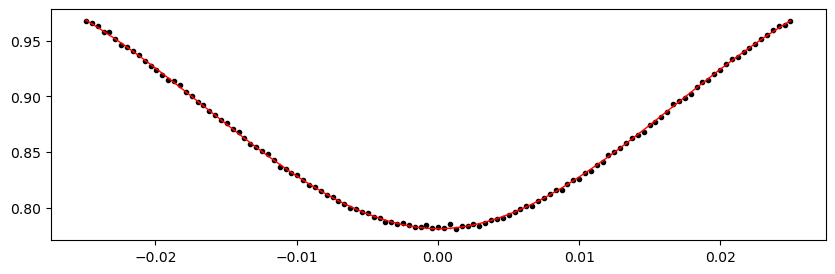

2900.3973875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.93it/s]


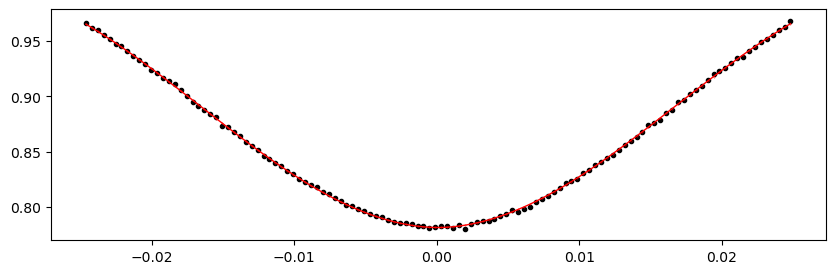

2903.7392125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.90it/s]


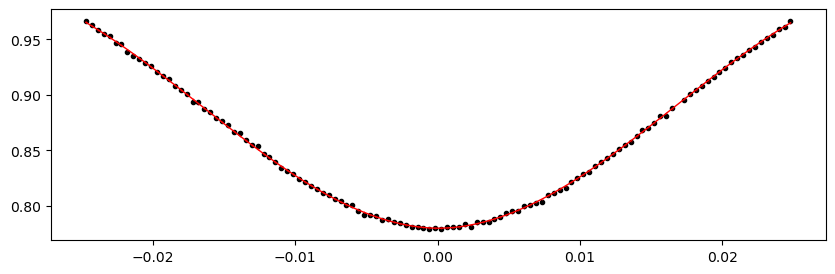

2907.0810375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.38it/s]


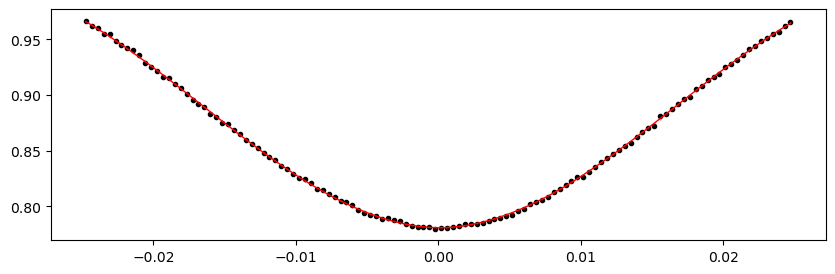

2913.7646875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.08it/s]


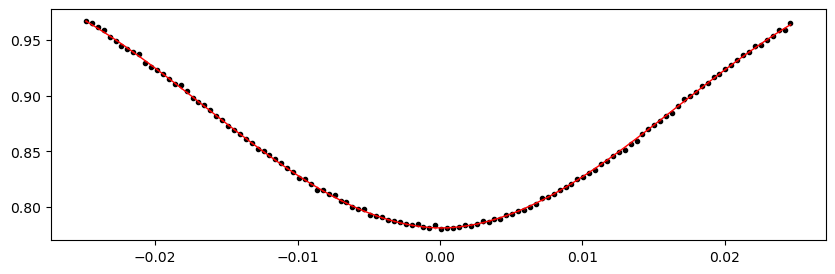

2917.1065125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.95it/s]


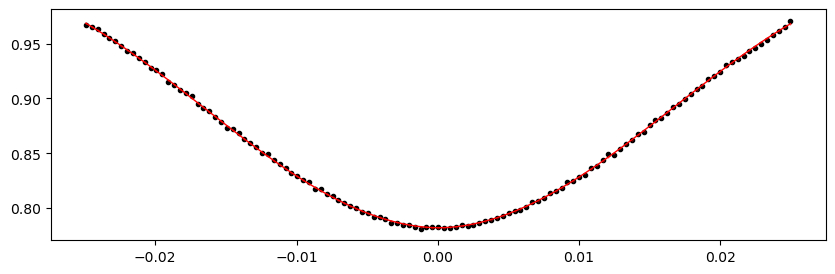

2920.4483375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.02it/s]


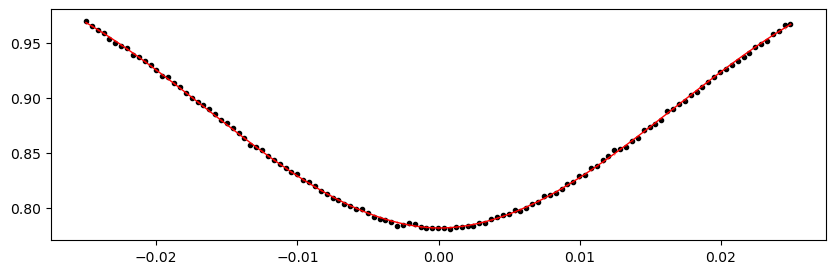

2927.1319875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.67it/s]


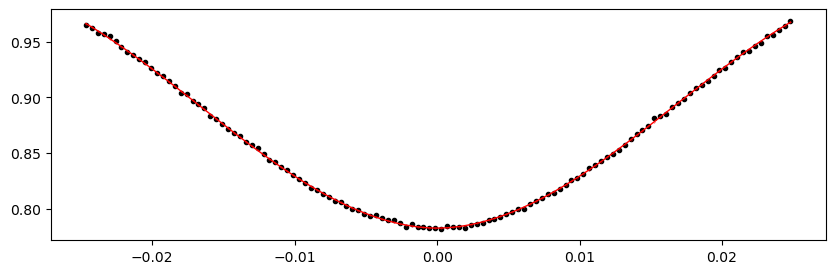

2930.4738125000003 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.73it/s]


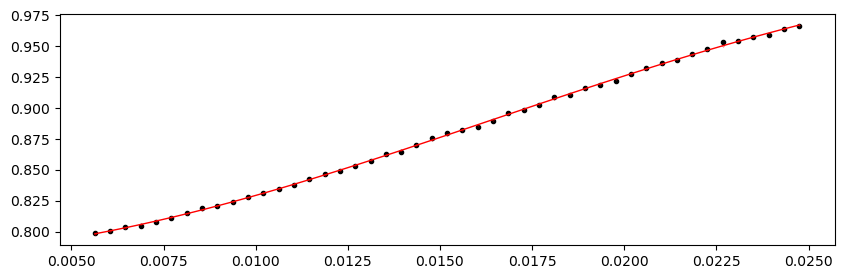

2933.8156375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.24it/s]


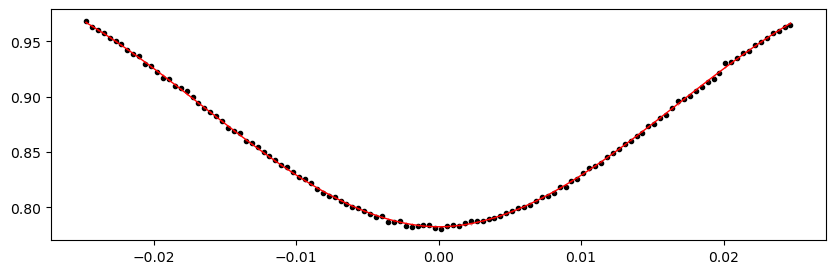

2940.4992875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.36it/s]


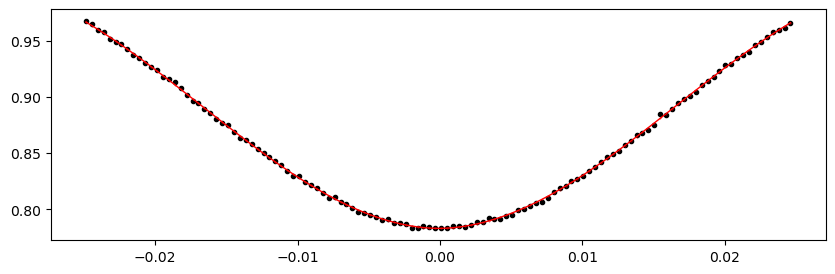

Time 2943.8411125000002 does not have enough data points: 5
2947.1829374999998 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.90it/s]


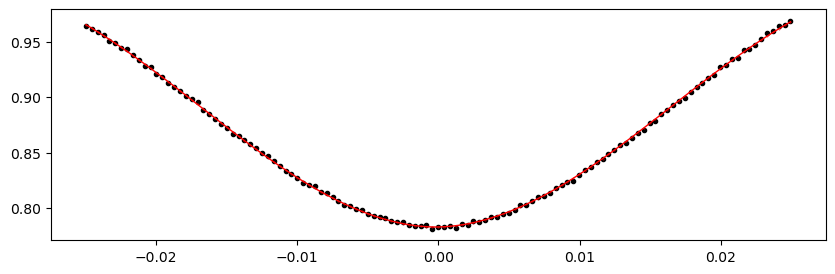

2957.2084125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.35it/s]


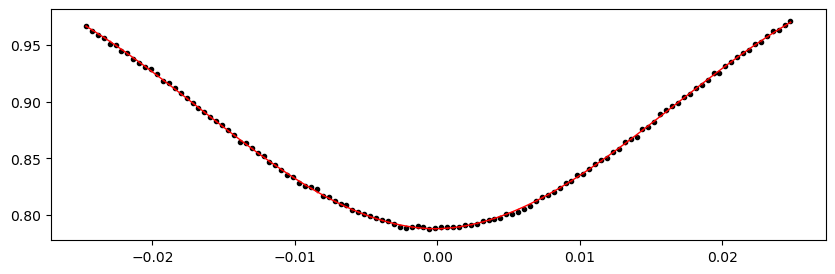

2960.5502375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.87it/s]


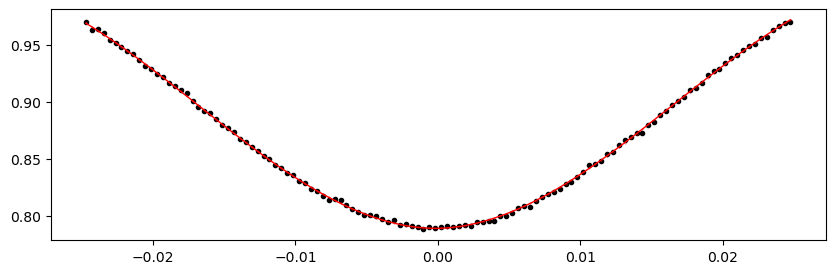

3291.3909125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.87it/s]


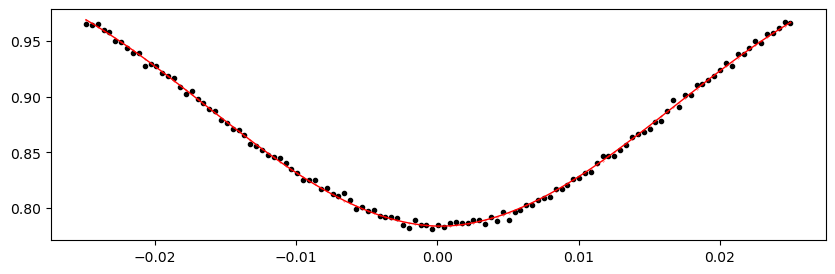

3294.7327375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.41it/s]


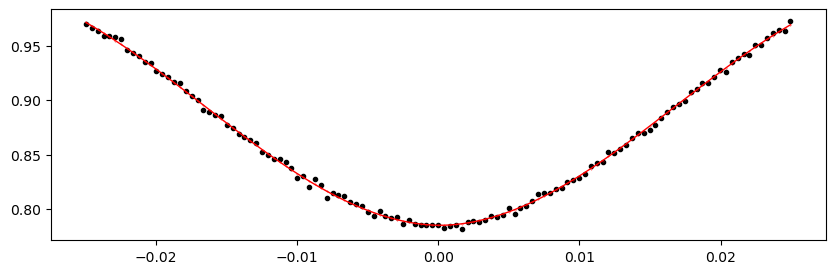

3298.0745625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.90it/s]


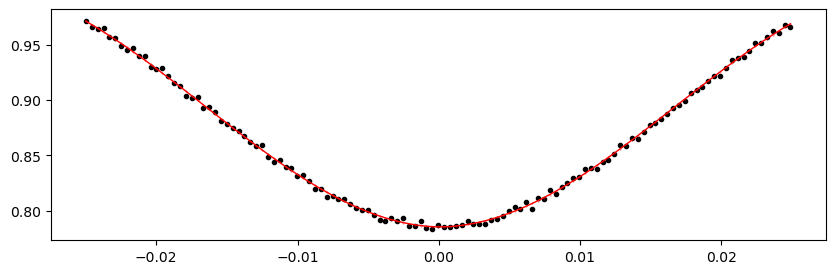

3308.1000375000003 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.22it/s]


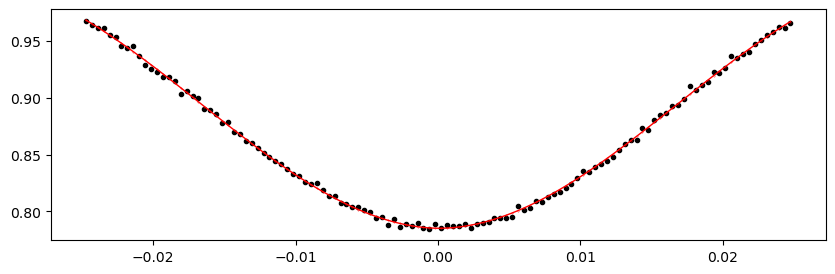

3311.4418625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.22it/s]


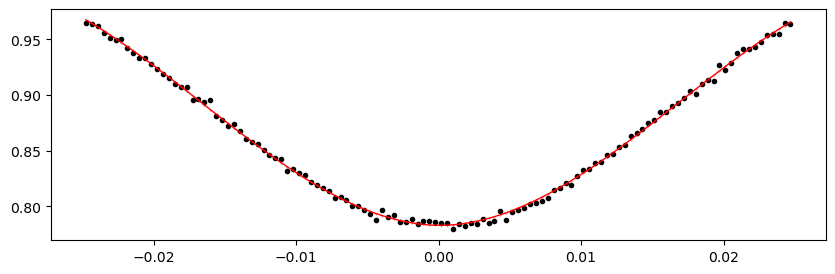

3318.1255125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.37it/s]


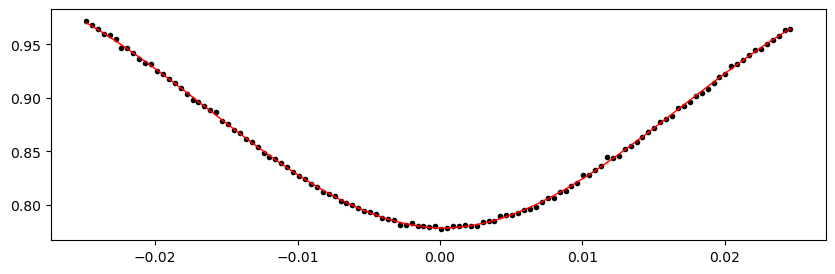

3321.4673375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.61it/s]


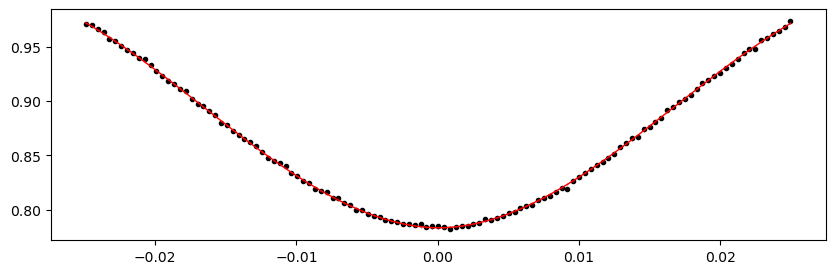

3324.8091624999997 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.34it/s]


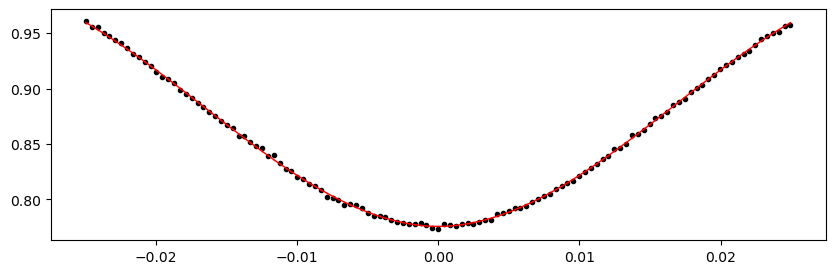

3331.4928125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.17it/s]


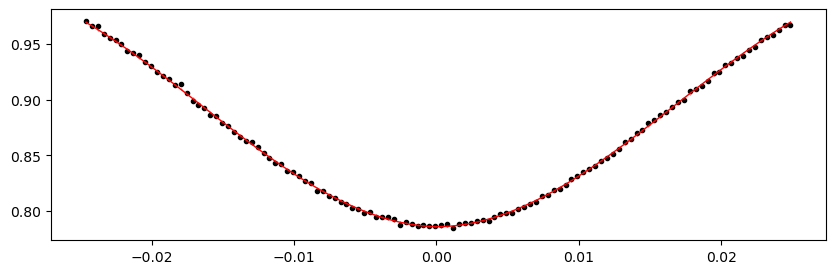

3334.8346375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.43it/s]


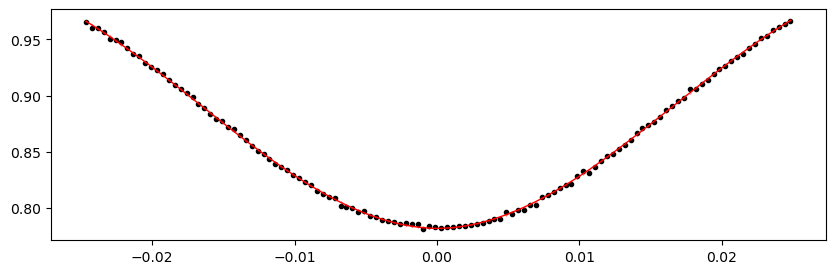

3338.1764625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.09it/s]


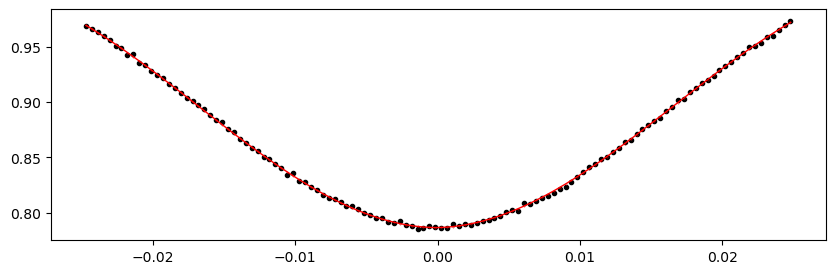

3344.8601125 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.24it/s]


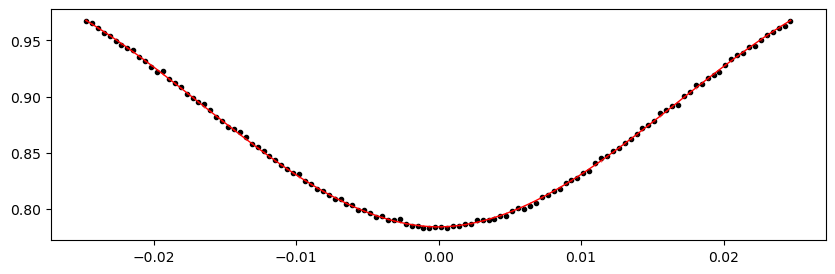

3348.2019375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.27it/s]


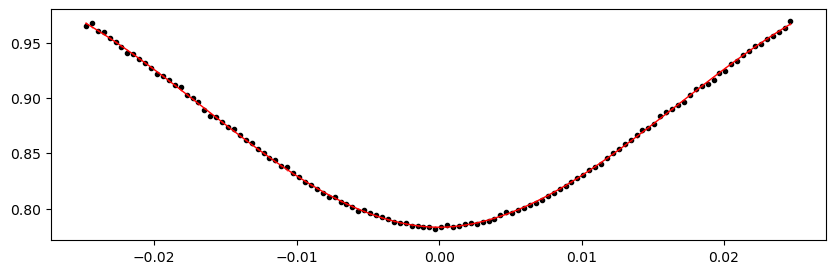

3351.5437625 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.91it/s]


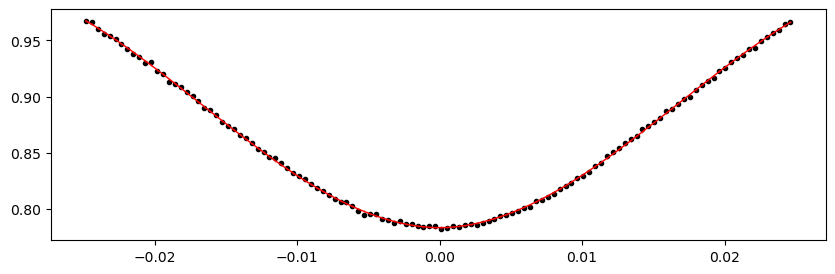

3354.8855875 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.37it/s]


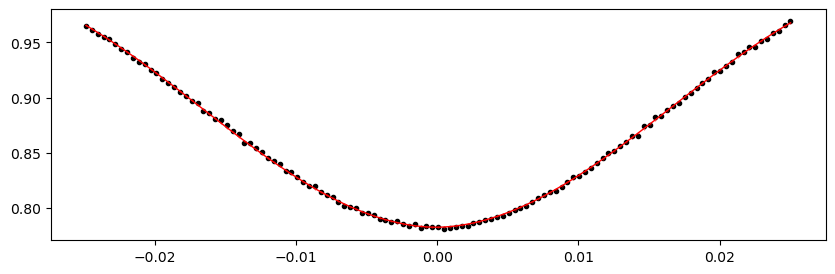

3358.2274125000004 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.07it/s]


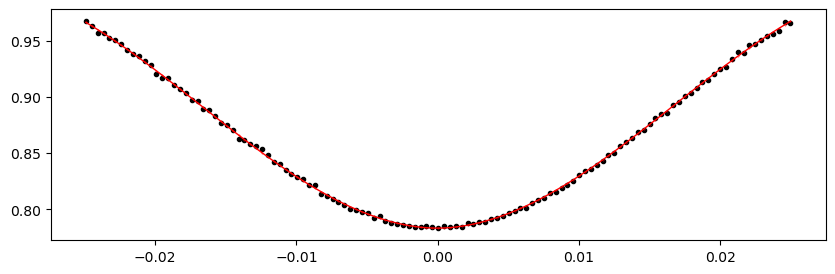

3361.5692375 1.021728301416876 -0.24011235656991858 -0.27499023467672057


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.03it/s]


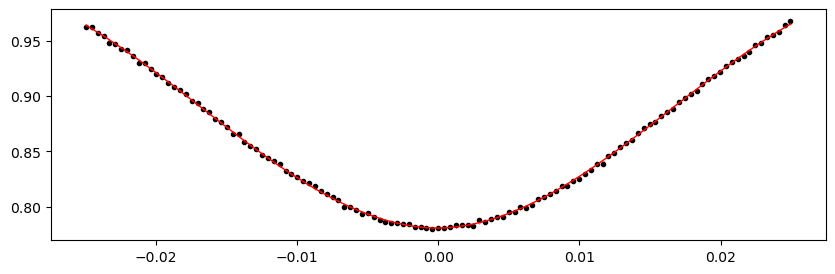

In [26]:
#---
%matplotlib inline

print("Fitting individual secondary eclipses...")
etv_functions.fit_each_eclipse(data_secondary, n_transits, t0_secondary, period, mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, outfile_path_s)
!$NOTIFY_CMD "Individual secondary eclipses fit done"

Note: 4 data points in df_primary filtered out due to huge O-C error.
Note: 1 data points in in_df_secondary filtered out due to huge O-C error.


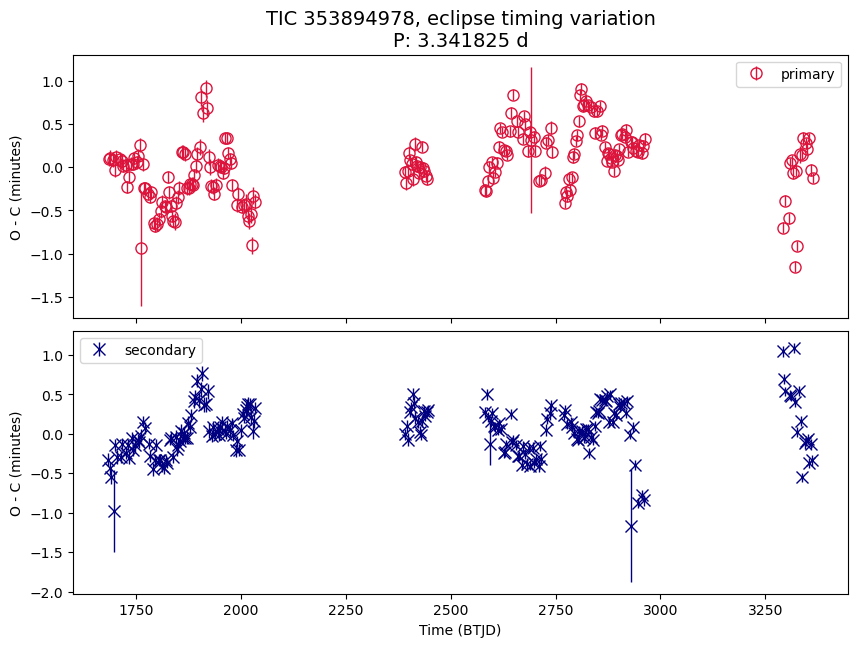

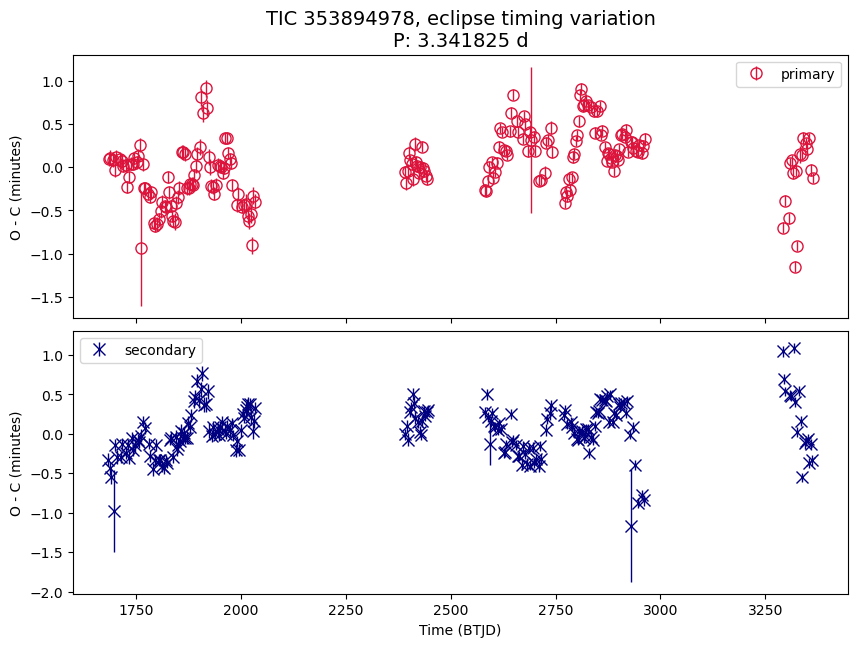

In [66]:
%matplotlib inline
# %matplotlib widget


title_suffix = "eclipse timing variation"

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary_all = in_df_primary  # in case filtering is helpful

in_df_primary = in_df_primary[in_df_primary.std_mins < 2]  # filter out outliers in error
print(f"Note: {len(in_df_primary_all) - len(in_df_primary)} data points in df_primary filtered out due to huge O-C error.")

# axs[0].plot(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              lw = 1, color = 'crimson', )
# axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

# if False:
if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    in_df_secondary_all = in_df_secondary  # in case filtering is helpful

    in_df_secondary = in_df_secondary[in_df_secondary.std_mins < 2]  # filter out outliers in error
    print(f"Note: {len(in_df_secondary_all) - len(in_df_secondary)} data points in in_df_secondary filtered out due to huge O-C error.")

    # axs[1].plot(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              lw = 1, color = 'navy', )
    # axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
    axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'],
                 lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );
else:
    in_df_secondary = None

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"TIC {ticid}, {title_suffix}\nP: {period} d", fontsize=14)

plt.subplots_adjust(hspace=0.05)
# plt.ylim(-3, 8)
plt.show()

### Compare with O-C plot using longer clipped lightcurve including ingress/egress

No significant difference.

Based on clipped LC of 1.2X eclipse duration, period=3.341826:

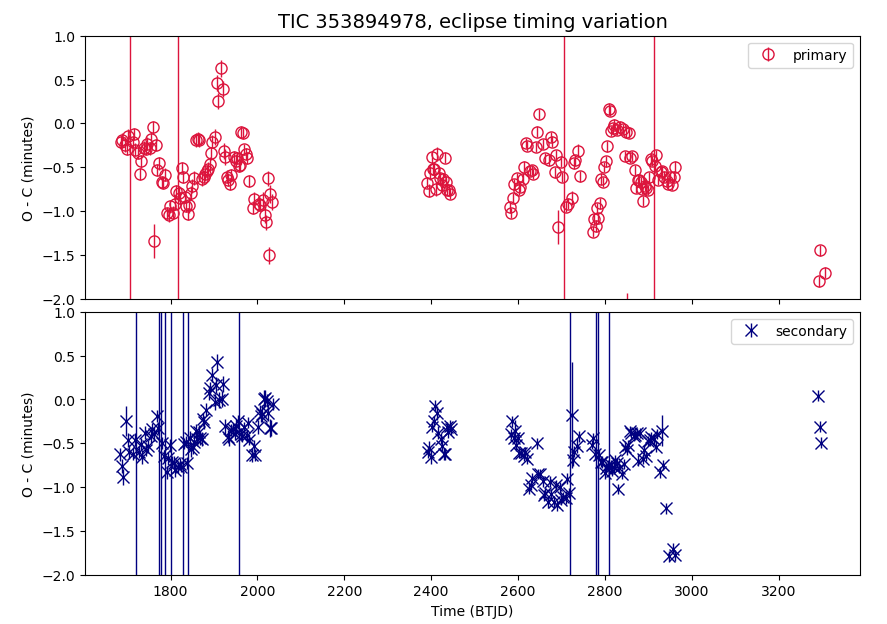

## make a periodogram 

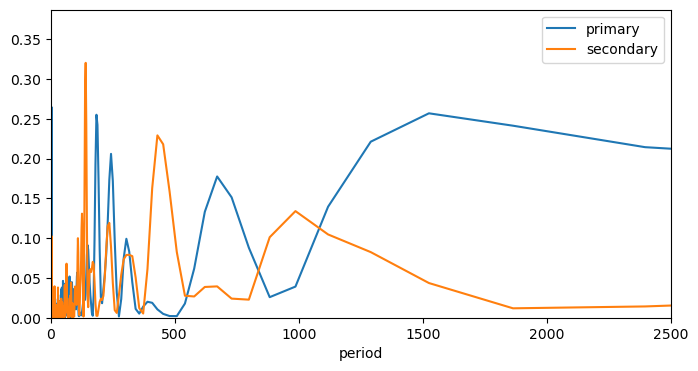

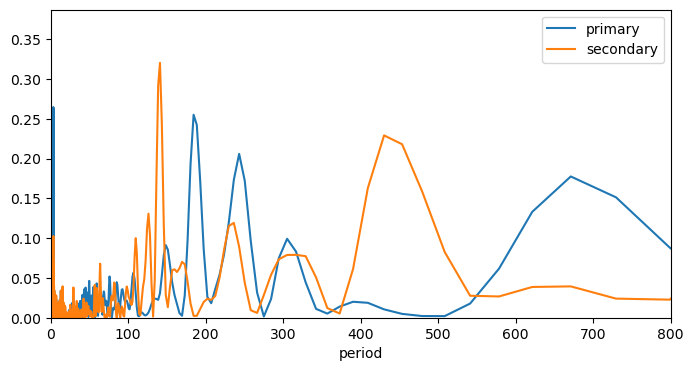

In [67]:
frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower()

fig, ax = plt.subplots(figsize=(8, 4))

plt.plot(1/frequency, power, label = 'primary')

if t0_secondary is not None:
    frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()
    plt.plot(1/frequency_s, power_s, label = 'secondary')

plt.xlabel("period")

plt.legend()
plt.xlim(0, 2500)
plt.ylim(0, None)
plt.show()


if True:
    fig, ax = plt.subplots(figsize=(8, 4))

    plt.plot(1/frequency, power, label = 'primary')

    if t0_secondary is not None:
        plt.plot(1/frequency_s, power_s, label = 'secondary')

    plt.xlabel("period")

    plt.legend()
    plt.xlim(0, 800)
    plt.ylim(0, None)
    plt.show()

## O-C plot, folded

- for periodic trend in O-C

In [68]:
def truncate_freq_power_to_period_range(freq, power, period_min, period_max):
    f, p = freq, power
    if period_min is not None:
        f, p = f[f < 1 / period_min], p[f < 1 / period_min]
    if period_max is not None:
        f, p = f[f > 1 / period_max], p[f >  1 / period_max]
    return f, p


def plot_oc_folded(period_min=None, period_max=None, period_min_s=None, period_max_s=None, period=None, period_s=None):

    if period is None:
        _f, _p = truncate_freq_power_to_period_range(frequency, power, period_min, period_max)
        period = 1 / _f[np.argmax(_p)]
    phase_oc = etv_functions.phase_data(in_df_primary.epoch, 0, period)

    fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y * 1.1), sharex=False)
    if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
        axs = [axs]
    
    axs[0].scatter(phase_oc, in_df_primary.shift_mins, marker = 'o', s=12**2, c=in_df_primary.epoch);
    axs[0].errorbar(phase_oc, in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
                    lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'None', label="primary")
    axs[0].set_title(f"TIC {ticid}, {title_suffix}\nfolded with P={period:.4f} d", fontsize=14)

    if in_df_secondary is not None:
        if period_s is None:
            _f, _p = truncate_freq_power_to_period_range(frequency_s, power_s, period_min_s, period_max_s)
            period_s= 1 / _f[np.argmax(_p)]
        phase_oc_s = etv_functions.phase_data(in_df_secondary.epoch, 0, period_s)
        axs[1].scatter(phase_oc_s, in_df_secondary.shift_mins, marker = 'o',  s=12**2, c=in_df_secondary.epoch);
        axs[1].errorbar(phase_oc_s, in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'],
                        lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color='None', ecolor='navy', markeredgecolor = 'None', label="secondary" );
        axs[1].set_title(f"TIC {ticid}, {title_suffix}\nfolded with P={period_s:.4f} d", fontsize=14)

    for ax in axs:
        ax.set_ylabel("O - C (minutes)")
        ax.set_xlabel("Phase (Normalized)")
        ax.legend();
    plt.subplots_adjust(hspace=0.4)
    return axs

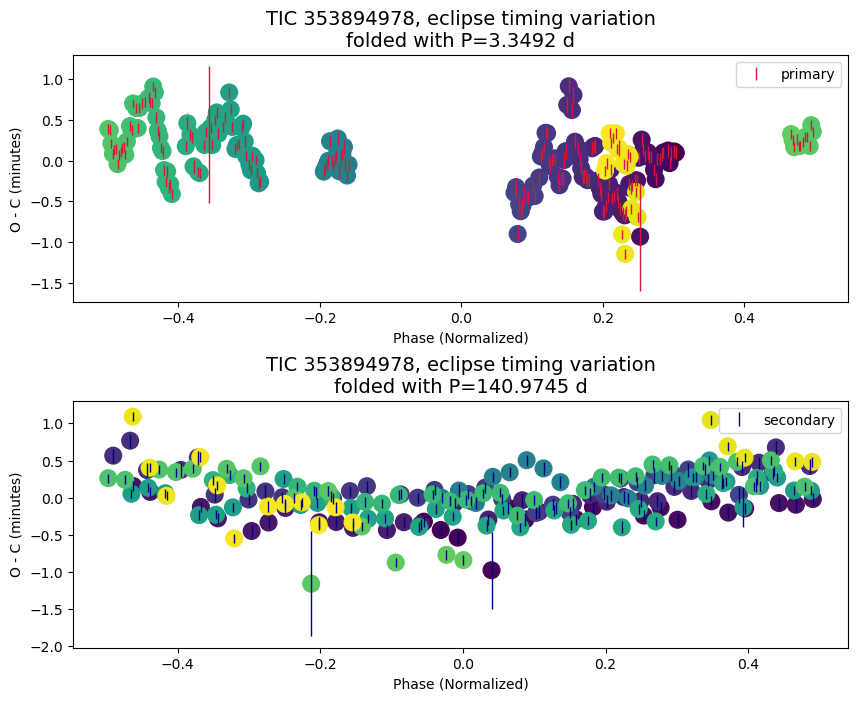

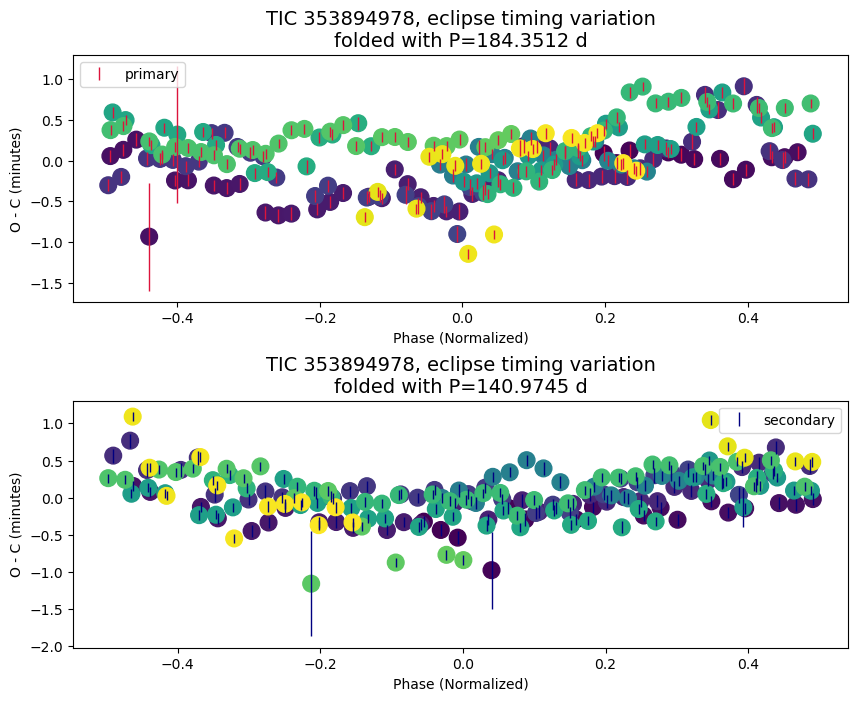

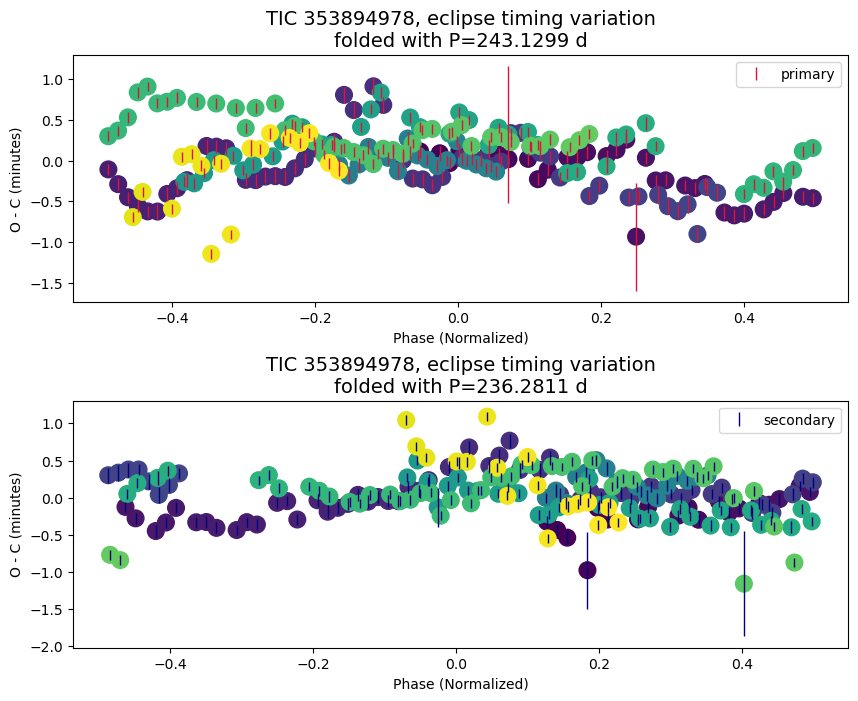

In [69]:
%matplotlib inline
# %matplotlib widget

if True:  # plot O-C periodic trend by folding with a period (from LS Periodogram by default)
    def tweak_axs(axs):
        pass

    axs = plot_oc_folded(
        period_min=None, period_max=None,
        period_min_s=None, period_max_s=None
    )
    tweak_axs(axs)

    axs = plot_oc_folded(
        period_min=100, period_max=200,
        period_min_s=100, period_max_s=200,
    )
    tweak_axs(axs)

    axs = plot_oc_folded(
        period_min=200, period_max=300,
        period_min_s=200, period_max_s=300,
    )
    tweak_axs(axs)


## Results Summary

In [73]:
# FILL-IN the ETV results / comments
has_etv = "Y"
comments = "Non-linear trend, but no strong O-C period in folded O-C. EB to SB Period ~ 1:3. A small chance actual EB Period is half (primary and secondary are almost identical). [D*0.8]"

# Eclipse depth from the model
depth_pct_p = round(-mean_alpha1 * 100, 2)
if t0_secondary is not None:
    depth_pct_s = round(-mean_alpha1_s * 100, 2)
else:
    depth_pct_s = None

summary = {
    "tic": ticid,
    "has_etv": has_etv,
    "comments": comments,
    "period": period,  # the period used in ETV analysis
    "depth_pct_p": depth_pct_p,
    "depth_pct_s": depth_pct_s,
    "epoch_p": t0_primary,
    "epoch_s": t0_secondary,
    "num_sectors": len(sr),
    "time_span": round(time[-1] - time[0], 2),
    "time_start": round(time[0], 2),
    "time_end": round(time[-1], 2),
}

summary = pd.DataFrame.from_dict(summary, orient="index")
with pd.option_context('display.max_colwidth', None, 'display.max_rows', 999, 'display.max_columns', 99):
    display(summary);

# Single line to be added to a CSV
print("")
print(summary.transpose().to_csv(
    index=False,
    header=True, 
))

,0
tic,353894978
has_etv,Y
comments,"Non-linear trend, but no strong O-C period in folded O-C. EB to SB Period ~ 1:3. A small chance actual EB Period is half (primary and secondary are almost identical). [D*0.8]"
period,3.341825
depth_pct_p,24.14
depth_pct_s,24.01
epoch_p,1685.644
epoch_s,1683.973088
num_sectors,31
time_span,1684.13



tic,has_etv,comments,period,depth_pct_p,depth_pct_s,epoch_p,epoch_s,num_sectors,time_span,time_start,time_end
353894978,Y,"Non-linear trend, but no strong O-C period in folded O-C. EB to SB Period ~ 1:3. A small chance actual EB Period is half (primary and secondary are almost identical). [D*0.8]",3.341825,24.14,24.01,1685.644,1683.9730875,31,1684.13,1683.35,3367.48

